In [23]:
import pandas as pd
import numpy as np
import ast

import os
import matplotlib.pyplot as plt
import seaborn as sns
from plinder_analysis_utils import DockingAnalysisBase, PoseBustersAnalysis, PropertyAnalysis

In [24]:
PLINDER_TEST_COLUMNS = [
    "system_id", "ligand_smiles",
    # binary 
    # "ligand_is_covalent", "ligand_is_ion", "ligand_is_cofactor", "ligand_is_artifact",
    # discrete
    "system_num_protein_chains",
    "ligand_num_rot_bonds", "ligand_num_hbd", "ligand_num_hba", "ligand_num_rings",
    # continuous
    "entry_resolution", "entry_validation_molprobity", 
    "system_num_pocket_residues", "system_num_interactions",
    "ligand_molecular_weight", "ligand_crippen_clogp", 
    "ligand_num_interacting_residues", "ligand_num_neighboring_residues", "ligand_num_interactions",
]
# Create category mapping for visualization
CATEGORY_MAPPING = {
    "ligand_is_covalent": "binary",
    "ligand_is_ion": "binary",
    "ligand_is_cofactor": "binary",
    "ligand_is_artifact": "binary",
    "system_num_protein_chains": "discrete",
    "ligand_num_rot_bonds": "continuous",    
    "ligand_num_hbd": "continuous",
    "ligand_num_hba": "continuous",
    "ligand_num_rings": "continuous",
    "entry_resolution": "continuous",
    "entry_validation_molprobity": "continuous",
    "system_num_pocket_residues": "continuous",
    "system_num_interactions": "continuous",
    "ligand_molecular_weight": "continuous",
    "ligand_crippen_clogp": "continuous",
    "ligand_num_interacting_residues": "continuous",
    "ligand_num_neighboring_residues": "continuous",
    "ligand_num_interactions": "continuous",
    "ligand_is_artifact": "binary"     
}

In [25]:
df_combined = pd.read_csv("plinder_set_0_annotated.csv")

/var/folders/bb/dyy85zps4_lg79d6g6g48ms00000gn/T/ipykernel_21036/2737273468.py:1: DtypeWarning: Columns (78) have mixed types. Specify dtype option on import or set low_memory=False.
  df_combined = pd.read_csv("plinder_set_0_annotated.csv")


In [26]:
# build a boolean mask: drop any row where covalent, ionic or has_ion is True
# mask = ~(
#     df_combined['ligand_is_covalent'] |
#     df_combined['ligand_is_ion'] |
#     df_combined['has_ion'] |
#     df_combined['ligand_is_cofactor']
# )

# # filter and reset index
# df_combined = df_combined.loc[mask].reset_index(drop=True)
print("Filtered shape:", df_combined.shape)

Filtered shape: (26726, 154)


In [27]:
# First analyze multiple properties
property_analysis = PropertyAnalysis(df_combined)
methods = ["surfdock", "gnina", "chai-1", "diffdock_pocket_only", "icm", "vina"]

## Universal Analysis 

Analyzing system_num_protein_chains for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of discrete property 'system_num_protein_chains':
Categories: [1.0, 2.0, 3.0, 4.0]
Counts (success vs failure):
  system_num_protein_chains  success_count  failure_count
0                       1.0             84            186
1                       2.0              0             42
2                       3.0              0             12
3                       4.0              0              6
Chi-square test: statistic=25.041, p-value=0.000015
Significant distribution difference between success and failure groups.


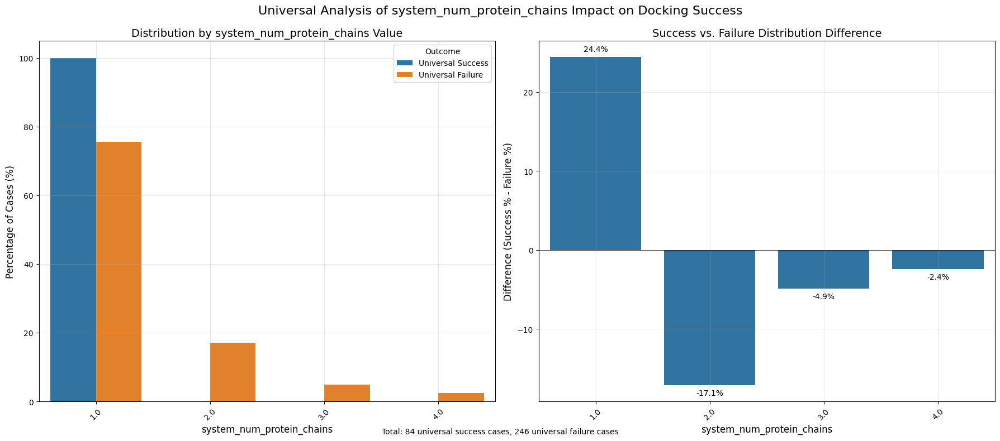

Analyzing ligand_num_rot_bonds for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_rot_bonds':
Success cases: n=96, mean=5.714, std=3.514
Failure cases: n=330, mean=9.244, std=5.719
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 0.665
Chi-square test for distribution: p=0.000471


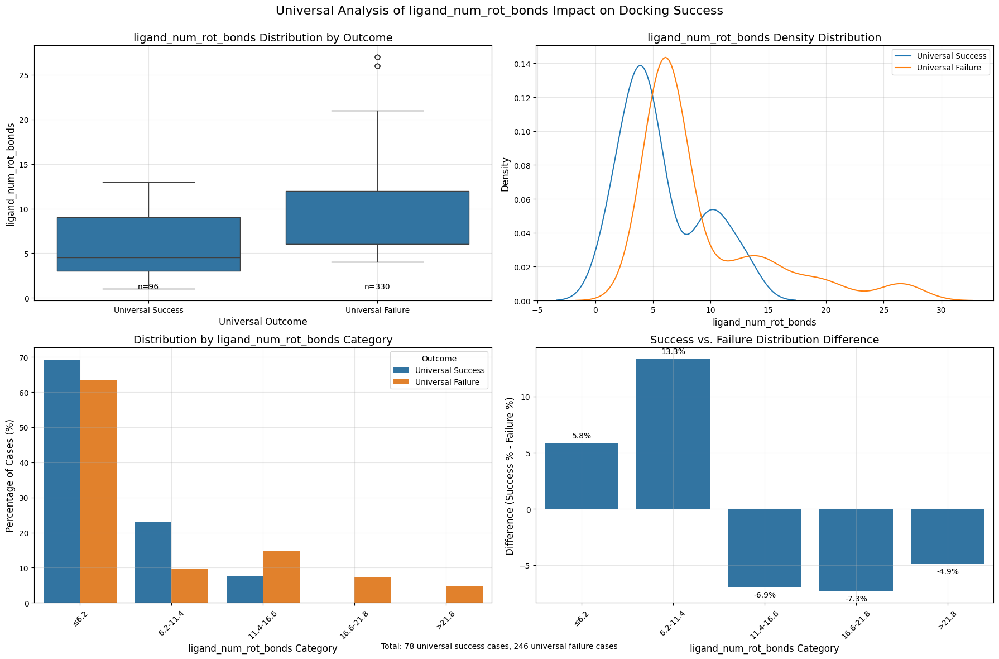

Analyzing ligand_num_hbd for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_hbd':
Success cases: n=96, mean=2.357, std=2.269
Failure cases: n=330, mean=7.244, std=1.989
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.378
Chi-square test for distribution: p=0.000000


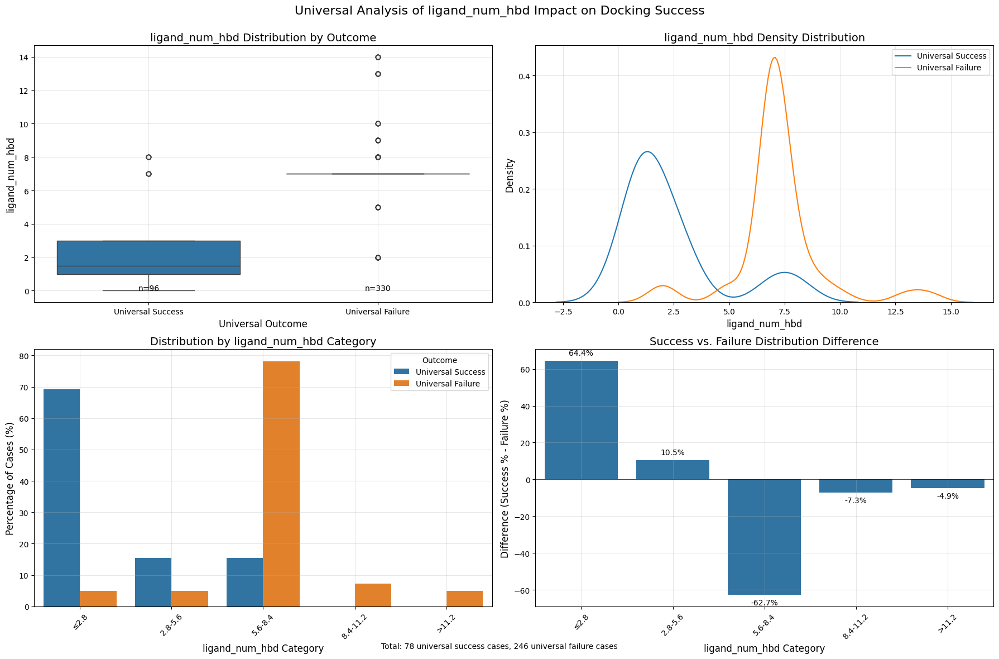

Analyzing ligand_num_hba for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_hba':
Success cases: n=96, mean=5.786, std=2.499
Failure cases: n=330, mean=9.659, std=2.510
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.545


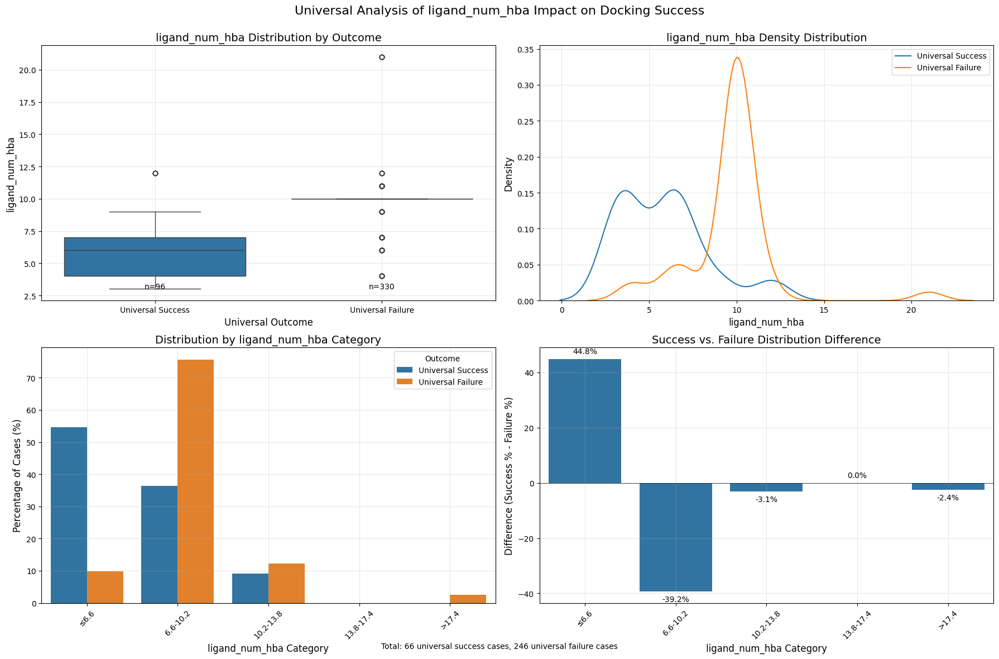

Analyzing ligand_num_rings for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_rings':
Success cases: n=96, mean=3.000, std=1.371
Failure cases: n=330, mean=1.634, std=0.906
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.328
Chi-square test for distribution: p=0.000000


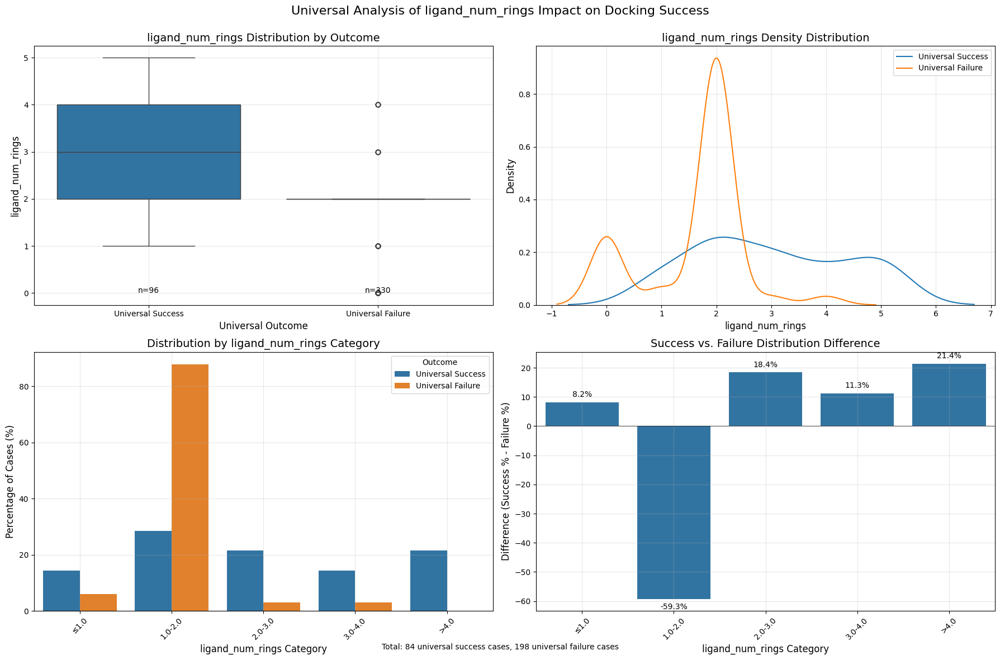

Analyzing entry_resolution for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'entry_resolution':
Success cases: n=96, mean=2.187, std=0.346
Failure cases: n=330, mean=2.247, std=0.483
Mann-Whitney U test: p=0.390874
Effect size (Cohen's d): 0.132
Chi-square test for distribution: p=0.000555


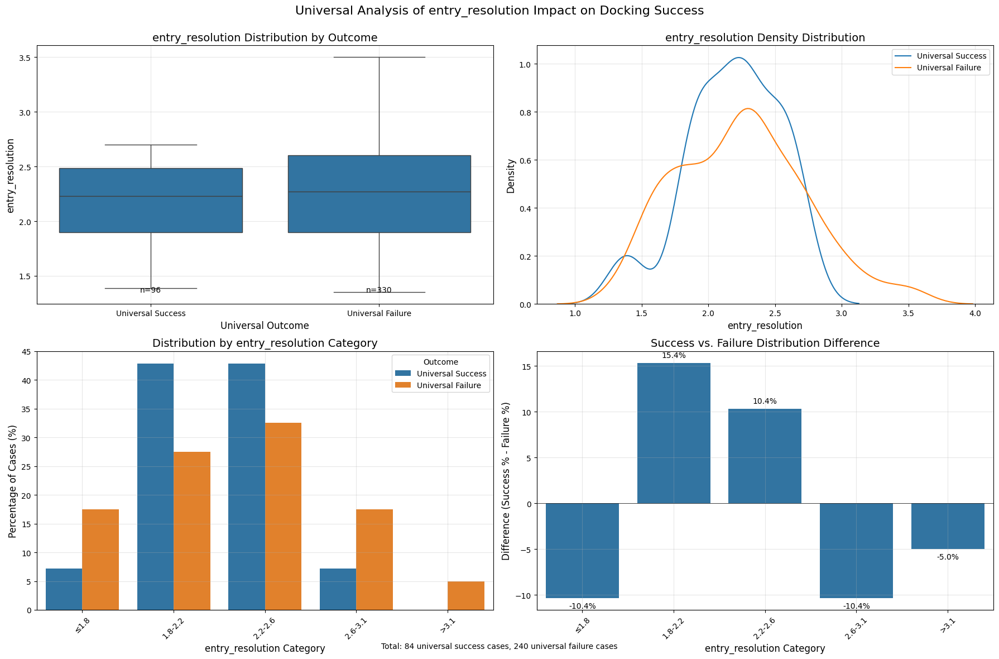

Analyzing entry_validation_molprobity for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'entry_validation_molprobity':
Success cases: n=96, mean=1.406, std=0.446
Failure cases: n=330, mean=1.473, std=0.442
Mann-Whitney U test: p=0.086113
Effect size (Cohen's d): 0.150
Chi-square test for distribution: p=0.039306


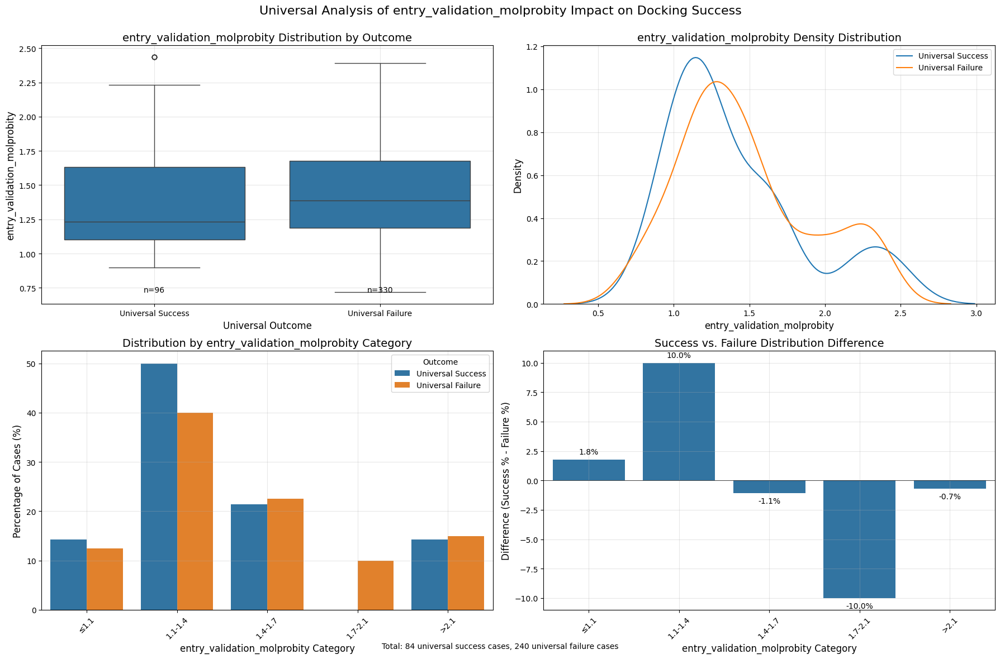

Analyzing system_num_pocket_residues for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'system_num_pocket_residues':
Success cases: n=96, mean=28.429, std=7.937
Failure cases: n=330, mean=18.683, std=16.113
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 0.664
Chi-square test for distribution: p=0.000000


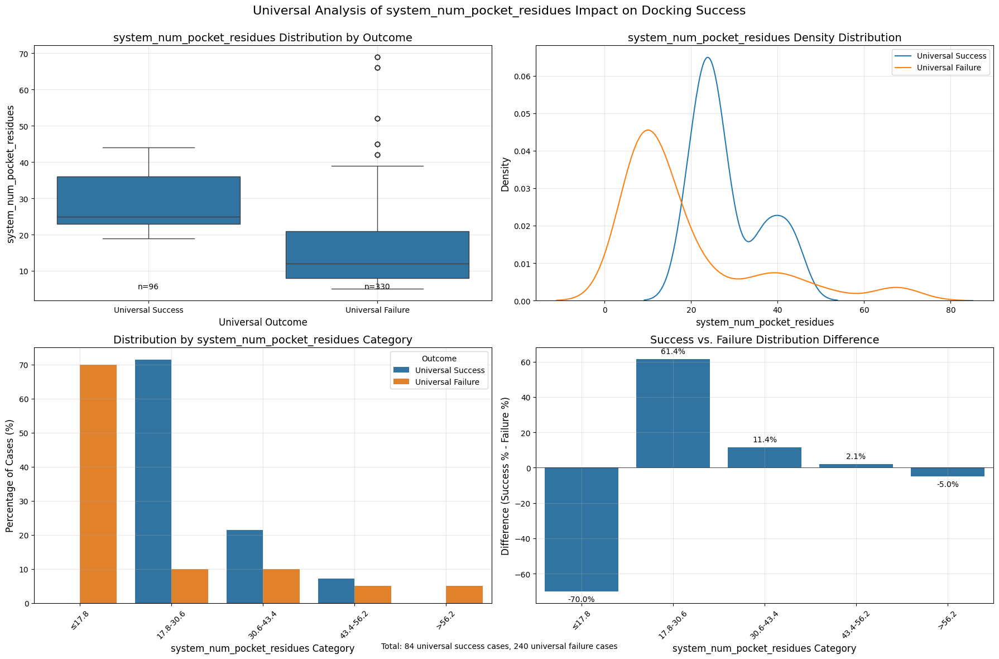

Analyzing system_num_interactions for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'system_num_interactions':
Success cases: n=96, mean=12.429, std=4.652
Failure cases: n=330, mean=8.902, std=8.286
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 0.463
Chi-square test for distribution: p=0.000000


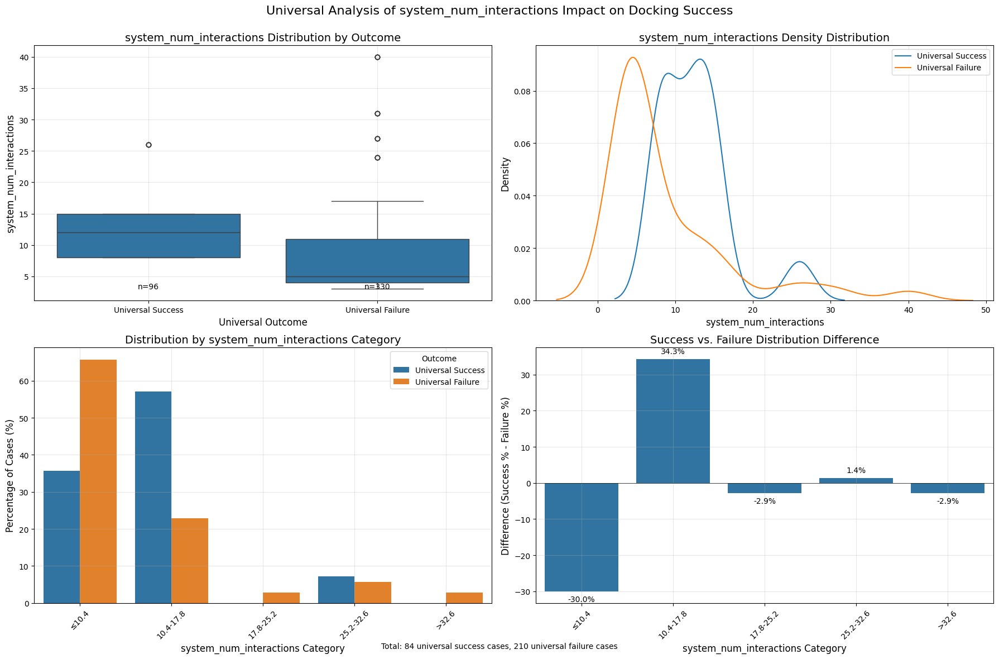

Analyzing ligand_molecular_weight for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_molecular_weight':
Success cases: n=96, mean=390.268, std=114.892
Failure cases: n=330, mean=442.862, std=104.339
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 0.492
Chi-square test for distribution: p=0.000000


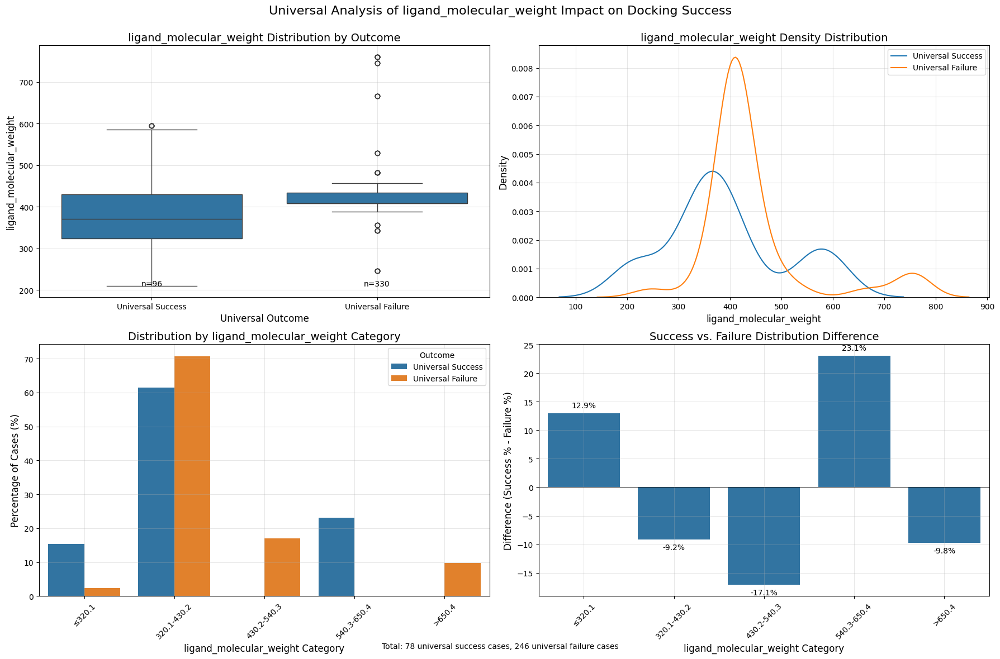

Analyzing ligand_crippen_clogp for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_crippen_clogp':
Success cases: n=96, mean=2.218, std=3.014
Failure cases: n=330, mean=-3.615, std=2.408
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.282


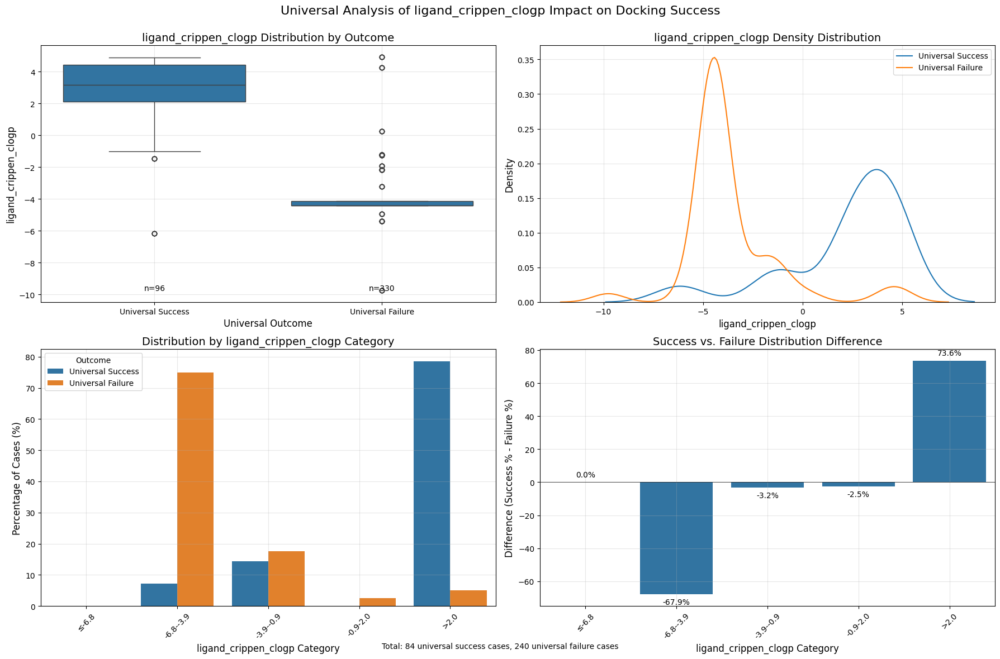

Analyzing ligand_num_interacting_residues for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_interacting_residues':
Success cases: n=96, mean=8.929, std=2.832
Failure cases: n=330, mean=4.756, std=2.663
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.544
Chi-square test for distribution: p=0.000000


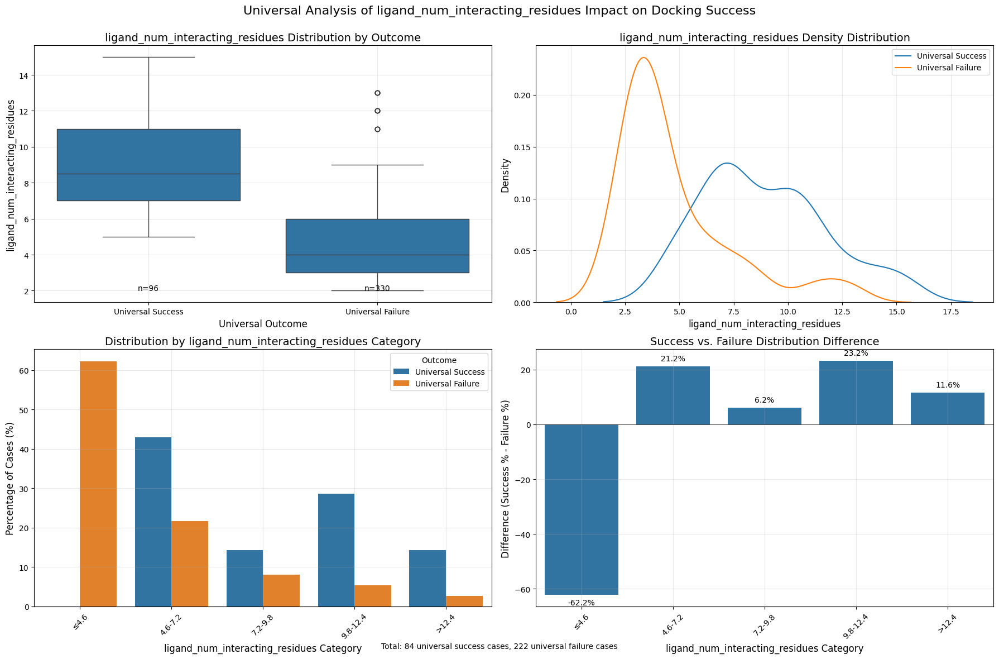

Analyzing ligand_num_neighboring_residues for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_neighboring_residues':
Success cases: n=96, mean=26.929, std=6.732
Failure cases: n=330, mean=13.439, std=6.651
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.023
Chi-square test for distribution: p=0.000000


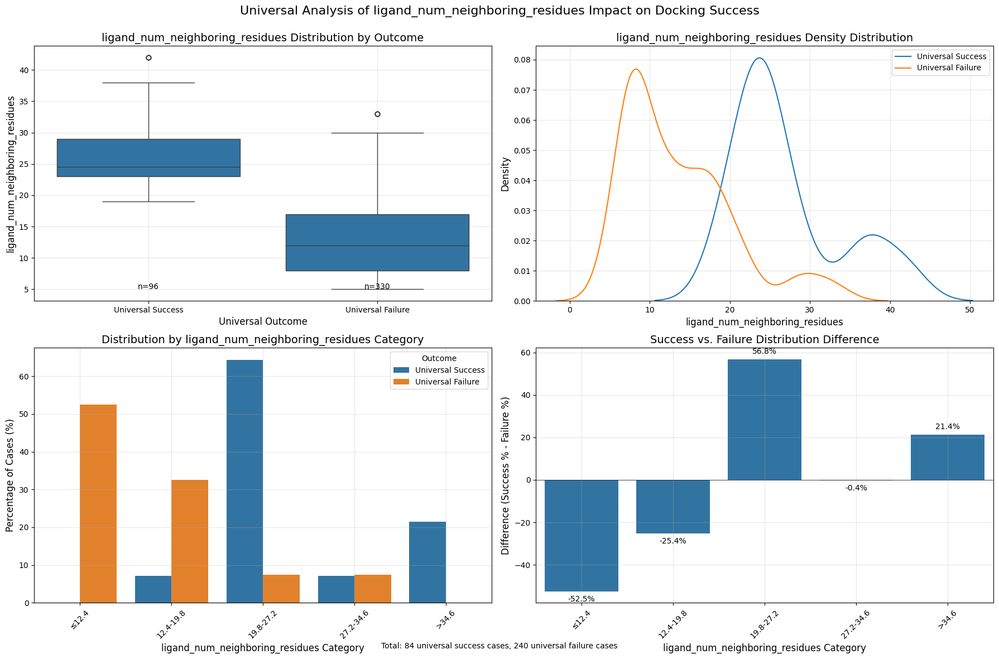

Analyzing ligand_num_interactions for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_interactions':
Success cases: n=96, mean=12.000, std=4.943
Failure cases: n=330, mean=6.634, std=4.347
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.196
Chi-square test for distribution: p=0.000000


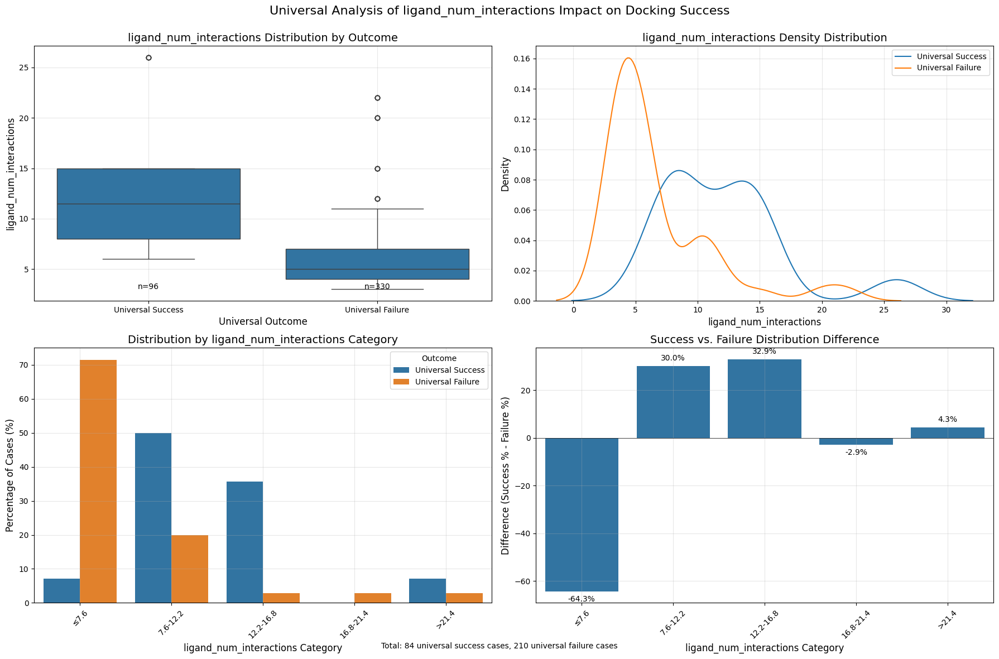

In [6]:
all_results = []

for prop in PLINDER_TEST_COLUMNS[2:]:
    # 2. Explore impact of properties on a single method
    prop_type = CATEGORY_MAPPING[prop]
    prop_analysis = property_analysis.analyze_property_universal(
        methods, prop, prop_type,
    )
    all_results.append(prop_analysis)

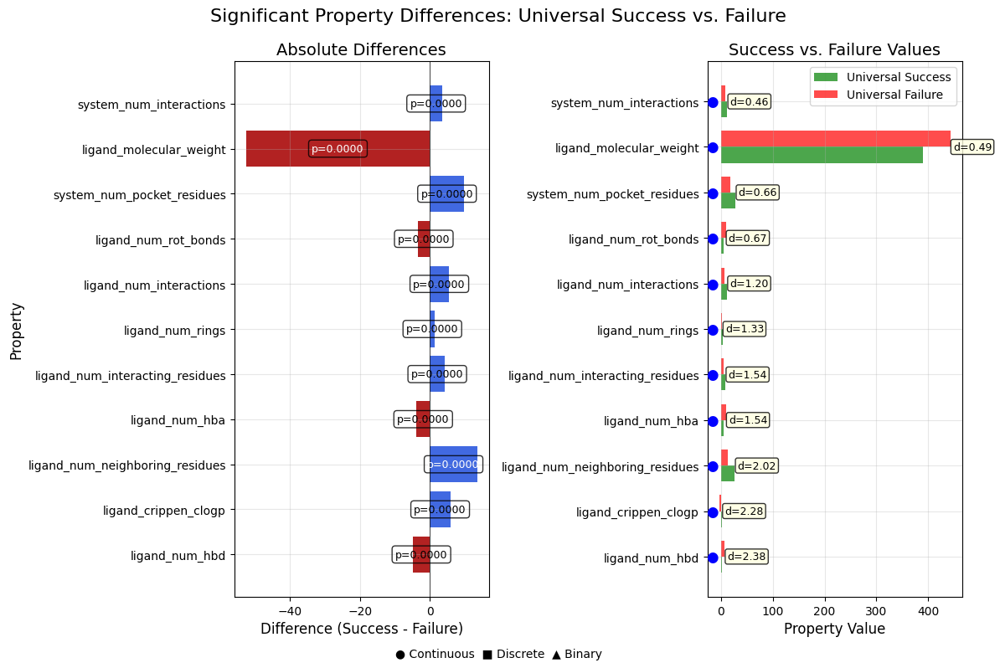

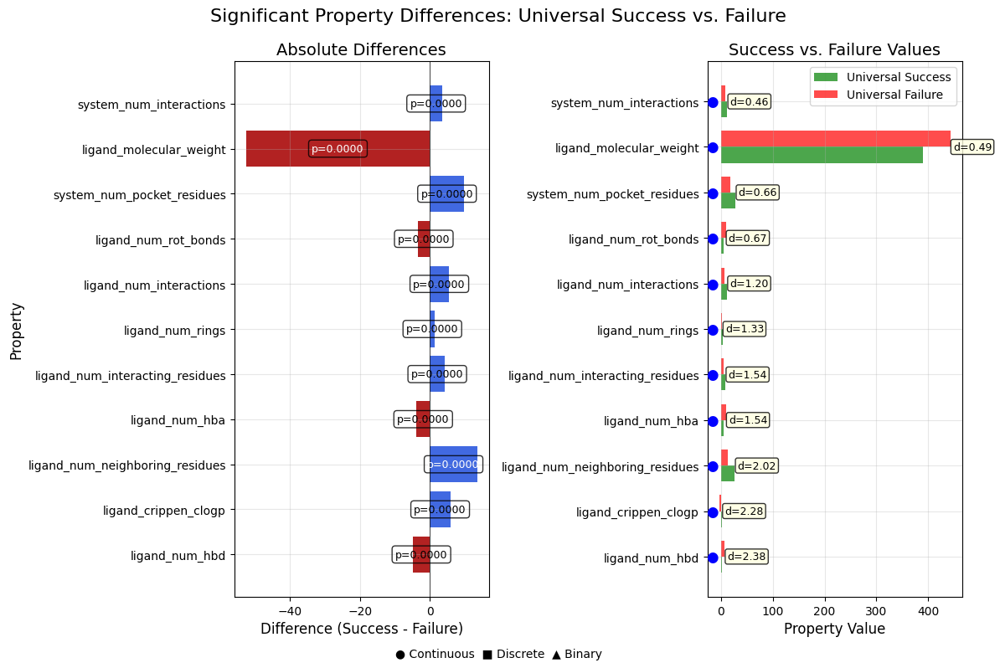

In [7]:
# Plot significant differences 
property_analysis.plot_significant_property_differences(
    all_results, 
    p_threshold=0.05,
    sort_by='effect_size'
)

## Universal first and then boil down to Single Property Analysis

In [8]:
# df_combined[df_combined['method'] == 'icm'][PLINDER_TEST_COLUMNS].isna().sum(axis=0)
# print(df_combined[df_combined['method'] == 'icm'].shape)
# # Filter for ICM method
# icm_data = df_combined[df_combined['method'] == 'icm']

# # Count rows with NaN values in PLINDER_TEST_COLUMNS
# nan_mask = icm_data[PLINDER_TEST_COLUMNS].isna().any(axis=1)
# nan_count = nan_mask.sum()
# print(f"Number of ICM rows with NaN values in test columns: {nan_count} out of {len(icm_data)}")

# # Create clean version of ICM data by dropping NaN rows
# icm_data_clean = icm_data.dropna(subset=PLINDER_TEST_COLUMNS)
# print(f"ICM data shape after dropping NaN rows: {icm_data_clean.shape}")

# # Update the original DataFrame to replace ICM data with the clean version
# mask = df_combined['method'] == 'icm'
# df_combined = pd.concat([df_combined[~mask], icm_data_clean], ignore_index=True)
# print(f"Updated combined DataFrame shape: {df_combined.shape}")

# # Check if there are any remaining NaN values in the ICM data
# remaining_nans = df_combined[df_combined['method'] == 'icm'][PLINDER_TEST_COLUMNS].isna().any(axis=1).sum()
# print(f"Remaining ICM rows with NaN values: {remaining_nans}")


#### system_num_protein_chains

Analyzing system_num_protein_chains for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'system_num_protein_chains':
Success cases: n=96, mean=1.000, std=0.000
Failure cases: n=330, mean=1.341, std=0.686
Mann-Whitney U test: p=0.000001
Effect size (Cohen's d): 0.565


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:2873: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=success_df, x=property_name, ax=axes[0, 1], label='Universal Success', common_norm=False)


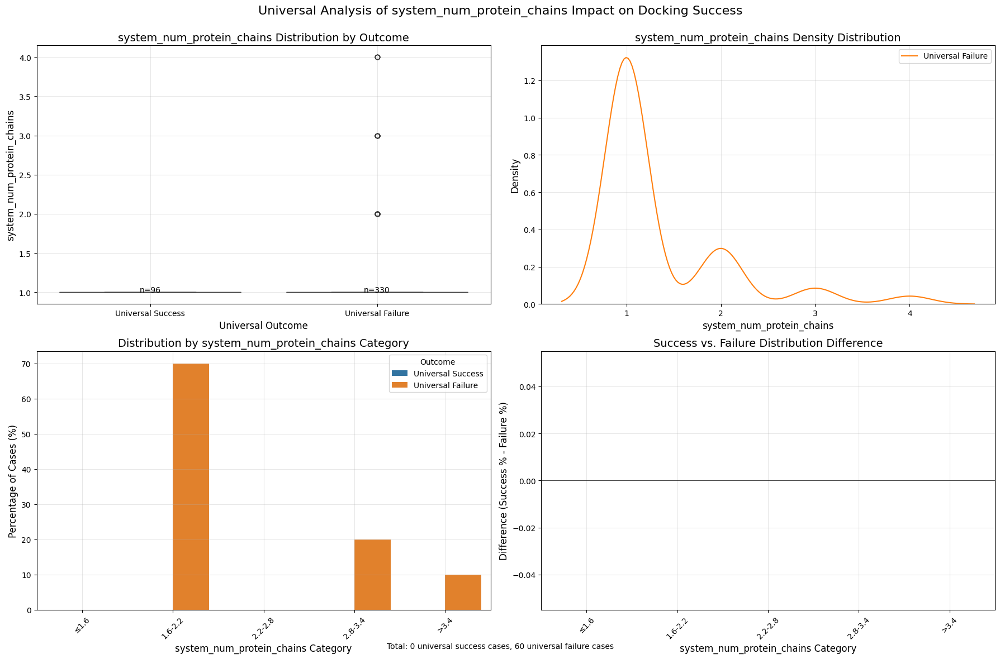

/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)
/Users/aoxu/miniconda3/envs/molpal/lib/python3.8/site-packages/statsmodels/nonparametric/smoothers_lowess.py:227: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



Impact of system_num_protein_chains on Docking RMSD for surfdock
Pearson correlation: -0.0227, p-value: 0.576324
Spearman correlation: -0.0446, p-value: 0.272338


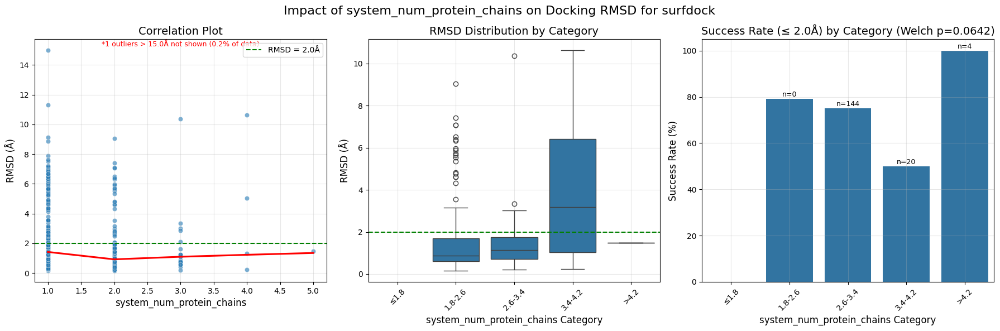


Success rates by category:
  system_num_protein_chains_category  total_count  success_rate  mean_rmsd
0                               ≤1.8            0           NaN        NaN
1                            1.8-2.6          144     79.166667   1.613070
2                            2.6-3.4           20     75.000000   1.747076
3                            3.4-4.2            4     50.000000   4.301567
4                               >4.2            1    100.000000   1.490138

ANOVA test: F=2.465, p=0.064152
Welch ANOVA p=0.064152 (used unbalanced‑sizes variant)
Kruskal–Wallis H=2.347, p=0.503557

Impact of system_num_protein_chains on Docking RMSD for gnina
Pearson correlation: -0.0145, p-value: 0.661713
Spearman correlation: -0.1109, p-value: 0.000795


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)
/Users/aoxu/miniconda3/envs/molpal/lib/python3.8/site-packages/statsmodels/nonparametric/smoothers_lowess.py:227: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


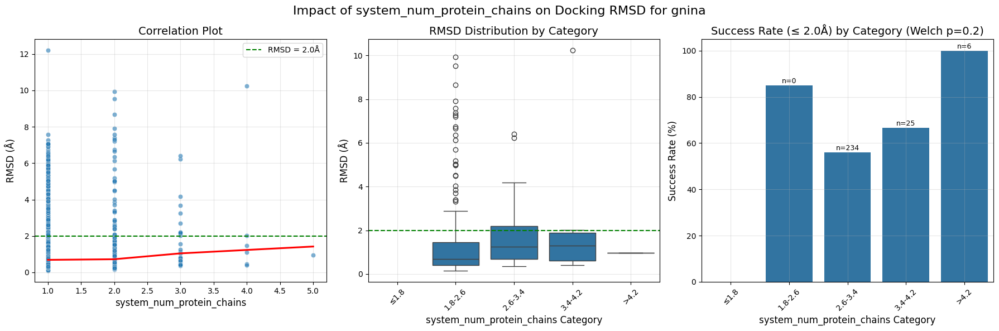


Success rates by category:
  system_num_protein_chains_category  total_count  success_rate  mean_rmsd
0                               ≤1.8            0           NaN        NaN
1                            1.8-2.6          234     85.042735   1.359397
2                            2.6-3.4           25     56.000000   1.917894
3                            3.4-4.2            6     66.666667   2.617366
4                               >4.2            1    100.000000   0.963493

ANOVA test: F=1.560, p=0.199616
Welch ANOVA p=0.199616 (used unbalanced‑sizes variant)
Kruskal–Wallis H=8.859, p=0.031225

Impact of system_num_protein_chains on Docking RMSD for chai-1
Pearson correlation: 0.2975, p-value: 0.000000
Spearman correlation: 0.2784, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)
/Users/aoxu/miniconda3/envs/molpal/lib/python3.8/site-packages/statsmodels/nonparametric/smoothers_lowess.py:227: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


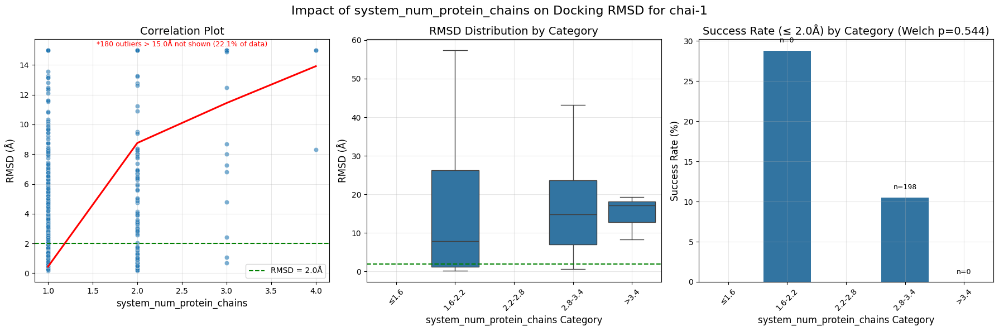


Success rates by category:
  system_num_protein_chains_category  total_count  success_rate  mean_rmsd
0                               ≤1.6            0           NaN        NaN
1                            1.6-2.2          198     28.787879  13.323614
2                            2.2-2.8            0           NaN        NaN
3                            2.8-3.4           19     10.526316  16.655192
4                               >3.4            3      0.000000  14.920062

ANOVA test: F=0.611, p=0.543725
Welch ANOVA p=0.543725 (used unbalanced‑sizes variant)
Kruskal–Wallis H=2.199, p=0.333009

Impact of system_num_protein_chains on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.1319, p-value: 0.000156
Spearman correlation: 0.0026, p-value: 0.940073


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)
/Users/aoxu/miniconda3/envs/molpal/lib/python3.8/site-packages/statsmodels/nonparametric/smoothers_lowess.py:227: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


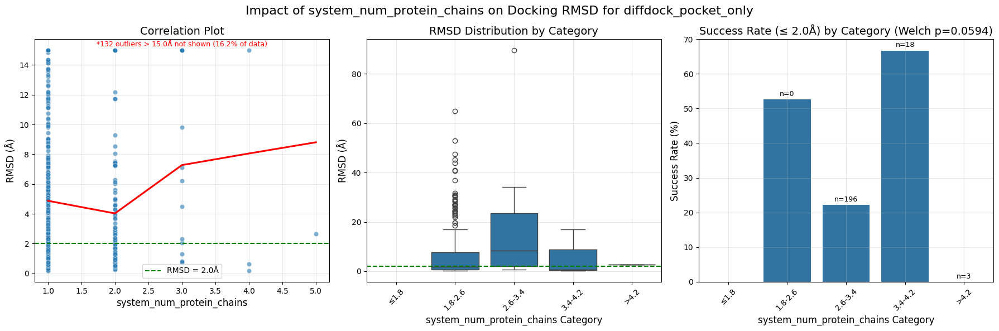


Success rates by category:
  system_num_protein_chains_category  total_count  success_rate  mean_rmsd
0                               ≤1.8            0           NaN        NaN
1                            1.8-2.6          196     52.551020   7.970089
2                            2.6-3.4           18     22.222222  16.680815
3                            3.4-4.2            3     66.666667   5.924036
4                               >4.2            1      0.000000   2.668840

ANOVA test: F=2.514, p=0.059395
Welch ANOVA p=0.059395 (used unbalanced‑sizes variant)
Kruskal–Wallis H=8.226, p=0.041564

Impact of system_num_protein_chains on Docking RMSD for icm
Pearson correlation: 0.0104, p-value: 0.759619
Spearman correlation: -0.0554, p-value: 0.101713


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)
/Users/aoxu/miniconda3/envs/molpal/lib/python3.8/site-packages/statsmodels/nonparametric/smoothers_lowess.py:227: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


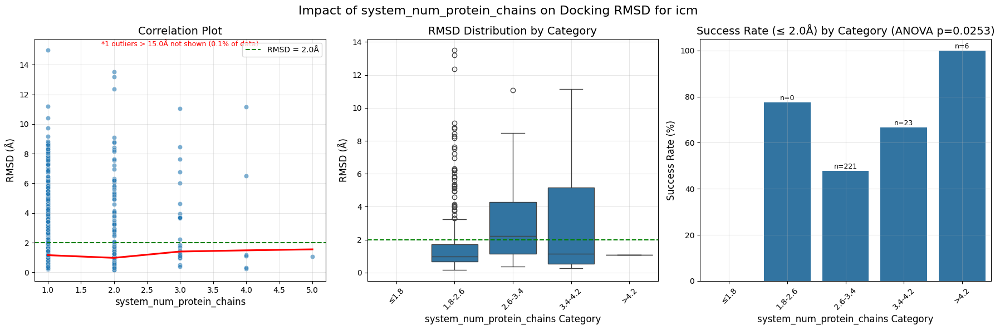


Success rates by category:
  system_num_protein_chains_category  total_count  success_rate  mean_rmsd
0                               ≤1.8            0           NaN        NaN
1                            1.8-2.6          221     77.375566   1.912414
2                            2.6-3.4           23     47.826087   3.390087
3                            3.4-4.2            6     66.666667   3.416522
4                               >4.2            1    100.000000   1.078510

ANOVA test: F=3.161, p=0.025265
Significant differences in RMSD across system_num_protein_chains categories
Welch ANOVA p=0.025265 (used unbalanced‑sizes variant)
Kruskal–Wallis H=11.590, p=0.008927

Impact of system_num_protein_chains on Docking RMSD for vina
Pearson correlation: 0.0217, p-value: 0.612737
Spearman correlation: 0.0491, p-value: 0.252164


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)
/Users/aoxu/miniconda3/envs/molpal/lib/python3.8/site-packages/statsmodels/nonparametric/smoothers_lowess.py:227: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


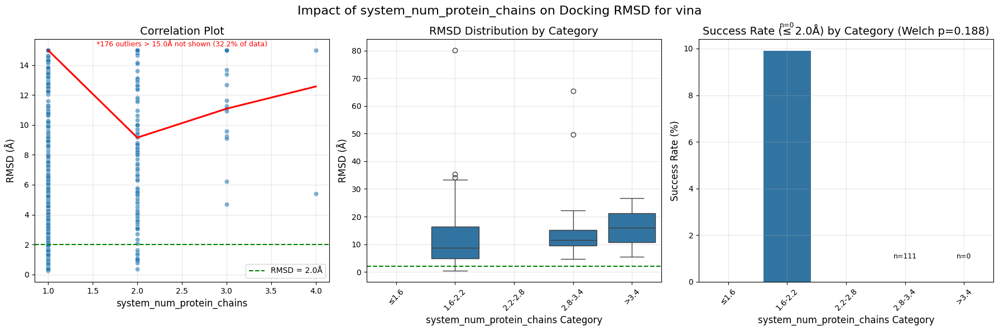


Success rates by category:
  system_num_protein_chains_category  total_count  success_rate  mean_rmsd
0                               ≤1.6            0           NaN        NaN
1                            1.6-2.2          111       9.90991  11.949433
2                            2.2-2.8            0           NaN        NaN
3                            2.8-3.4           16       0.00000  17.542276
4                               >3.4            2       0.00000  16.001531

ANOVA test: F=1.693, p=0.188125
Welch ANOVA p=0.188125 (used unbalanced‑sizes variant)
Kruskal–Wallis H=3.292, p=0.192829


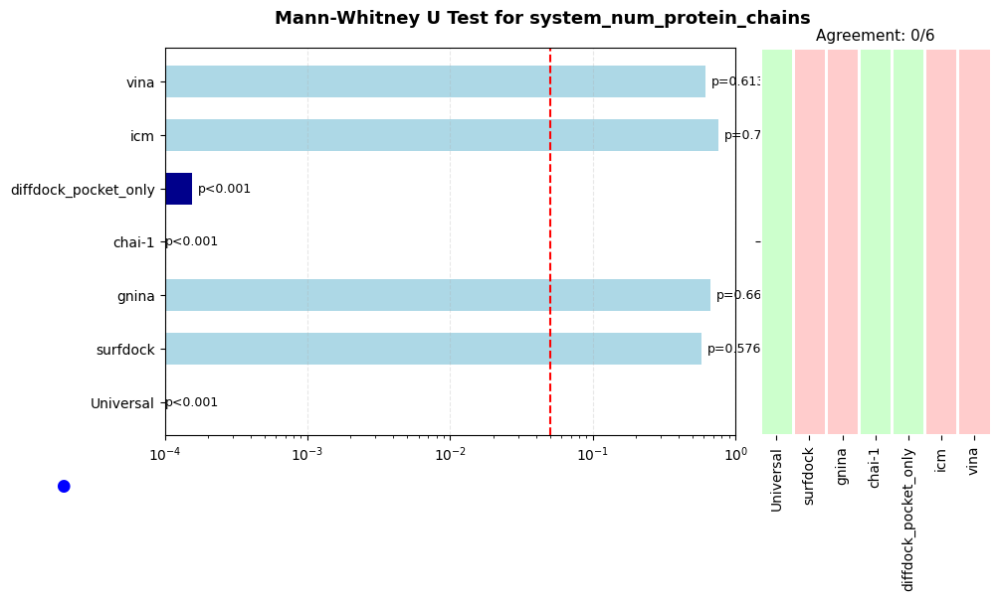

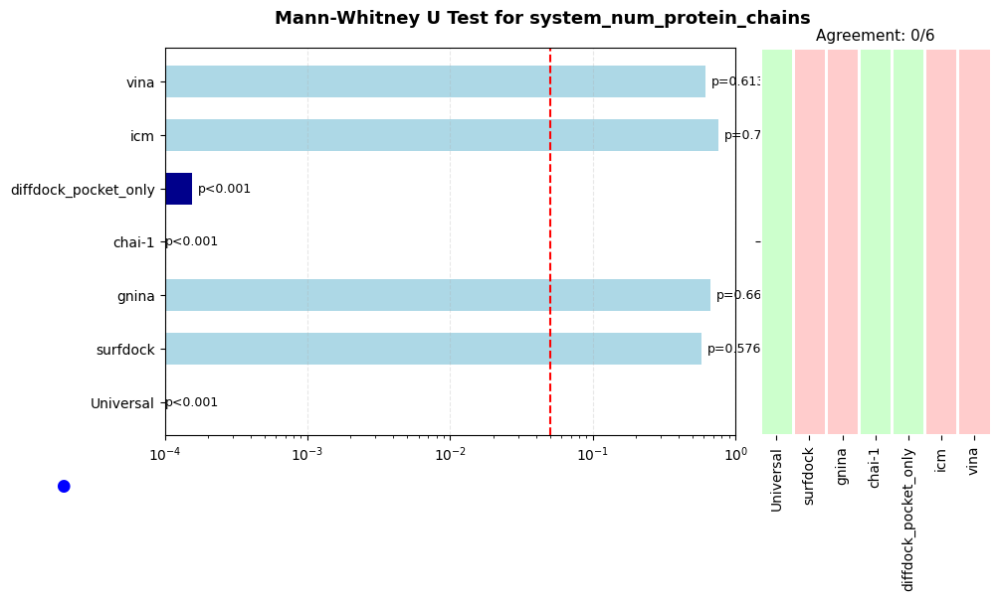

In [9]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="system_num_protein_chains",
    property_type="continuous",
    plot=True  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="system_num_protein_chains",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="system_num_protein_chains",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_rot_bonds

Analyzing ligand_num_rot_bonds for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_rot_bonds':
Success cases: n=96, mean=5.714, std=3.514
Failure cases: n=330, mean=9.244, std=5.719
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 0.665
Chi-square test for distribution: p=0.000471


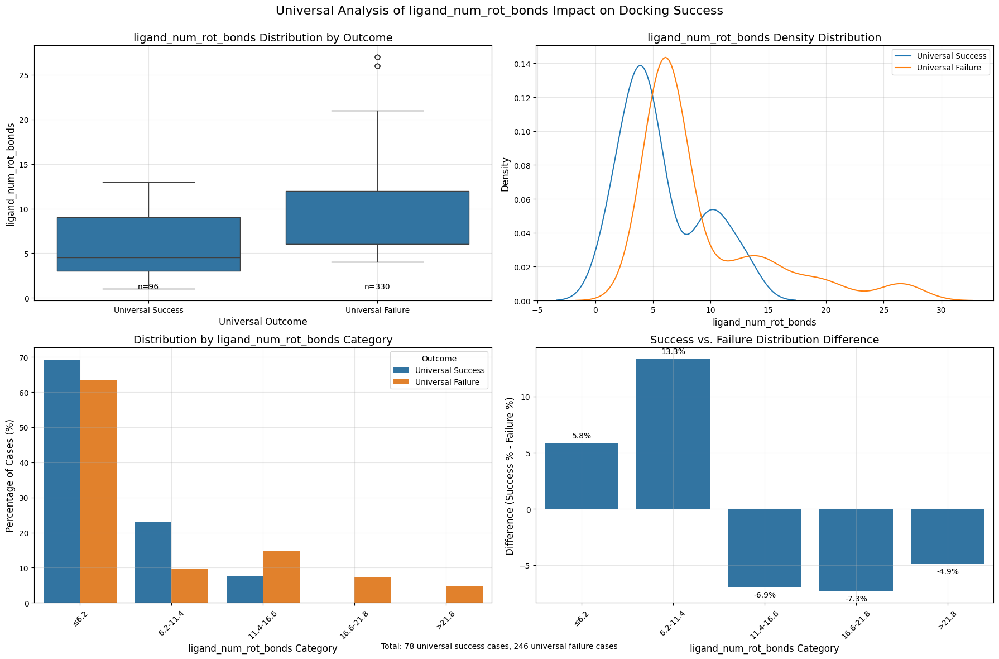

/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of ligand_num_rot_bonds on Docking RMSD for surfdock
Pearson correlation: -0.0037, p-value: 0.926900
Spearman correlation: 0.4000, p-value: 0.000000


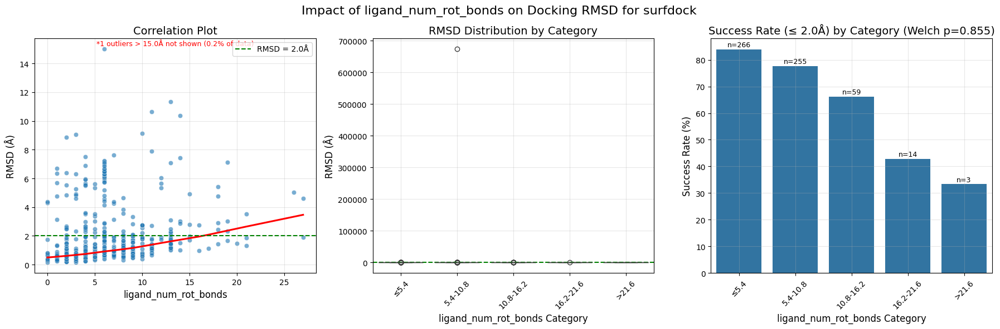


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate    mean_rmsd
0                          ≤5.4          266     83.834586     1.305252
1                      5.4-10.8          255     77.647059  2642.959181
2                     10.8-16.2           59     66.101695     2.634202
3                     16.2-21.6           14     42.857143     2.888249
4                         >21.6            3     33.333333     3.842896

ANOVA test: F=0.334, p=0.855221
Welch ANOVA p=0.855221 (used unbalanced‑sizes variant)
Kruskal–Wallis H=116.201, p=0.000000

Impact of ligand_num_rot_bonds on Docking RMSD for gnina
Pearson correlation: 0.2973, p-value: 0.000000
Spearman correlation: 0.3402, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


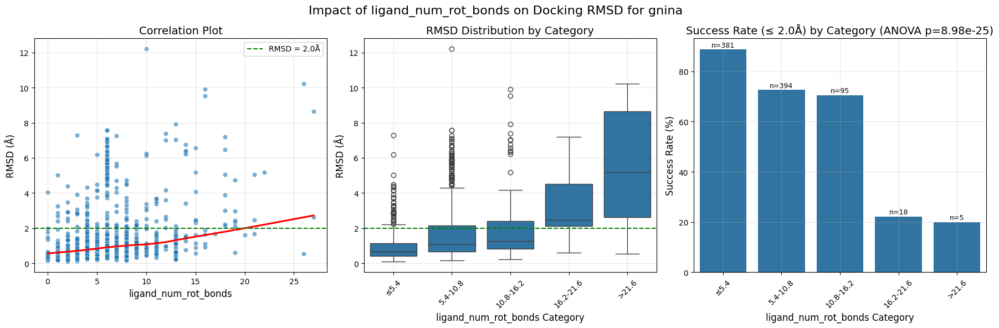


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          381     88.713911   0.969546
1                      5.4-10.8          394     72.588832   1.905110
2                     10.8-16.2           95     70.526316   2.142516
3                     16.2-21.6           18     22.222222   3.202060
4                         >21.6            5     20.000000   5.450274

ANOVA test: F=31.782, p=0.000000
Significant differences in RMSD across ligand_num_rot_bonds categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=125.307, p=0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of ligand_num_rot_bonds on Docking RMSD for chai-1
Pearson correlation: -0.0446, p-value: 0.203320
Spearman correlation: -0.0020, p-value: 0.954028


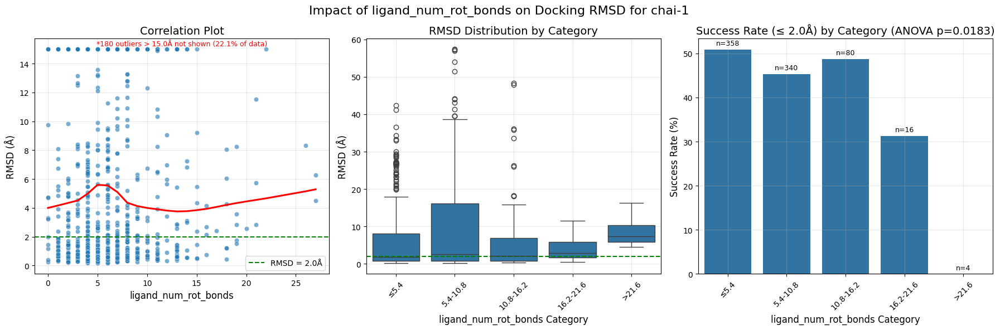


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          358     50.837989   7.071454
1                      5.4-10.8          340     45.294118   9.494024
2                     10.8-16.2           80     48.750000   6.698783
3                     16.2-21.6           16     31.250000   4.011329
4                         >21.6            4      0.000000   8.838128

ANOVA test: F=2.988, p=0.018291
Significant differences in RMSD across ligand_num_rot_bonds categories
Welch ANOVA p=0.018291 (used unbalanced‑sizes variant)
Kruskal–Wallis H=7.569, p=0.108694

Impact of ligand_num_rot_bonds on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.0010, p-value: 0.976676
Spearman correlation: 0.0476, p-value: 0.174438


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


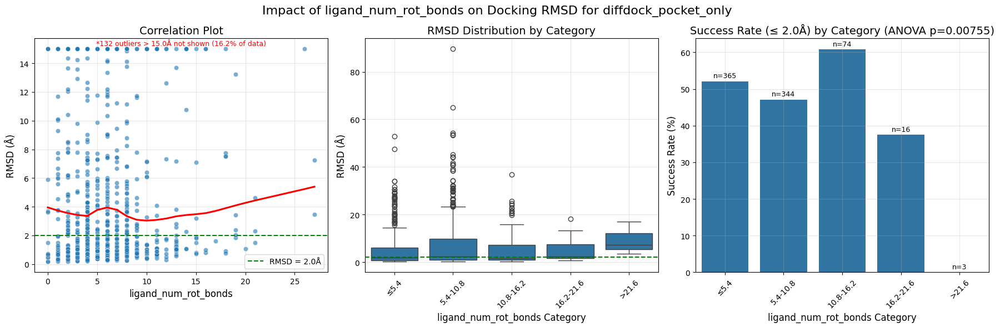


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          365     52.054795   5.451825
1                      5.4-10.8          344     47.093023   8.188038
2                     10.8-16.2           74     60.810811   5.935575
3                     16.2-21.6           16     37.500000   4.797061
4                         >21.6            3      0.000000   9.217997

ANOVA test: F=3.507, p=0.007546
Significant differences in RMSD across ligand_num_rot_bonds categories
Welch ANOVA p=0.007546 (used unbalanced‑sizes variant)
Kruskal–Wallis H=13.107, p=0.010763

Impact of ligand_num_rot_bonds on Docking RMSD for icm
Pearson correlation: 0.1956, p-value: 0.000000
Spearman correlation: 0.2644, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


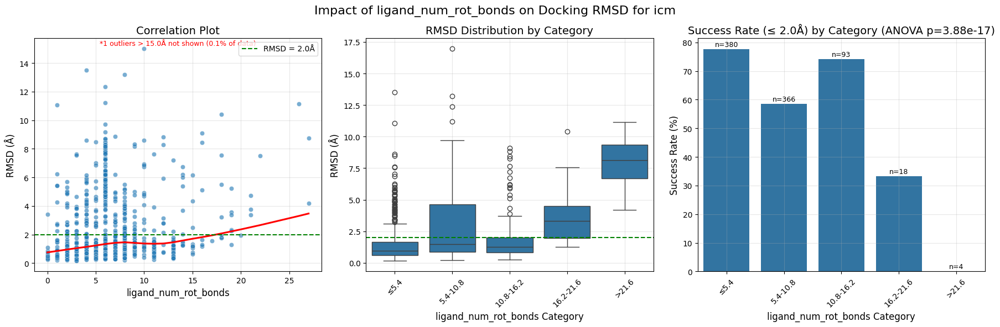


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          380     77.631579   1.585611
1                      5.4-10.8          366     58.469945   2.774437
2                     10.8-16.2           93     74.193548   2.070865
3                     16.2-21.6           18     33.333333   3.644363
4                         >21.6            4      0.000000   7.903452

ANOVA test: F=21.784, p=0.000000
Significant differences in RMSD across ligand_num_rot_bonds categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=84.352, p=0.000000

Impact of ligand_num_rot_bonds on Docking RMSD for vina
Pearson correlation: 0.0845, p-value: 0.048420
Spearman correlation: 0.0948, p-value: 0.026699


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


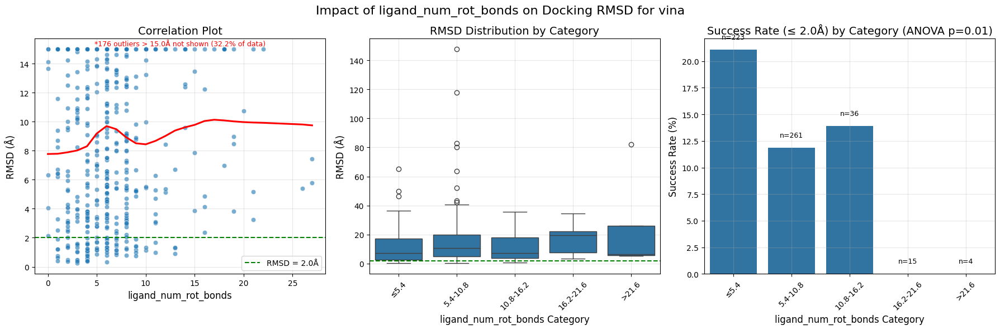


Success rates by category:
  ligand_num_rot_bonds_category  total_count  success_rate  mean_rmsd
0                          ≤5.4          223     21.076233  10.724513
1                      5.4-10.8          261     11.877395  14.335627
2                     10.8-16.2           36     13.888889  11.094183
3                     16.2-21.6           15      0.000000  16.305698
4                         >21.6            4      0.000000  25.204402

ANOVA test: F=3.352, p=0.010049
Significant differences in RMSD across ligand_num_rot_bonds categories
Welch ANOVA p=0.010049 (used unbalanced‑sizes variant)
Kruskal–Wallis H=13.618, p=0.008620


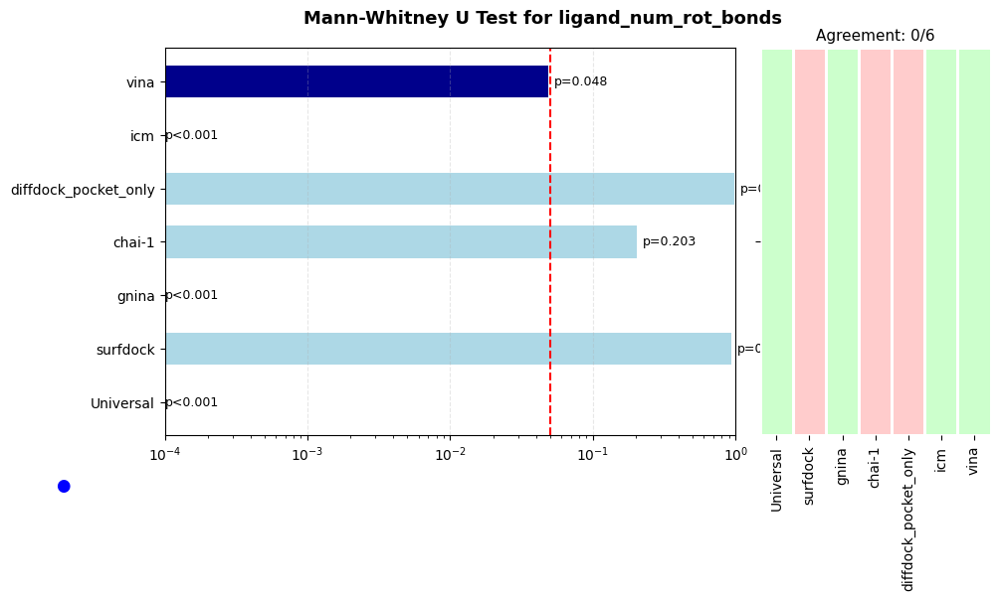

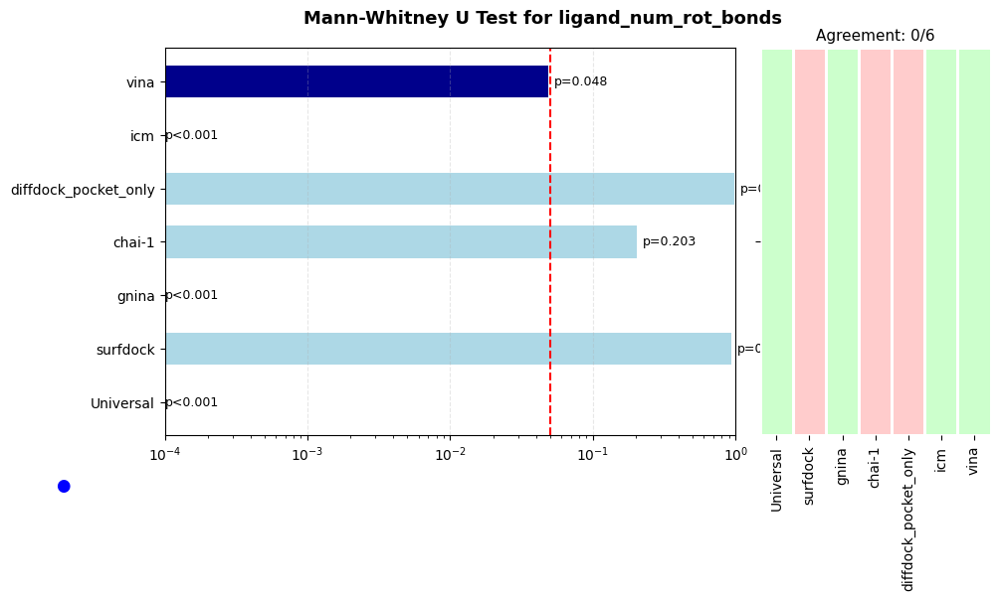

In [10]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_rot_bonds",
    property_type="continuous",
    plot=True  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_rot_bonds",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_rot_bonds",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_hbd

Analyzing ligand_num_hbd for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_hbd':
Success cases: n=96, mean=2.357, std=2.269
Failure cases: n=330, mean=7.244, std=1.989
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.378
Chi-square test for distribution: p=0.000000

Impact of ligand_num_hbd on Docking RMSD for surfdock
Pearson correlation: 0.0358, p-value: 0.378388
Spearman correlation: 0.3363, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


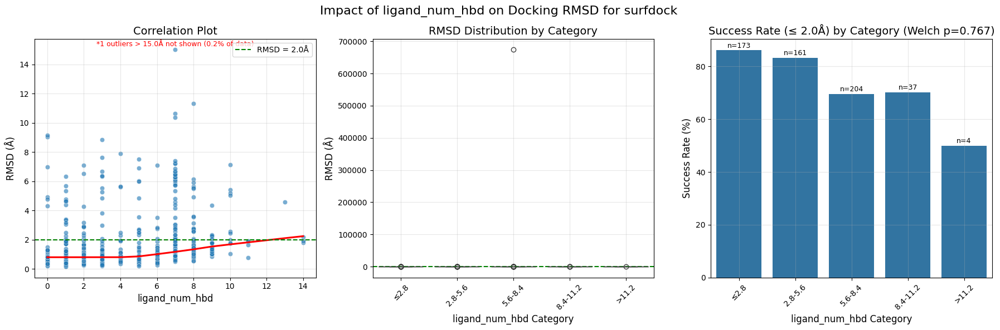


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate    mean_rmsd
0                    ≤2.8          173     86.127168     1.229482
1                 2.8-5.6          161     83.229814     1.448858
2                 5.6-8.4          204     69.607843  3303.588024
3                8.4-11.2           37     70.270270     2.103654
4                   >11.2            4     50.000000     2.619362

ANOVA test: F=0.458, p=0.766551
Welch ANOVA p=0.766551 (used unbalanced‑sizes variant)
Kruskal–Wallis H=73.630, p=0.000000

Impact of ligand_num_hbd on Docking RMSD for gnina
Pearson correlation: 0.2197, p-value: 0.000000
Spearman correlation: 0.1912, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


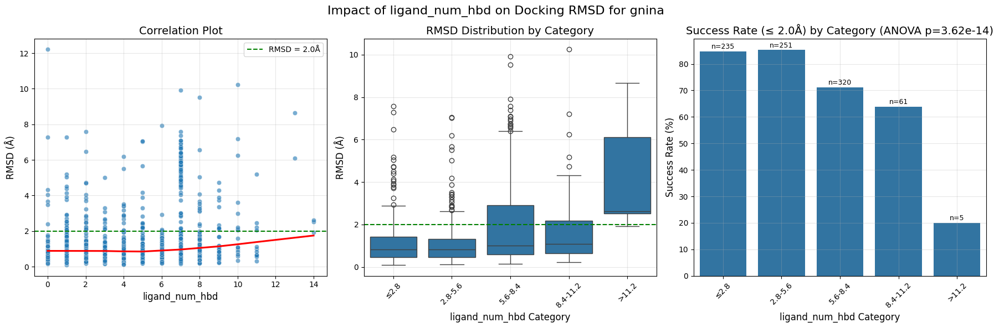


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8          235     84.680851   1.212575
1                 2.8-5.6          251     85.258964   1.144262
2                 5.6-8.4          320     71.250000   2.051713
3                8.4-11.2           61     63.934426   1.808926
4                   >11.2            5     20.000000   4.364587

ANOVA test: F=17.944, p=0.000000
Significant differences in RMSD across ligand_num_hbd categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=36.429, p=0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of ligand_num_hbd on Docking RMSD for chai-1
Pearson correlation: 0.1375, p-value: 0.000083
Spearman correlation: 0.0632, p-value: 0.071331


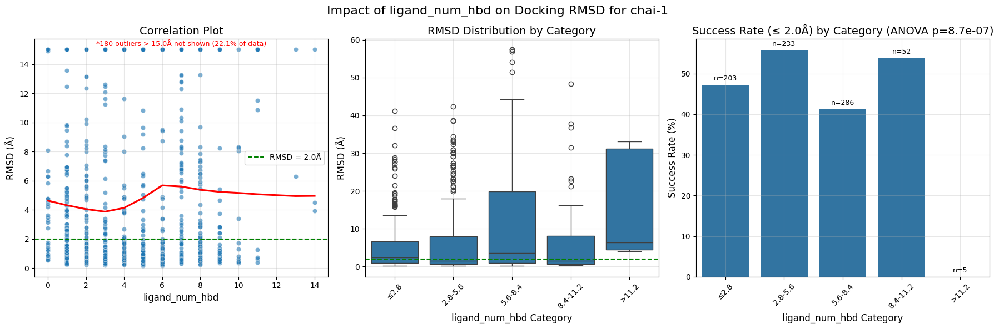


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8          203     47.290640   5.613476
1                 2.8-5.6          233     55.793991   6.971916
2                 5.6-8.4          286     41.258741  10.838692
3                8.4-11.2           52     53.846154   6.704279
4                   >11.2            5      0.000000  15.781433

ANOVA test: F=8.592, p=0.000001
Significant differences in RMSD across ligand_num_hbd categories
Welch ANOVA p=0.000001 (used unbalanced‑sizes variant)
Kruskal–Wallis H=19.192, p=0.000721

Impact of ligand_num_hbd on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.0997, p-value: 0.004340
Spearman correlation: 0.0794, p-value: 0.023217


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


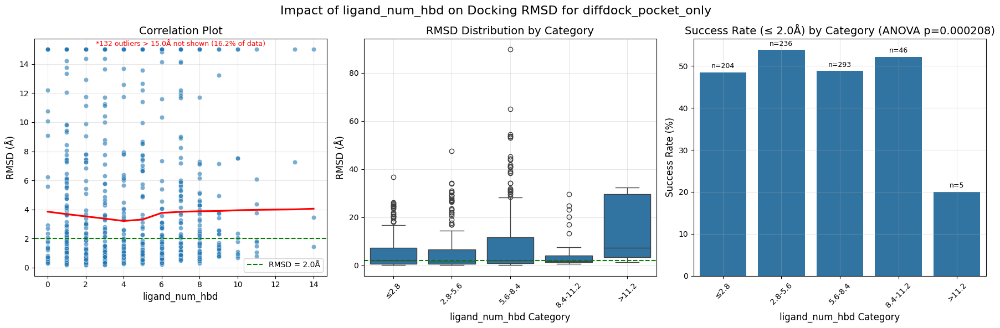


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8          204     48.529412   5.279370
1                 2.8-5.6          236     53.813559   5.626618
2                 5.6-8.4          293     48.805461   8.659352
3                8.4-11.2           46     52.173913   4.864765
4                   >11.2            5     20.000000  14.823019

ANOVA test: F=5.551, p=0.000208
Significant differences in RMSD across ligand_num_hbd categories
Welch ANOVA p=0.000208 (used unbalanced‑sizes variant)
Kruskal–Wallis H=7.637, p=0.105816

Impact of ligand_num_hbd on Docking RMSD for icm
Pearson correlation: 0.2341, p-value: 0.000000
Spearman correlation: 0.2555, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


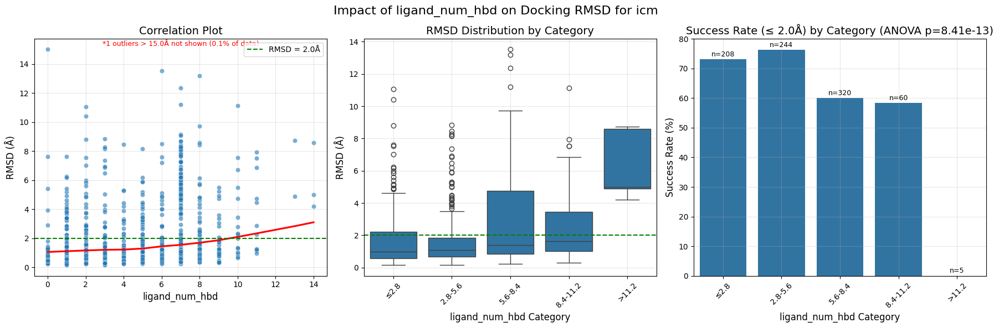


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8          208     73.076923   1.719753
1                 2.8-5.6          244     76.229508   1.683856
2                 5.6-8.4          320     60.000000   2.787828
3                8.4-11.2           60     58.333333   2.616227
4                   >11.2            5      0.000000   6.289556

ANOVA test: F=16.222, p=0.000000
Significant differences in RMSD across ligand_num_hbd categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=50.437, p=0.000000

Impact of ligand_num_hbd on Docking RMSD for vina
Pearson correlation: 0.1748, p-value: 0.000040
Spearman correlation: 0.2027, p-value: 0.000002


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


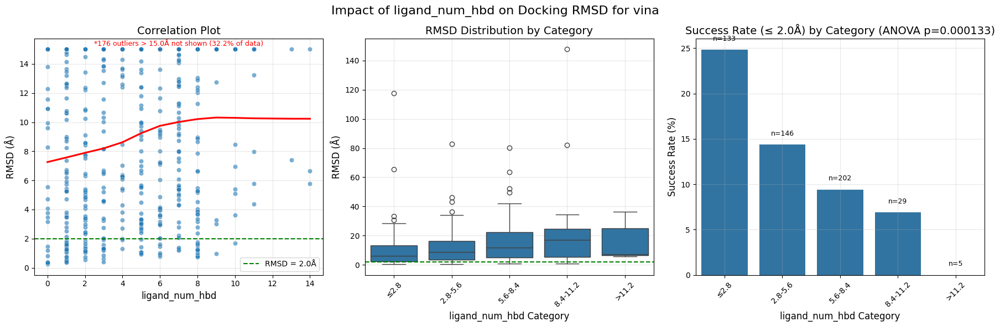


Success rates by category:
  ligand_num_hbd_category  total_count  success_rate  mean_rmsd
0                    ≤2.8          133     24.812030   9.843498
1                 2.8-5.6          146     14.383562  11.542332
2                 5.6-8.4          202      9.405941  14.395041
3                8.4-11.2           29      6.896552  21.789836
4                   >11.2            5      0.000000  16.228715

ANOVA test: F=5.841, p=0.000133
Significant differences in RMSD across ligand_num_hbd categories
Welch ANOVA p=0.000133 (used unbalanced‑sizes variant)
Kruskal–Wallis H=26.779, p=0.000022


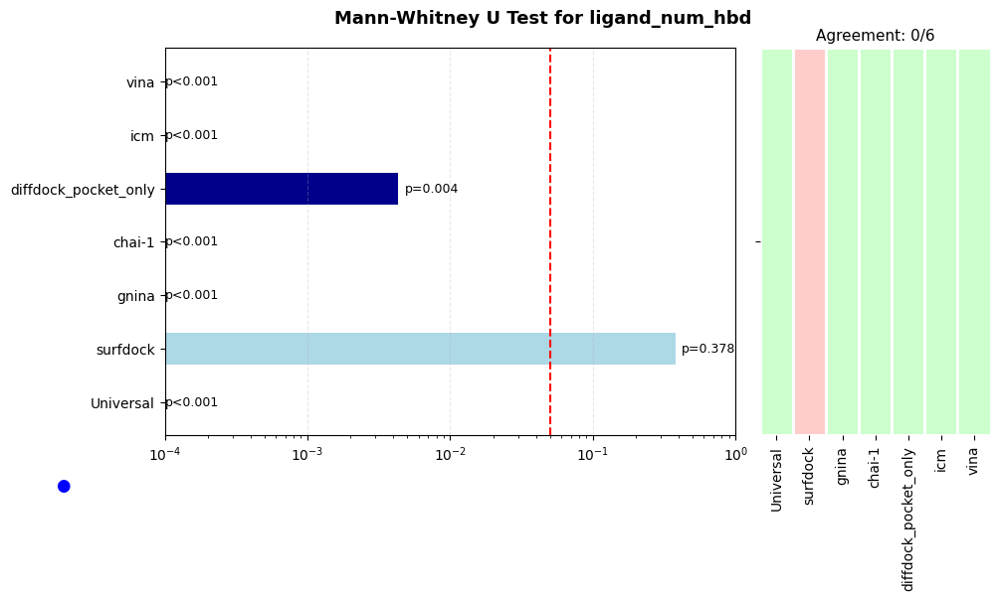

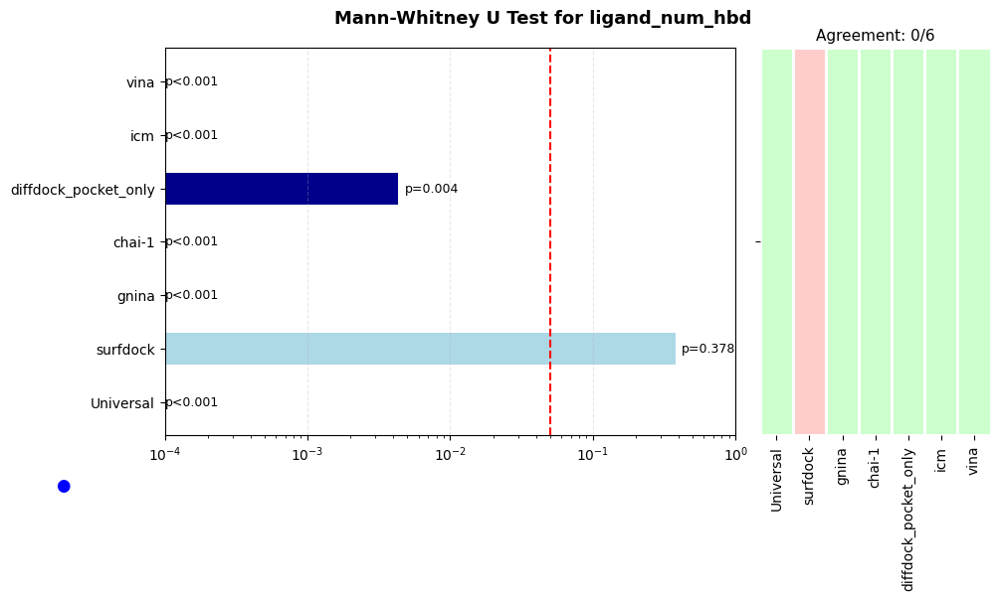

In [ ]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_hbd",
    property_type="continuous",
    plot=True  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_hbd",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_hbd",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_hba

Analyzing ligand_num_hba for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_hba':
Success cases: n=96, mean=5.786, std=2.499
Failure cases: n=330, mean=9.659, std=2.510
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.545

Impact of ligand_num_hba on Docking RMSD for surfdock
Pearson correlation: 0.0172, p-value: 0.672073
Spearman correlation: 0.3422, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


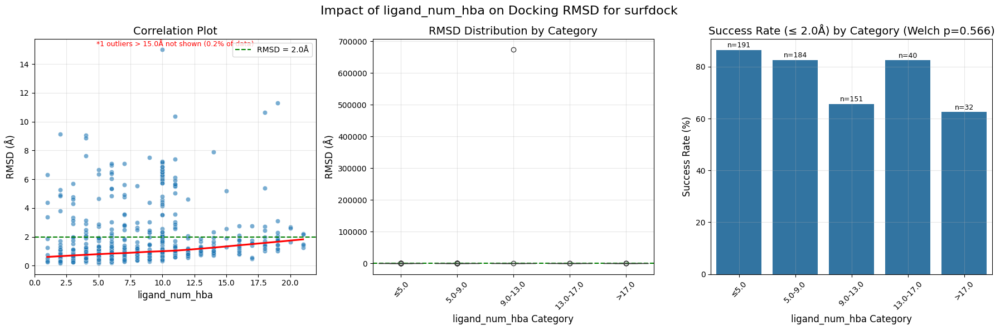


Success rates by category:
  ligand_num_hba_category  total_count  success_rate    mean_rmsd
0                    ≤5.0          191     86.387435     1.279521
1                 5.0-9.0          184     82.608696     1.396936
2                9.0-13.0          151     65.562914  4462.634303
3               13.0-17.0           40     82.500000     1.640015
4                   >17.0           32     62.500000     2.465629

ANOVA test: F=0.739, p=0.565558
Welch ANOVA p=0.565558 (used unbalanced‑sizes variant)
Kruskal–Wallis H=94.853, p=0.000000

Impact of ligand_num_hba on Docking RMSD for gnina
Pearson correlation: 0.0674, p-value: 0.041812
Spearman correlation: 0.1030, p-value: 0.001851


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


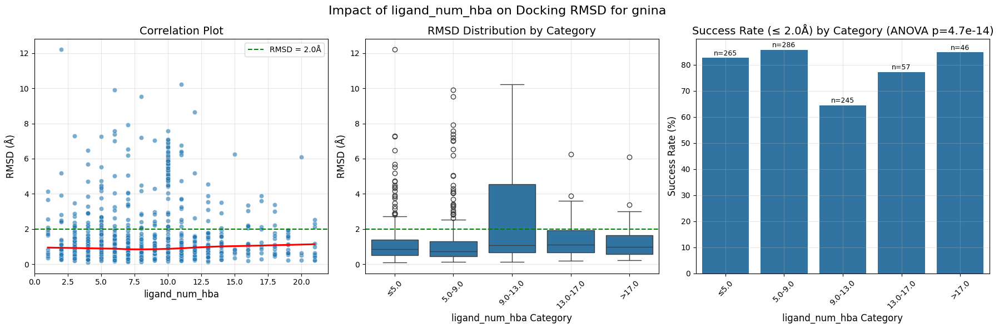


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤5.0          265     82.641509   1.285802
1                 5.0-9.0          286     85.664336   1.238447
2                9.0-13.0          245     64.489796   2.324273
3               13.0-17.0           57     77.192982   1.410616
4                   >17.0           46     84.782609   1.252077

ANOVA test: F=17.778, p=0.000000
Significant differences in RMSD across ligand_num_hba categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=43.760, p=0.000000

Impact of ligand_num_hba on Docking RMSD for chai-1
Pearson correlation: 0.0931, p-value: 0.007862
Spearman correlation: 0.0396, p-value: 0.259506


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


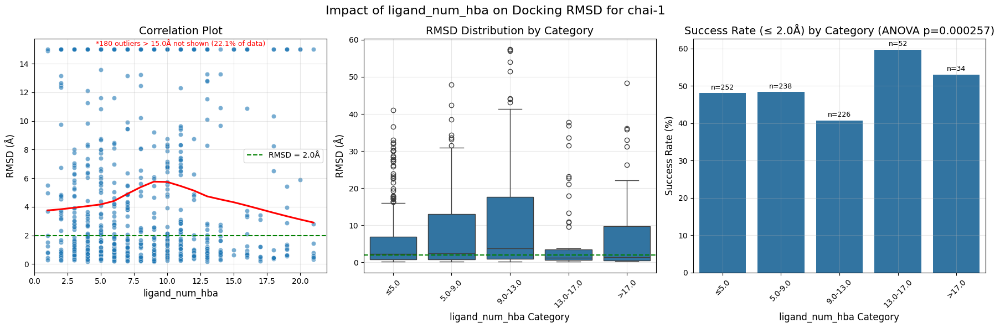


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤5.0          252     48.015873   6.159367
1                 5.0-9.0          238     48.319328   8.136131
2                9.0-13.0          226     40.707965  10.652702
3               13.0-17.0           52     59.615385   6.185110
4                   >17.0           34     52.941176   9.060705

ANOVA test: F=5.430, p=0.000257
Significant differences in RMSD across ligand_num_hba categories
Welch ANOVA p=0.000257 (used unbalanced‑sizes variant)
Kruskal–Wallis H=13.494, p=0.009099


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of ligand_num_hba on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.0195, p-value: 0.578151
Spearman correlation: 0.0286, p-value: 0.413711


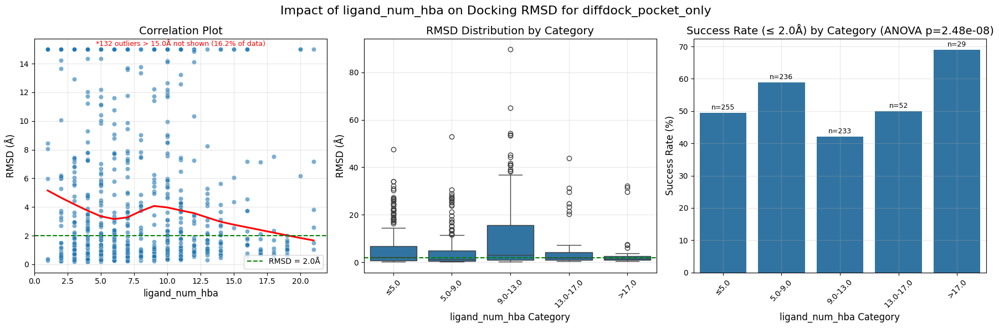


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤5.0          255     49.411765   5.778116
1                 5.0-9.0          236     58.898305   4.405202
2                9.0-13.0          233     42.060086  10.052228
3               13.0-17.0           52     50.000000   5.691205
4                   >17.0           29     68.965517   5.026091

ANOVA test: F=10.548, p=0.000000
Significant differences in RMSD across ligand_num_hba categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=37.104, p=0.000000

Impact of ligand_num_hba on Docking RMSD for icm
Pearson correlation: 0.0690, p-value: 0.041448
Spearman correlation: 0.1417, p-value: 0.000026


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


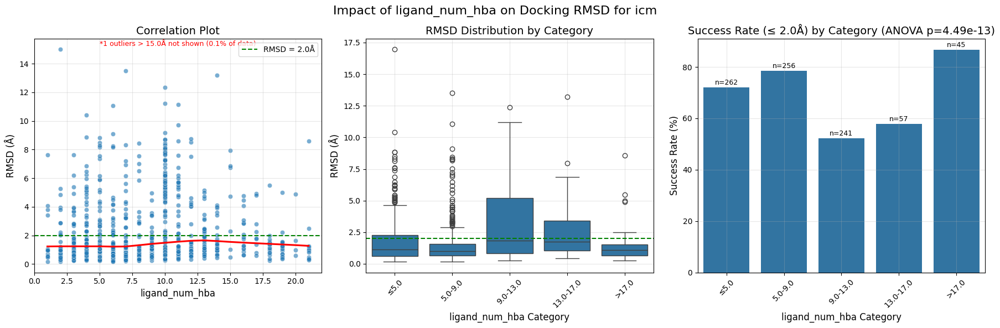


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤5.0          262     72.137405   1.907813
1                 5.0-9.0          256     78.515625   1.657276
2                9.0-13.0          241     52.282158   3.133174
3               13.0-17.0           57     57.894737   2.469586
4                   >17.0           45     86.666667   1.489827

ANOVA test: F=16.554, p=0.000000
Significant differences in RMSD across ligand_num_hba categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=54.766, p=0.000000

Impact of ligand_num_hba on Docking RMSD for vina
Pearson correlation: 0.1750, p-value: 0.000039
Spearman correlation: 0.1909, p-value: 0.000007


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


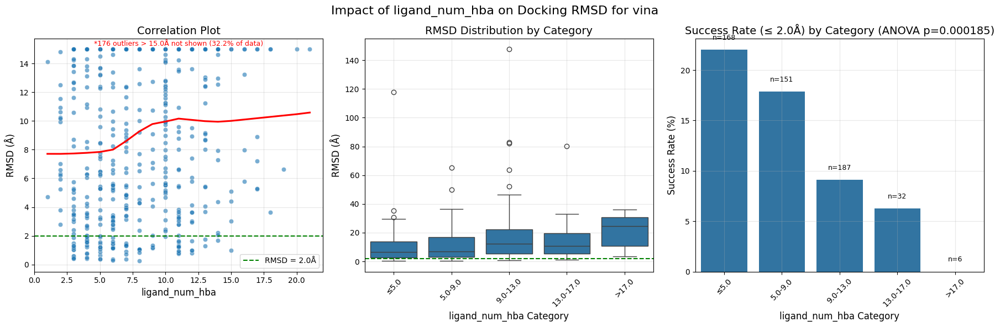


Success rates by category:
  ligand_num_hba_category  total_count  success_rate  mean_rmsd
0                    ≤5.0          168     22.023810  10.140727
1                 5.0-9.0          151     17.880795  10.968390
2                9.0-13.0          187      9.090909  15.937760
3               13.0-17.0           32      6.250000  14.665502
4                   >17.0            6      0.000000  21.337634

ANOVA test: F=5.648, p=0.000185
Significant differences in RMSD across ligand_num_hba categories
Welch ANOVA p=0.000185 (used unbalanced‑sizes variant)
Kruskal–Wallis H=28.863, p=0.000008


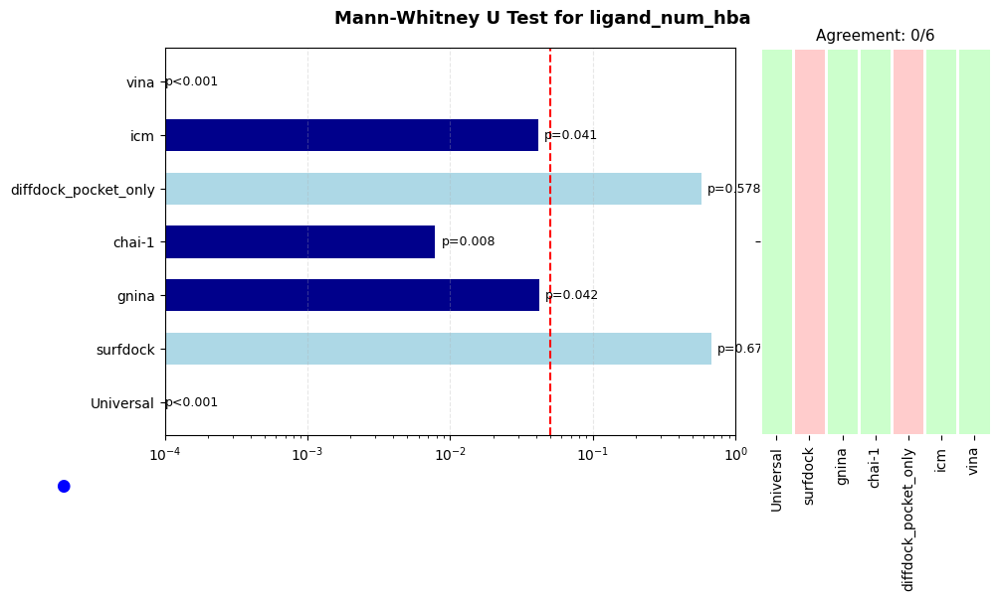

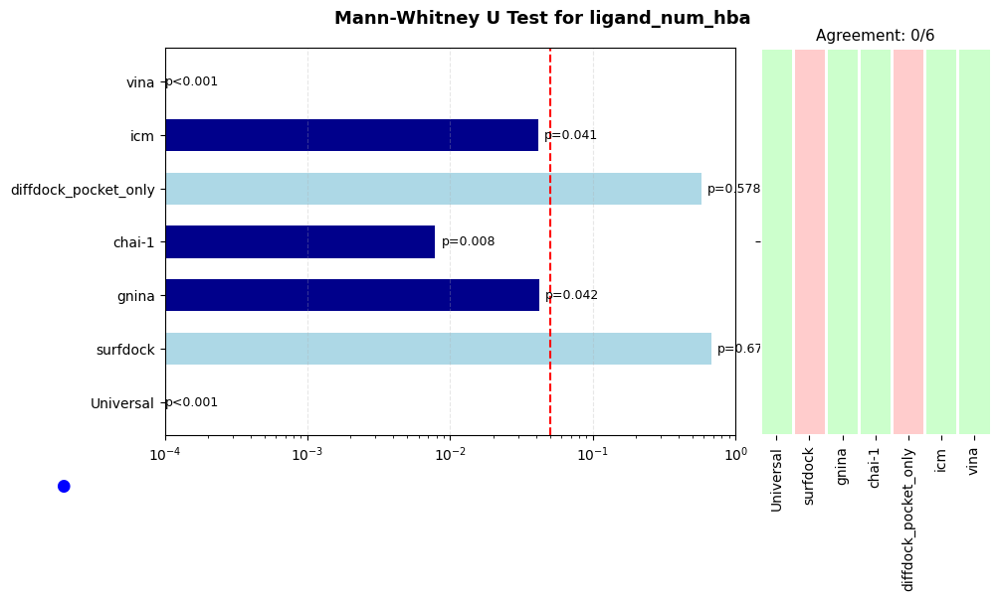

In [12]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_hba",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_hba",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_hba",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_rings

Analyzing ligand_num_rings for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_rings':
Success cases: n=96, mean=3.000, std=1.371
Failure cases: n=330, mean=1.634, std=0.906
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.328
Chi-square test for distribution: p=0.000000

Impact of ligand_num_rings on Docking RMSD for surfdock
Pearson correlation: -0.0231, p-value: 0.569896
Spearman correlation: 0.0379, p-value: 0.350386


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


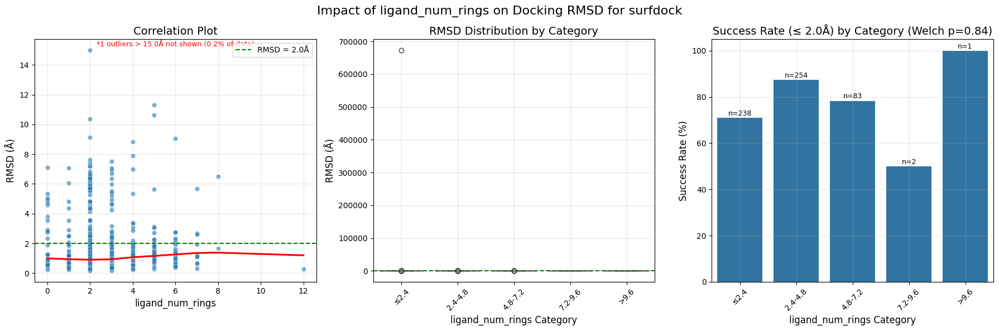


Success rates by category:
  ligand_num_rings_category  total_count  success_rate    mean_rmsd
0                      ≤2.4          238     71.008403  2831.760470
1                   2.4-4.8          254     87.401575     1.362074
2                   4.8-7.2           83     78.313253     1.750446
3                   7.2-9.6            2     50.000000     4.100988
4                      >9.6            1    100.000000     0.269246

ANOVA test: F=0.356, p=0.840121
Welch ANOVA p=0.840121 (used unbalanced‑sizes variant)
Kruskal–Wallis H=15.542, p=0.003699

Impact of ligand_num_rings on Docking RMSD for gnina
Pearson correlation: -0.2533, p-value: 0.000000
Spearman correlation: -0.2139, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


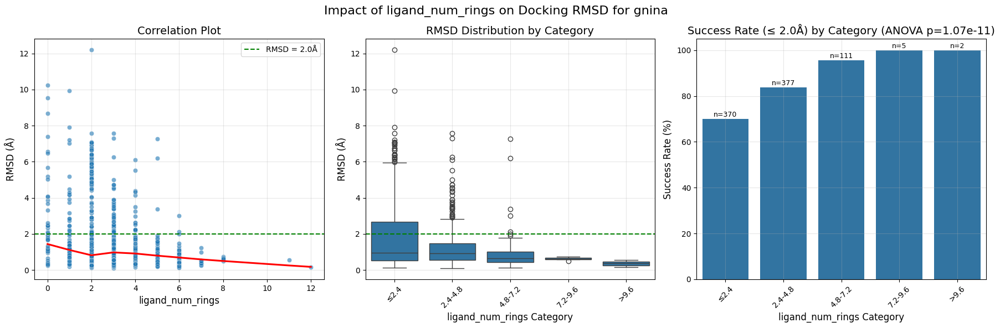


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤2.4          370     70.000000   1.960348
1                   2.4-4.8          377     83.819629   1.237911
2                   4.8-7.2          111     95.495495   0.896897
3                   7.2-9.6            5    100.000000   0.618874
4                      >9.6            2    100.000000   0.358732

ANOVA test: F=14.795, p=0.000000
Significant differences in RMSD across ligand_num_rings categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=30.339, p=0.000004

Impact of ligand_num_rings on Docking RMSD for chai-1
Pearson correlation: -0.1046, p-value: 0.002816
Spearman correlation: -0.0987, p-value: 0.004813


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


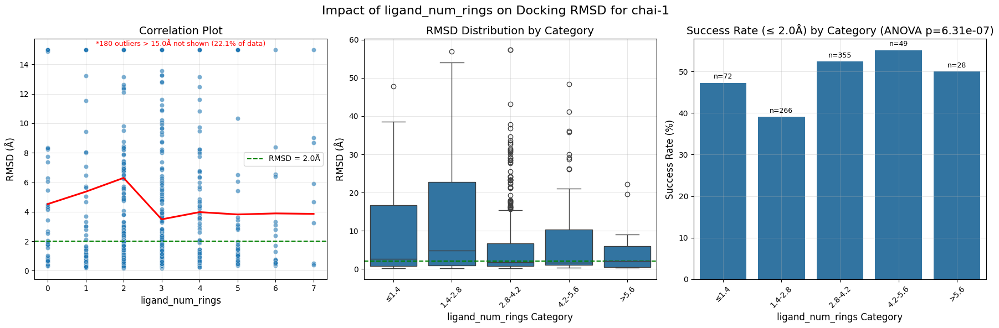


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           72     47.222222   9.241539
1                   1.4-2.8          266     39.097744  10.951103
2                   2.8-4.2          355     52.394366   6.032344
3                   4.2-5.6           49     55.102041   8.801987
4                      >5.6           28     50.000000   4.133069

ANOVA test: F=8.772, p=0.000001
Significant differences in RMSD across ligand_num_rings categories
Welch ANOVA p=0.000001 (used unbalanced‑sizes variant)
Kruskal–Wallis H=18.616, p=0.000935

Impact of ligand_num_rings on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.0827, p-value: 0.018057
Spearman correlation: -0.0899, p-value: 0.010154


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


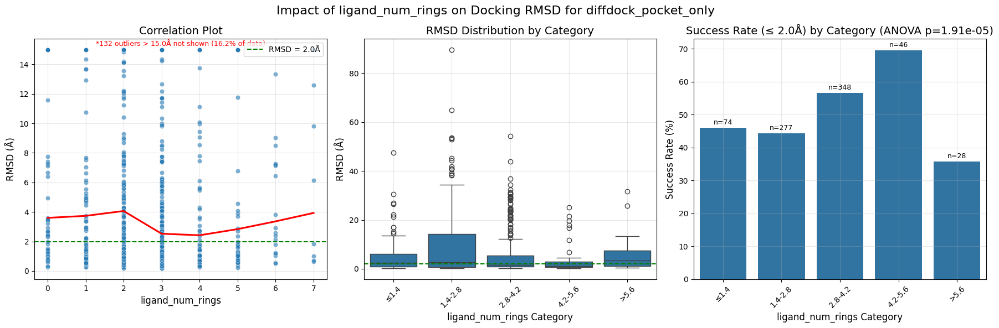


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           74     45.945946   5.925403
1                   1.4-2.8          277     44.404332   9.132113
2                   2.8-4.2          348     56.609195   5.217584
3                   4.2-5.6           46     69.565217   3.825379
4                      >5.6           28     35.714286   6.301510

ANOVA test: F=6.884, p=0.000019
Significant differences in RMSD across ligand_num_rings categories
Welch ANOVA p=0.000019 (used unbalanced‑sizes variant)
Kruskal–Wallis H=10.820, p=0.028666

Impact of ligand_num_rings on Docking RMSD for icm
Pearson correlation: -0.2479, p-value: 0.000000
Spearman correlation: -0.2583, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


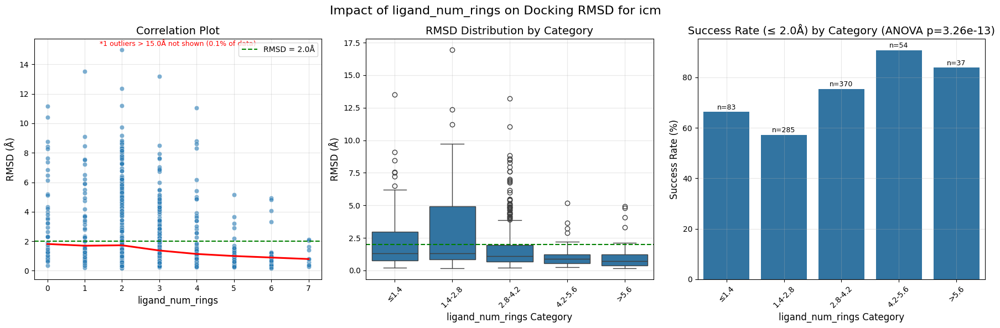


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           83     66.265060   2.312440
1                   1.4-2.8          285     57.192982   2.890313
2                   2.8-4.2          370     75.405405   1.727850
3                   4.2-5.6           54     90.740741   1.101764
4                      >5.6           37     83.783784   1.136336

ANOVA test: F=16.755, p=0.000000
Significant differences in RMSD across ligand_num_rings categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=48.214, p=0.000000

Impact of ligand_num_rings on Docking RMSD for vina
Pearson correlation: 0.0143, p-value: 0.738555
Spearman correlation: -0.0159, p-value: 0.711426


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


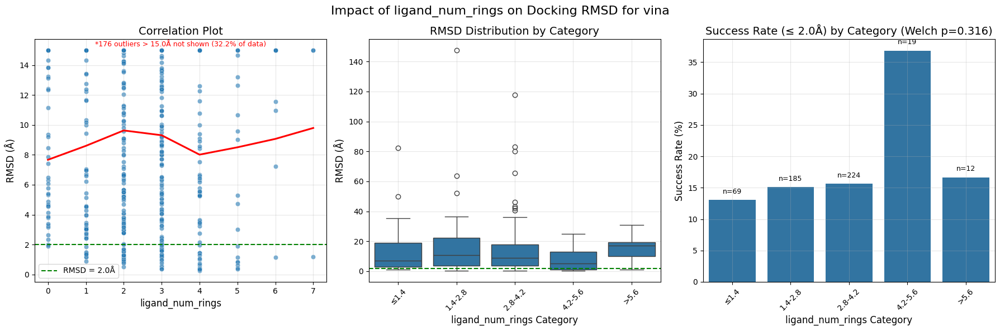


Success rates by category:
  ligand_num_rings_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           69     13.043478  12.138080
1                   1.4-2.8          185     15.135135  14.211151
2                   2.8-4.2          224     15.625000  12.666502
3                   4.2-5.6           19     36.842105   7.727076
4                      >5.6           12     16.666667  15.073086

ANOVA test: F=1.187, p=0.315515
Welch ANOVA p=0.315515 (used unbalanced‑sizes variant)
Kruskal–Wallis H=8.773, p=0.067037


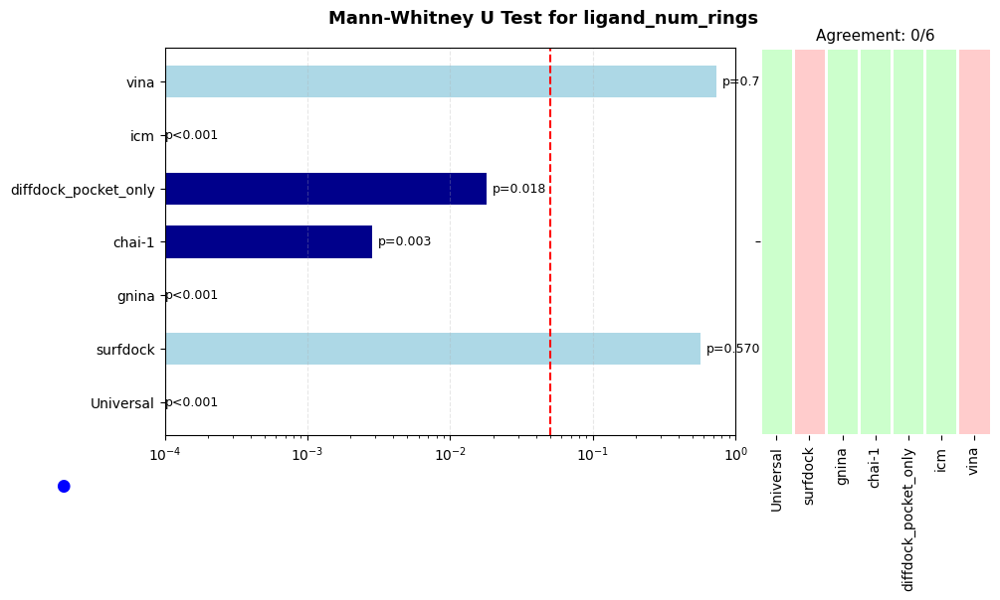

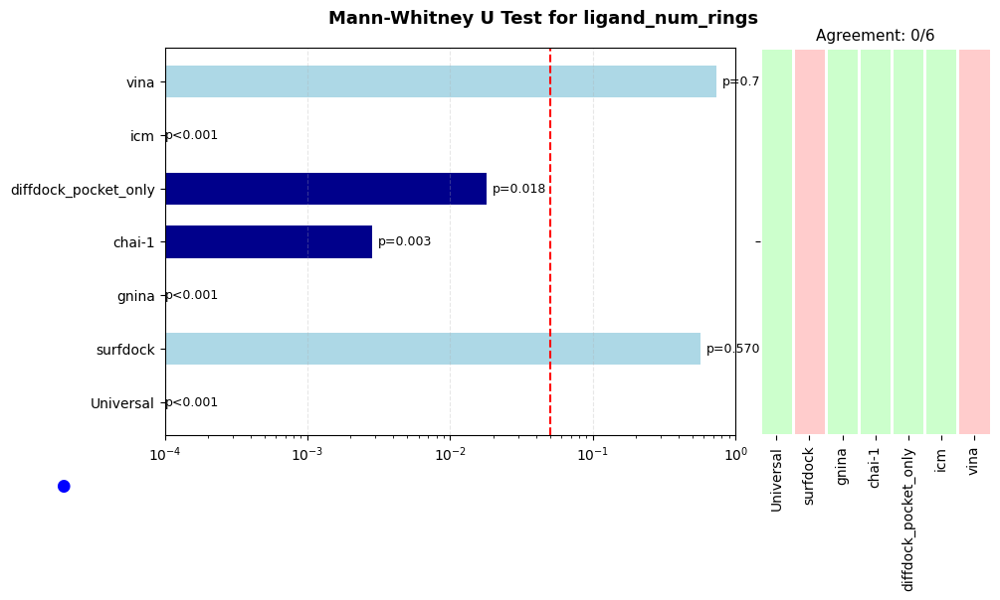

In [13]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_rings",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_rings",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_rings",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### entry_resolution

Analyzing entry_resolution for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'entry_resolution':
Success cases: n=96, mean=2.187, std=0.346
Failure cases: n=330, mean=2.247, std=0.483
Mann-Whitney U test: p=0.390874
Effect size (Cohen's d): 0.132
Chi-square test for distribution: p=0.000555

Impact of entry_resolution on Docking RMSD for surfdock
Pearson correlation: 0.0956, p-value: 0.018379
Spearman correlation: 0.1365, p-value: 0.000739


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


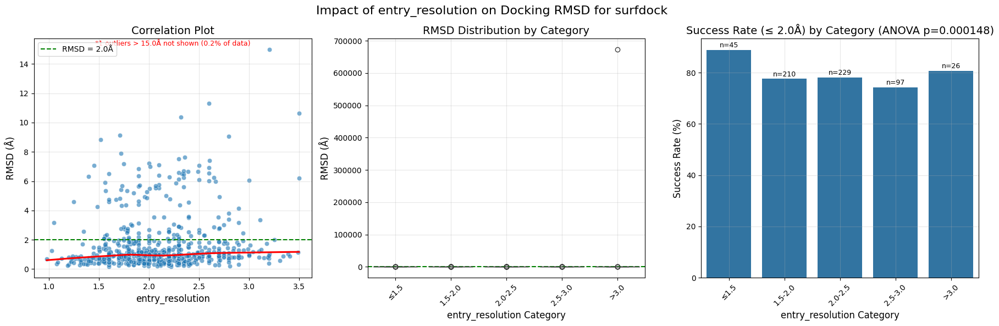


Success rates by category:
  entry_resolution_category  total_count  success_rate     mean_rmsd
0                      ≤1.5           45     88.888889      1.114781
1                   1.5-2.0          210     77.619048      1.673955
2                   2.0-2.5          229     78.165939      1.656744
3                   2.5-3.0           97     74.226804      2.010441
4                      >3.0           26     80.769231  25905.628455

ANOVA test: F=5.762, p=0.000148
Significant differences in RMSD across entry_resolution categories
Welch ANOVA p=0.000148 (used unbalanced‑sizes variant)
Kruskal–Wallis H=27.964, p=0.000013

Impact of entry_resolution on Docking RMSD for gnina
Pearson correlation: 0.1563, p-value: 0.000002
Spearman correlation: 0.2187, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


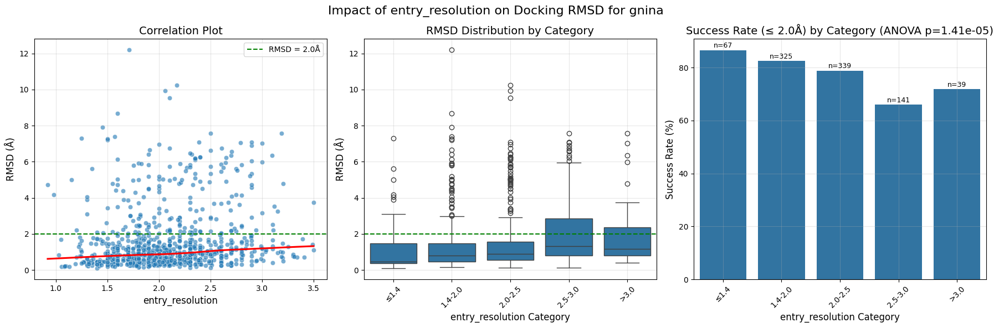


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           67     86.567164   1.143320
1                   1.4-2.0          325     82.461538   1.365985
2                   2.0-2.5          339     78.761062   1.528047
3                   2.5-3.0          141     65.957447   2.151449
4                      >3.0           39     71.794872   2.004623

ANOVA test: F=7.033, p=0.000014
Significant differences in RMSD across entry_resolution categories
Welch ANOVA p=0.000014 (used unbalanced‑sizes variant)
Kruskal–Wallis H=46.345, p=0.000000

Impact of entry_resolution on Docking RMSD for chai-1
Pearson correlation: -0.0117, p-value: 0.739584
Spearman correlation: 0.0721, p-value: 0.039793


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


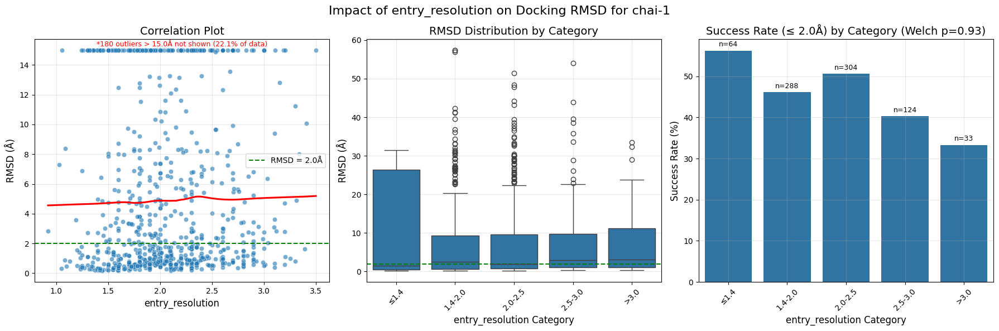


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           64     56.250000   9.265836
1                   1.4-2.0          288     46.180556   8.138931
2                   2.0-2.5          304     50.657895   7.874000
3                   2.5-3.0          124     40.322581   7.943399
4                      >3.0           33     33.333333   8.248927

ANOVA test: F=0.215, p=0.930265
Welch ANOVA p=0.930265 (used unbalanced‑sizes variant)
Kruskal–Wallis H=4.426, p=0.351471

Impact of entry_resolution on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.1025, p-value: 0.003362
Spearman correlation: 0.1769, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


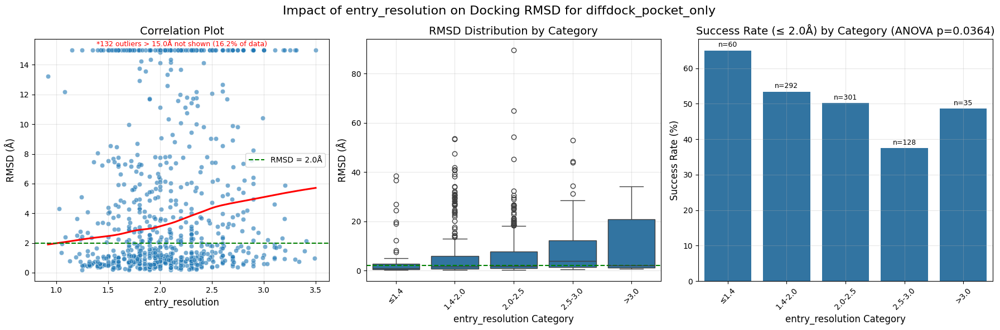


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           60     65.000000   4.322596
1                   1.4-2.0          292     53.424658   6.338703
2                   2.0-2.5          301     50.166113   6.346805
3                   2.5-3.0          128     37.500000   8.546716
4                      >3.0           35     48.571429   9.179361

ANOVA test: F=2.576, p=0.036380
Significant differences in RMSD across entry_resolution categories
Welch ANOVA p=0.036380 (used unbalanced‑sizes variant)
Kruskal–Wallis H=31.908, p=0.000002


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of entry_resolution on Docking RMSD for icm
Pearson correlation: 0.0621, p-value: 0.066286
Spearman correlation: 0.0983, p-value: 0.003619


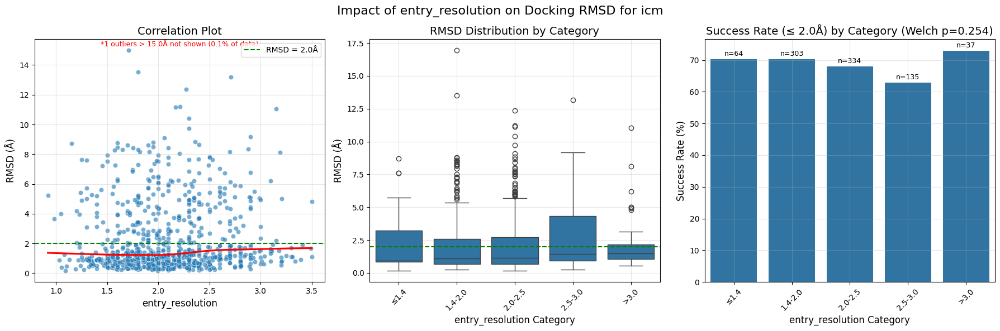


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.4           64     70.312500   2.034373
1                   1.4-2.0          303     70.297030   2.107922
2                   2.0-2.5          334     67.964072   2.103441
3                   2.5-3.0          135     62.962963   2.596789
4                      >3.0           37     72.972973   2.299056

ANOVA test: F=1.338, p=0.253895
Welch ANOVA p=0.253895 (used unbalanced‑sizes variant)
Kruskal–Wallis H=13.166, p=0.010491

Impact of entry_resolution on Docking RMSD for vina
Pearson correlation: 0.2692, p-value: 0.000000
Spearman correlation: 0.2100, p-value: 0.000001


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


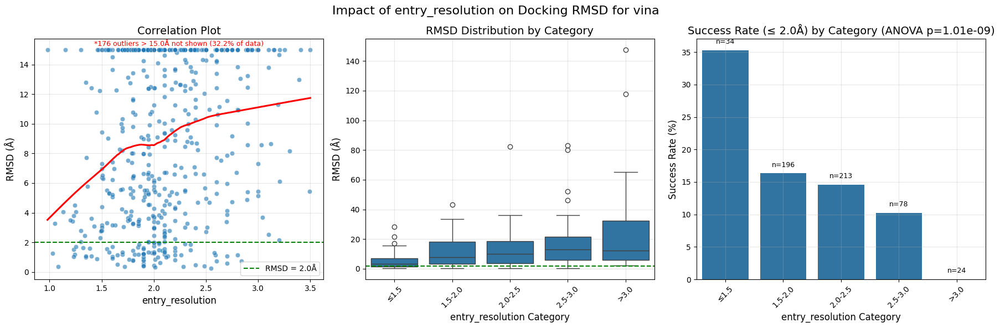


Success rates by category:
  entry_resolution_category  total_count  success_rate  mean_rmsd
0                      ≤1.5           34     35.294118   5.858957
1                   1.5-2.0          196     16.326531  10.913426
2                   2.0-2.5          213     14.553991  12.391228
3                   2.5-3.0           78     10.256410  16.272247
4                      >3.0           24      0.000000  27.492925

ANOVA test: F=12.488, p=0.000000
Significant differences in RMSD across entry_resolution categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=28.745, p=0.000009


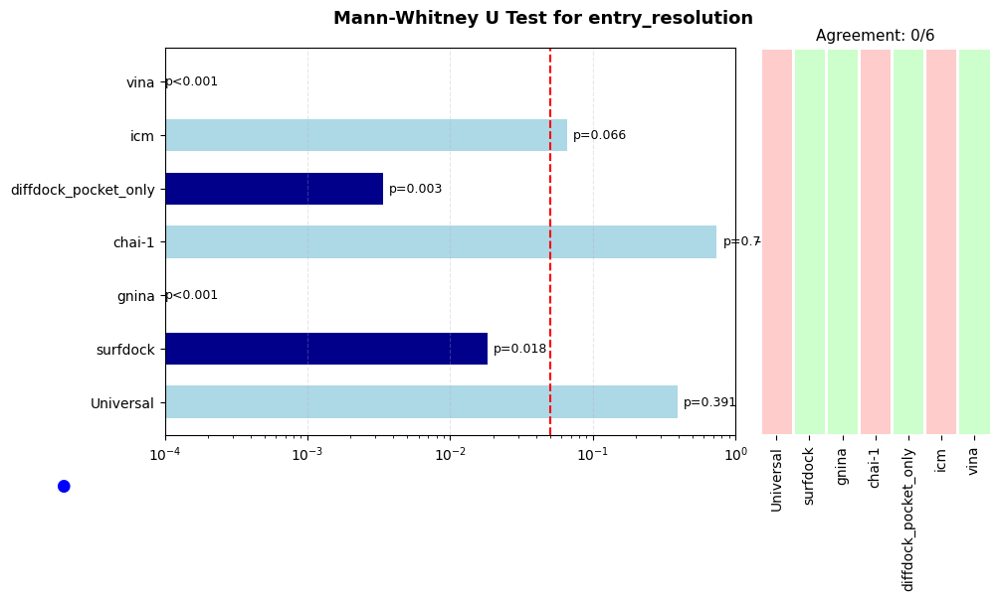

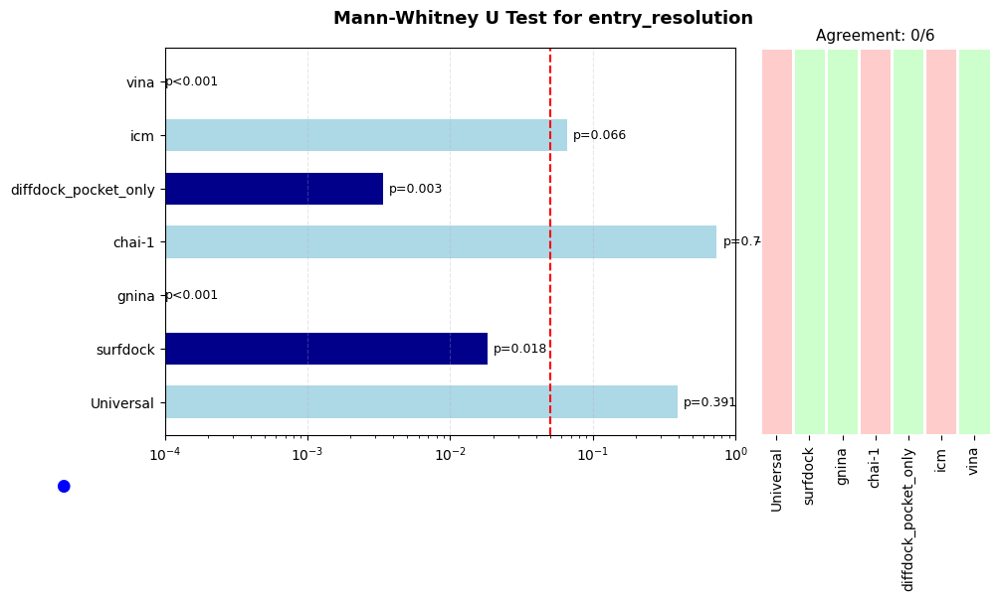

In [14]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="entry_resolution",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="entry_resolution",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="entry_resolution",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### entry_validation_molprobity

Analyzing entry_validation_molprobity for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'entry_validation_molprobity':
Success cases: n=96, mean=1.406, std=0.446
Failure cases: n=330, mean=1.473, std=0.442
Mann-Whitney U test: p=0.086113
Effect size (Cohen's d): 0.150
Chi-square test for distribution: p=0.039306

Impact of entry_validation_molprobity on Docking RMSD for surfdock
Pearson correlation: 0.0436, p-value: 0.283057
Spearman correlation: 0.0193, p-value: 0.634895


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


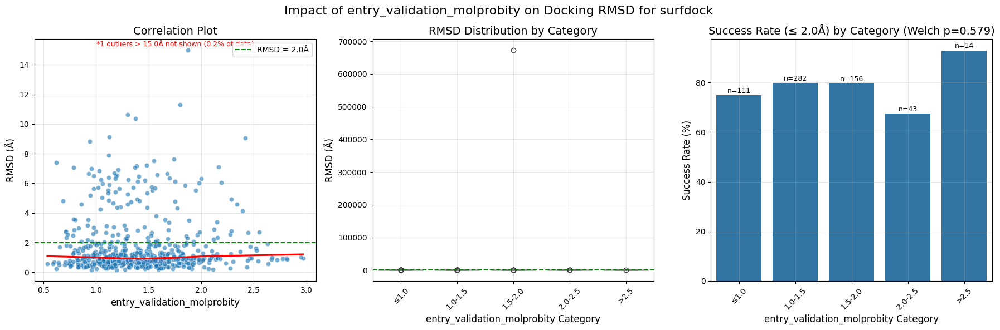


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate    mean_rmsd
0                                 ≤1.0          111     74.774775     1.747910
1                              1.0-1.5          282     79.787234     1.688887
2                              1.5-2.0          156     79.487179  4318.892017
3                              2.0-2.5           43     67.441860     2.033981
4                                 >2.5           14     92.857143     1.183542

ANOVA test: F=0.720, p=0.578613
Welch ANOVA p=0.578613 (used unbalanced‑sizes variant)
Kruskal–Wallis H=4.524, p=0.339717


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of entry_validation_molprobity on Docking RMSD for gnina
Pearson correlation: 0.0508, p-value: 0.125392
Spearman correlation: 0.0754, p-value: 0.022955


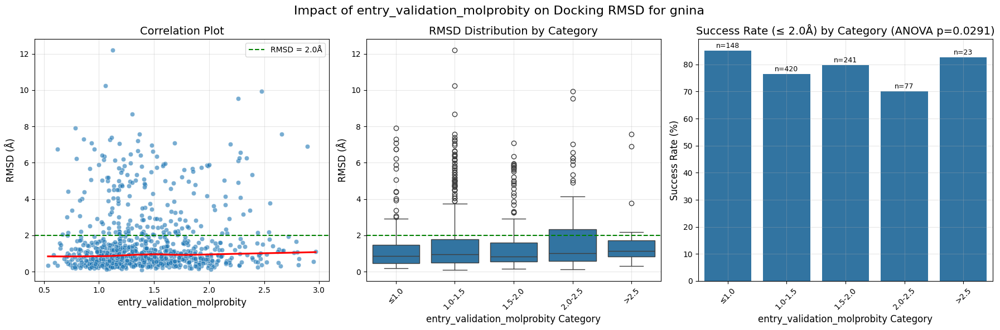


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.0          148     85.135135   1.365477
1                              1.0-1.5          420     76.428571   1.627975
2                              1.5-2.0          241     79.668050   1.392722
3                              2.0-2.5           77     70.129870   2.024020
4                                 >2.5           23     82.608696   1.762186

ANOVA test: F=2.709, p=0.029124
Significant differences in RMSD across entry_validation_molprobity categories
Welch ANOVA p=0.029124 (used unbalanced‑sizes variant)
Kruskal–Wallis H=8.241, p=0.083136

Impact of entry_validation_molprobity on Docking RMSD for chai-1
Pearson correlation: 0.0169, p-value: 0.630501
Spearman correlation: 0.0449, p-value: 0.200317


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


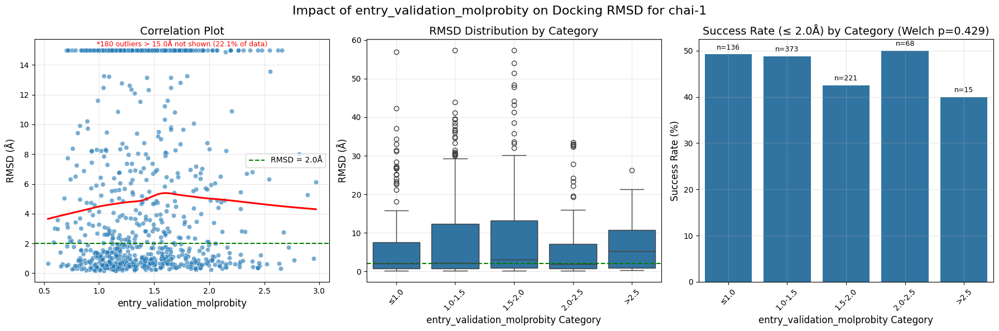


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.0          136     49.264706   7.025724
1                              1.0-1.5          373     48.793566   8.114376
2                              1.5-2.0          221     42.533937   9.130933
3                              2.0-2.5           68     50.000000   7.053807
4                                 >2.5           15     40.000000   7.355757

ANOVA test: F=0.959, p=0.429247
Welch ANOVA p=0.429247 (used unbalanced‑sizes variant)
Kruskal–Wallis H=5.504, p=0.239419

Impact of entry_validation_molprobity on Docking RMSD for diffdock_pocket_only
Pearson correlation: 0.0244, p-value: 0.487059
Spearman correlation: 0.0447, p-value: 0.201618


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


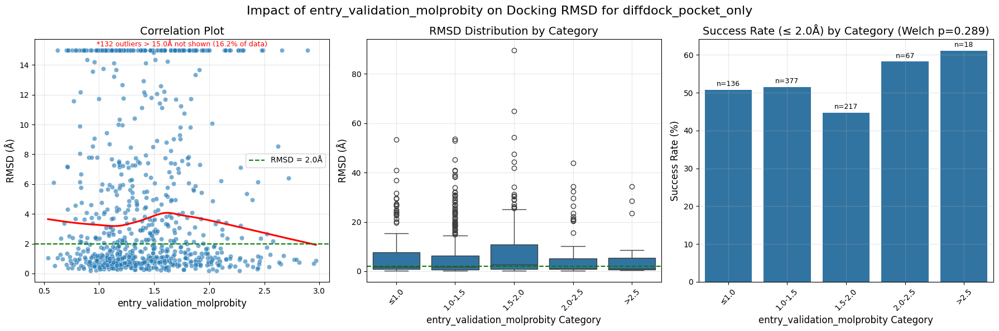


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.0          136     50.735294   6.675225
1                              1.0-1.5          377     51.458886   6.042266
2                              1.5-2.0          217     44.700461   7.949922
3                              2.0-2.5           67     58.208955   6.193770
4                                 >2.5           18     61.111111   6.455444

ANOVA test: F=1.248, p=0.289144
Welch ANOVA p=0.289144 (used unbalanced‑sizes variant)
Kruskal–Wallis H=7.646, p=0.105459


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of entry_validation_molprobity on Docking RMSD for icm
Pearson correlation: 0.0299, p-value: 0.377194
Spearman correlation: 0.0284, p-value: 0.402488


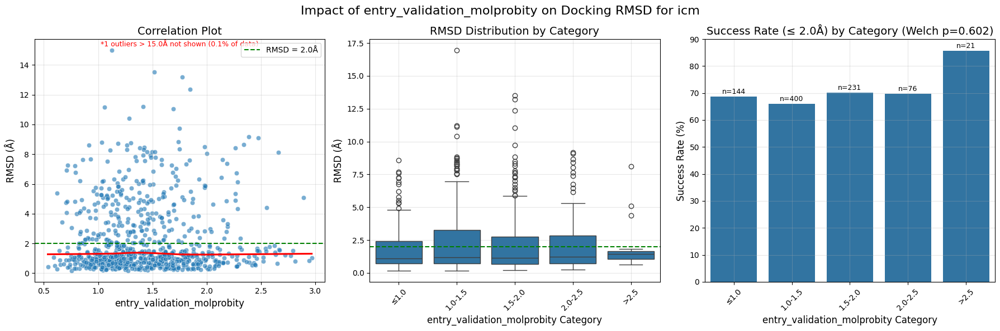


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.0          144     68.750000   1.936268
1                              1.0-1.5          400     66.000000   2.278122
2                              1.5-2.0          231     70.129870   2.169041
3                              2.0-2.5           76     69.736842   2.309460
4                                 >2.5           21     85.714286   1.941880

ANOVA test: F=0.686, p=0.601805
Welch ANOVA p=0.601805 (used unbalanced‑sizes variant)
Kruskal–Wallis H=2.669, p=0.614661

Impact of entry_validation_molprobity on Docking RMSD for vina
Pearson correlation: 0.0483, p-value: 0.260196
Spearman correlation: 0.0675, p-value: 0.115641


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


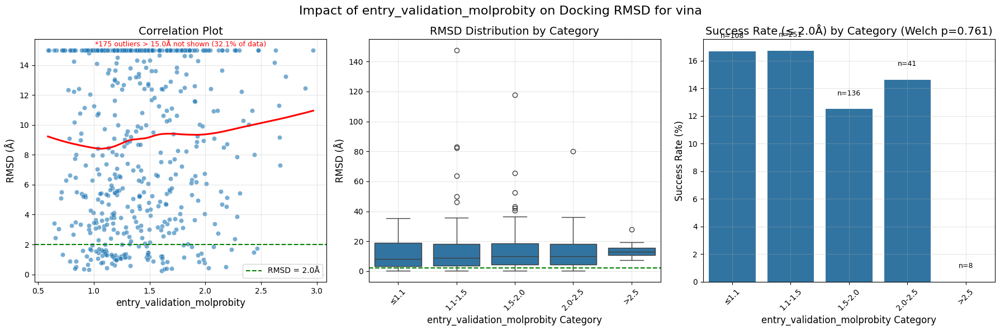


Success rates by category:
  entry_validation_molprobity_category  total_count  success_rate  mean_rmsd
0                                 ≤1.1          108     16.666667  11.210530
1                              1.1-1.5          251     16.733068  12.829340
2                              1.5-2.0          136     12.500000  13.412916
3                              2.0-2.5           41     14.634146  13.290534
4                                 >2.5            8      0.000000  14.344388

ANOVA test: F=0.465, p=0.761474
Welch ANOVA p=0.761474 (used unbalanced‑sizes variant)
Kruskal–Wallis H=2.813, p=0.589580


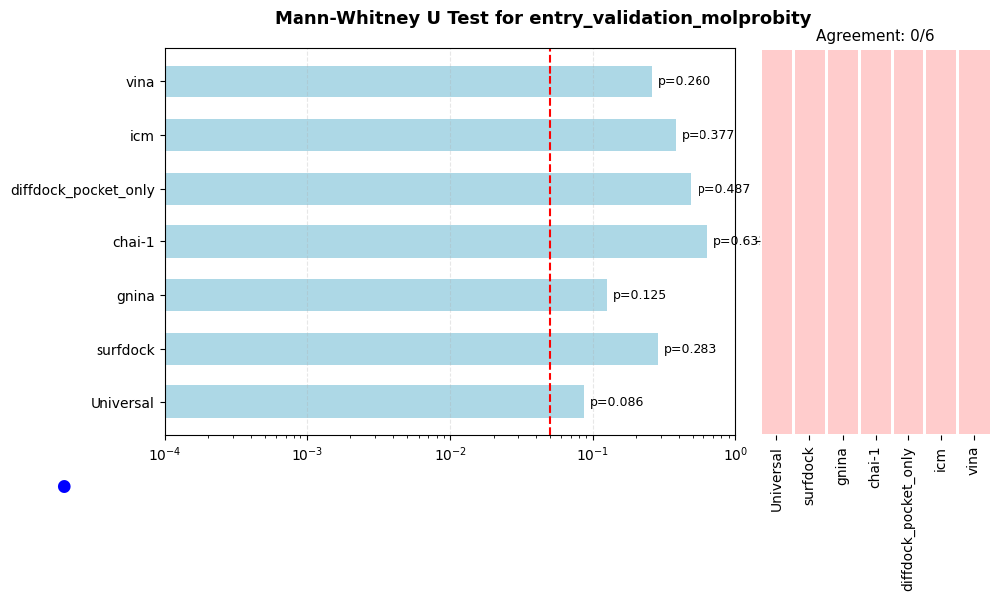

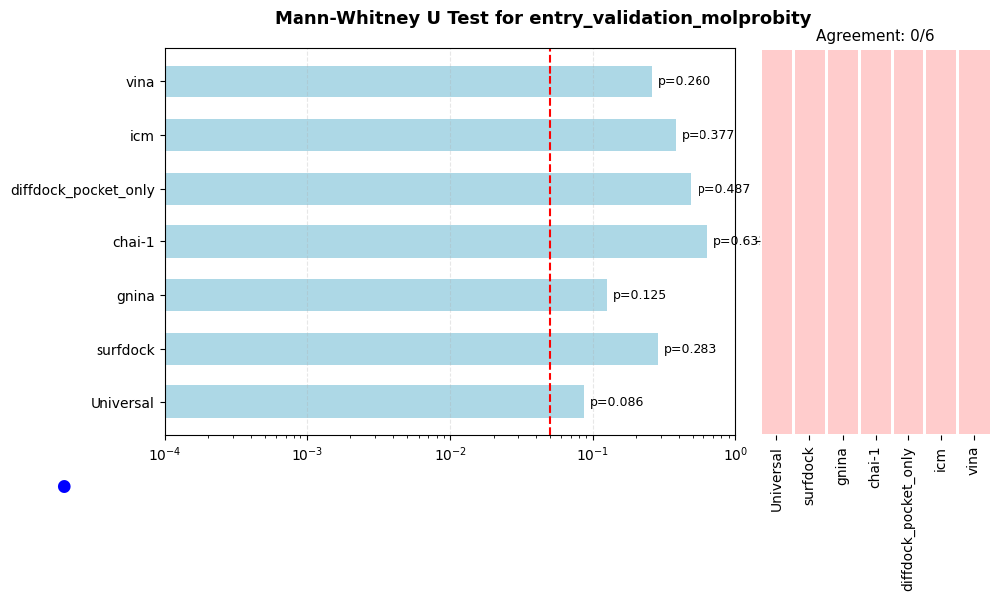

In [15]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="entry_validation_molprobity",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="entry_validation_molprobity",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="entry_validation_molprobity",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### system_num_pocket_residues

Analyzing system_num_pocket_residues for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'system_num_pocket_residues':
Success cases: n=96, mean=28.429, std=7.937
Failure cases: n=330, mean=18.683, std=16.113
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 0.664
Chi-square test for distribution: p=0.000000

Impact of system_num_pocket_residues on Docking RMSD for surfdock
Pearson correlation: -0.0560, p-value: 0.167879
Spearman correlation: -0.0767, p-value: 0.058804


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


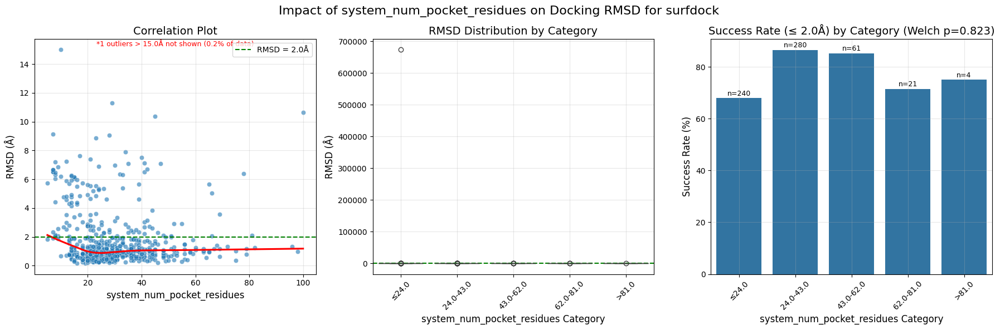


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate    mean_rmsd
0                               ≤24.0          240     67.916667  2808.311996
1                           24.0-43.0          280     86.428571     1.363602
2                           43.0-62.0           61     85.245902     1.398280
3                           62.0-81.0           21     71.428571     1.875773
4                               >81.0            4     75.000000     3.543788

ANOVA test: F=0.380, p=0.823082
Welch ANOVA p=0.823082 (used unbalanced‑sizes variant)
Kruskal–Wallis H=10.392, p=0.034319


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of system_num_pocket_residues on Docking RMSD for gnina
Pearson correlation: -0.2907, p-value: 0.000000
Spearman correlation: -0.3076, p-value: 0.000000


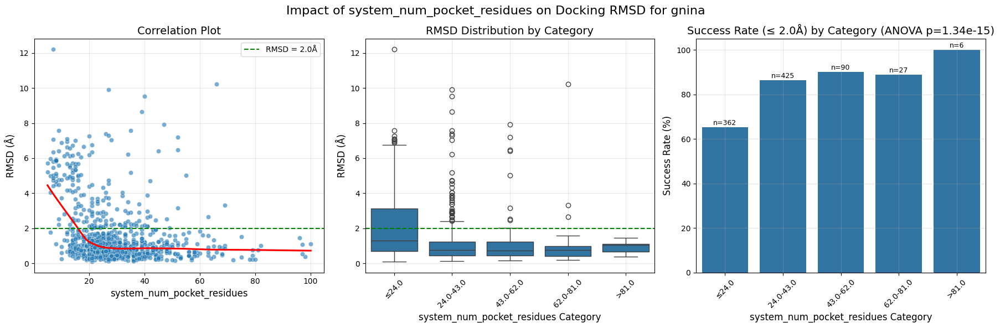


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤24.0          362     65.193370   2.150820
1                           24.0-43.0          425     86.352941   1.149940
2                           43.0-62.0           90     90.000000   1.200963
3                           62.0-81.0           27     88.888889   1.217945
4                               >81.0            6    100.000000   0.930906

ANOVA test: F=19.749, p=0.000000
Significant differences in RMSD across system_num_pocket_residues categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=69.214, p=0.000000

Impact of system_num_pocket_residues on Docking RMSD for chai-1
Pearson correlation: -0.2287, p-value: 0.000000
Spearman correlation: -0.2574, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


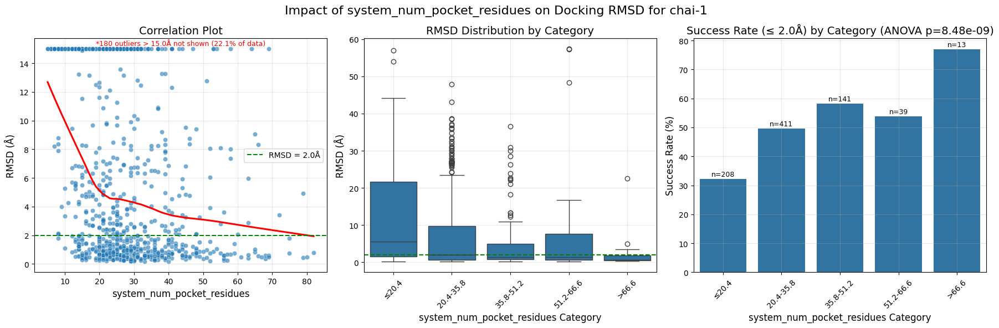


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤20.4          208     32.211538  11.808176
1                           20.4-35.8          411     49.635036   7.544491
2                           35.8-51.2          141     58.156028   4.533984
3                           51.2-66.6           39     53.846154   7.331873
4                               >66.6           13     76.923077   2.888223

ANOVA test: F=11.137, p=0.000000
Significant differences in RMSD across system_num_pocket_residues categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=51.777, p=0.000000

Impact of system_num_pocket_residues on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.2727, p-value: 0.000000
Spearman correlation: -0.2852, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


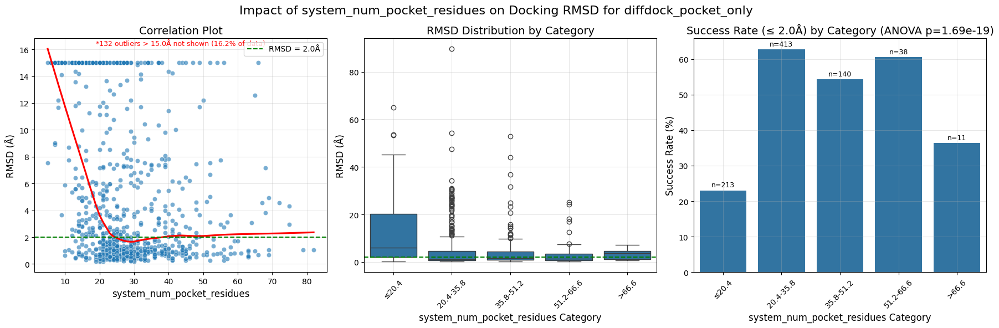


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤20.4          213     23.004695  12.305797
1                           20.4-35.8          413     62.711864   4.747440
2                           35.8-51.2          140     54.285714   4.530217
3                           51.2-66.6           38     60.526316   4.295572
4                               >66.6           11     36.363636   3.280800

ANOVA test: F=24.941, p=0.000000
Significant differences in RMSD across system_num_pocket_residues categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=89.362, p=0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of system_num_pocket_residues on Docking RMSD for icm
Pearson correlation: -0.1907, p-value: 0.000000
Spearman correlation: -0.1748, p-value: 0.000000


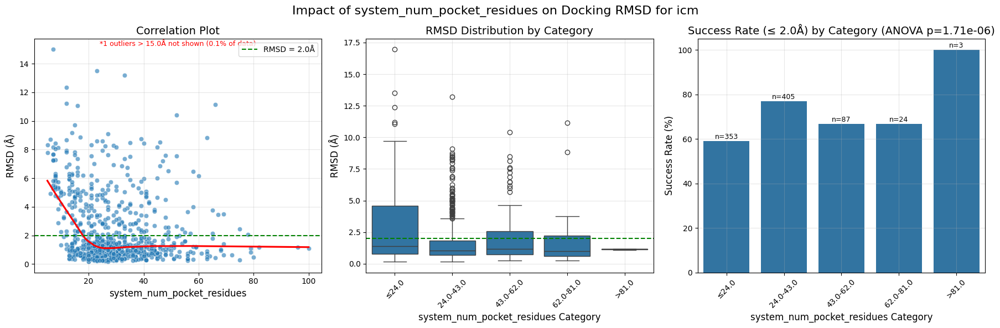


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤24.0          353     58.923513   2.679622
1                           24.0-43.0          405     77.037037   1.741523
2                           43.0-62.0           87     66.666667   2.201860
3                           62.0-81.0           24     66.666667   2.081743
4                               >81.0            3    100.000000   1.149723

ANOVA test: F=8.202, p=0.000002
Significant differences in RMSD across system_num_pocket_residues categories
Welch ANOVA p=0.000002 (used unbalanced‑sizes variant)
Kruskal–Wallis H=19.222, p=0.000711

Impact of system_num_pocket_residues on Docking RMSD for vina
Pearson correlation: -0.0688, p-value: 0.108219
Spearman correlation: -0.0899, p-value: 0.035711


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


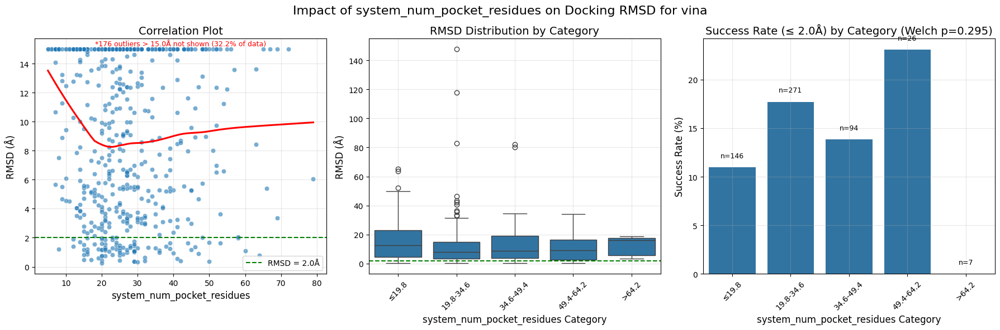


Success rates by category:
  system_num_pocket_residues_category  total_count  success_rate  mean_rmsd
0                               ≤19.8          146     10.958904  14.621357
1                           19.8-34.6          271     17.712177  11.614714
2                           34.6-49.4           94     13.829787  12.994179
3                           49.4-64.2           26     23.076923  11.376819
4                               >64.2            7      0.000000  12.200746

ANOVA test: F=1.235, p=0.295073
Welch ANOVA p=0.295073 (used unbalanced‑sizes variant)
Kruskal–Wallis H=10.158, p=0.037850


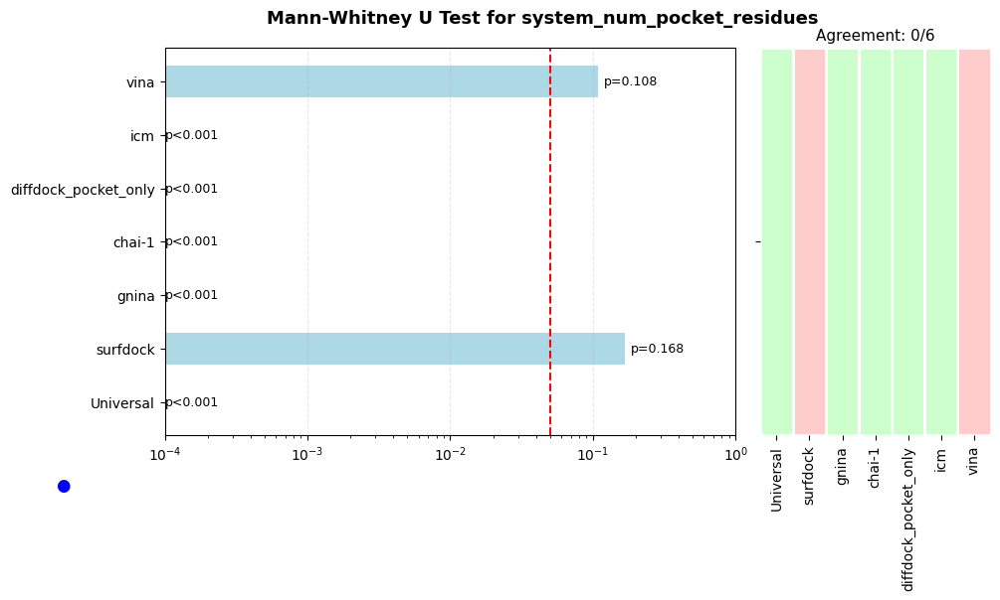

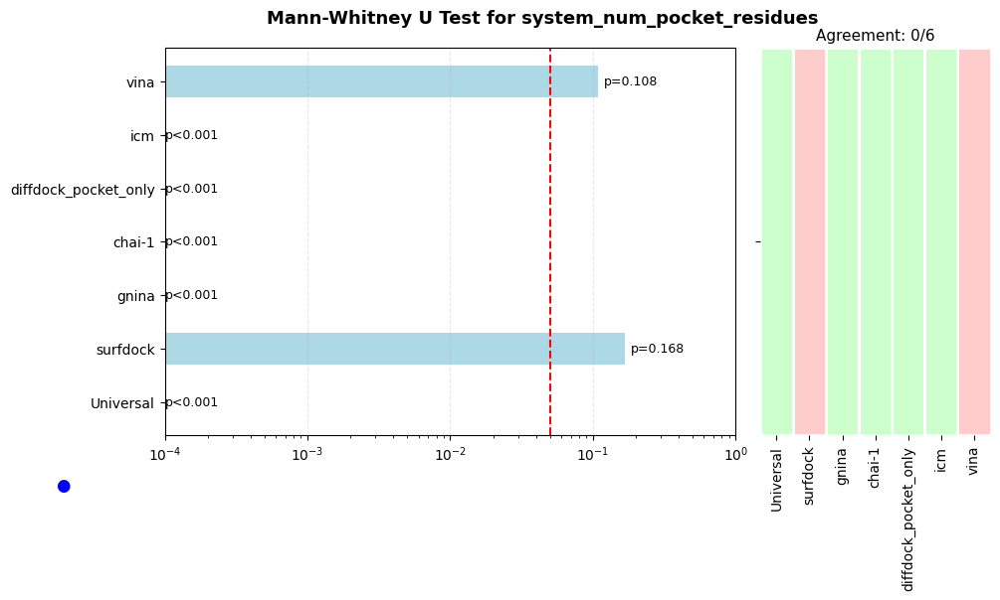

In [16]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="system_num_pocket_residues",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="system_num_pocket_residues",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="system_num_pocket_residues",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### system_num_interactions

Analyzing system_num_interactions for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'system_num_interactions':
Success cases: n=96, mean=12.429, std=4.652
Failure cases: n=330, mean=8.902, std=8.286
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 0.463
Chi-square test for distribution: p=0.000000

Impact of system_num_interactions on Docking RMSD for surfdock
Pearson correlation: -0.0525, p-value: 0.196155
Spearman correlation: -0.0704, p-value: 0.082875


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


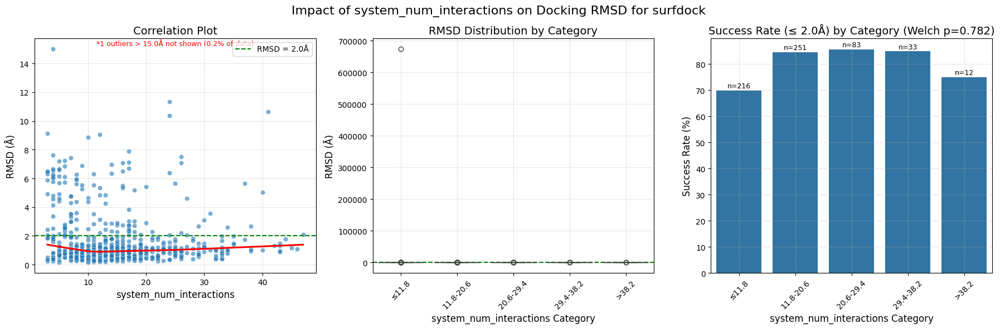


Success rates by category:
  system_num_interactions_category  total_count  success_rate    mean_rmsd
0                            ≤11.8          216     69.907407  3120.029159
1                        11.8-20.6          251     84.462151     1.353697
2                        20.6-29.4           83     85.542169     1.593876
3                        29.4-38.2           33     84.848485     1.439911
4                            >38.2           12     75.000000     2.395907

ANOVA test: F=0.437, p=0.781806
Welch ANOVA p=0.781806 (used unbalanced‑sizes variant)
Kruskal–Wallis H=12.863, p=0.011966

Impact of system_num_interactions on Docking RMSD for gnina
Pearson correlation: -0.3104, p-value: 0.000000
Spearman correlation: -0.3762, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


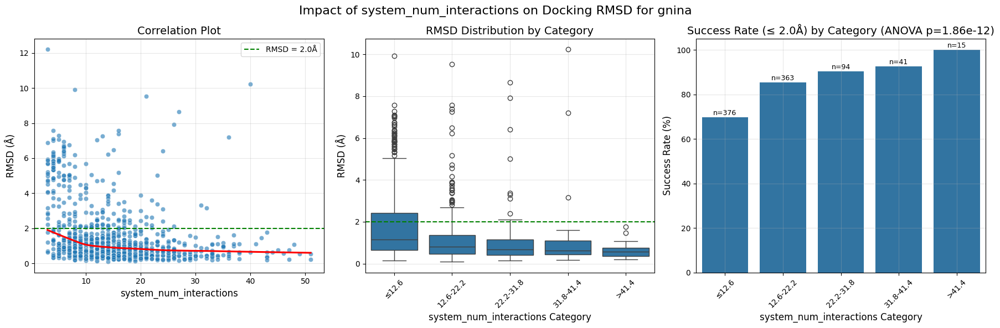


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                            ≤12.6          376     69.680851   1.982571
1                        12.6-22.2          363     85.399449   1.160985
2                        22.2-31.8           94     90.425532   1.094820
3                        31.8-41.4           41     92.682927   1.153299
4                            >41.4           15    100.000000   0.675934

ANOVA test: F=15.749, p=0.000000
Significant differences in RMSD across system_num_interactions categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=65.856, p=0.000000

Impact of system_num_interactions on Docking RMSD for chai-1
Pearson correlation: -0.1542, p-value: 0.000010
Spearman correlation: -0.2429, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


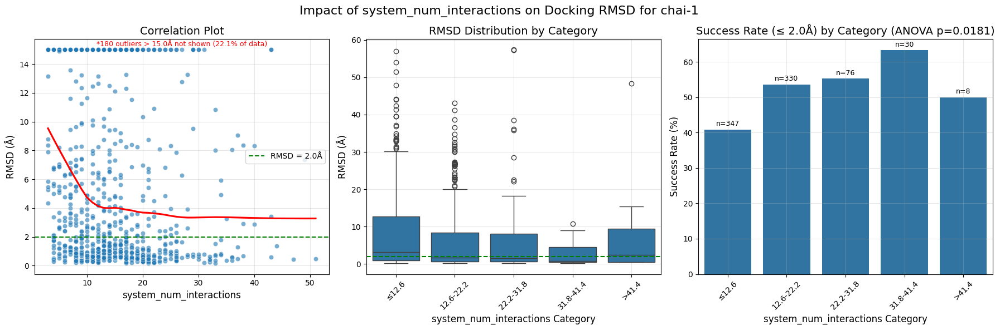


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                            ≤12.6          347     40.922190   8.971734
1                        12.6-22.2          330     53.636364   7.065398
2                        22.2-31.8           76     55.263158   7.308249
3                        31.8-41.4           30     63.333333   2.846129
4                            >41.4            8     50.000000   9.685222

ANOVA test: F=2.994, p=0.018101
Significant differences in RMSD across system_num_interactions categories
Welch ANOVA p=0.018101 (used unbalanced‑sizes variant)
Kruskal–Wallis H=17.388, p=0.001625

Impact of system_num_interactions on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.2713, p-value: 0.000000
Spearman correlation: -0.3346, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


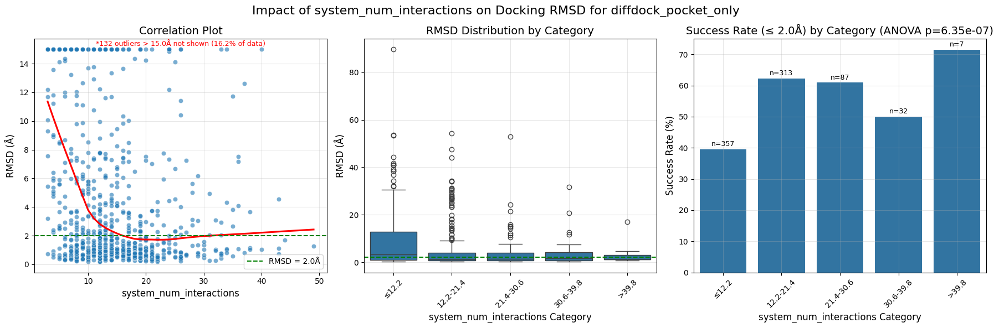


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                            ≤12.2          357     39.495798   8.552189
1                        12.2-21.4          313     62.300319   4.716273
2                        21.4-30.6           87     60.919540   3.905445
3                        30.6-39.8           32     50.000000   4.299015
4                            >39.8            7     71.428571   3.908110

ANOVA test: F=8.762, p=0.000001
Significant differences in RMSD across system_num_interactions categories
Welch ANOVA p=0.000001 (used unbalanced‑sizes variant)
Kruskal–Wallis H=42.294, p=0.000000

Impact of system_num_interactions on Docking RMSD for icm
Pearson correlation: -0.1906, p-value: 0.000000
Spearman correlation: -0.1946, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


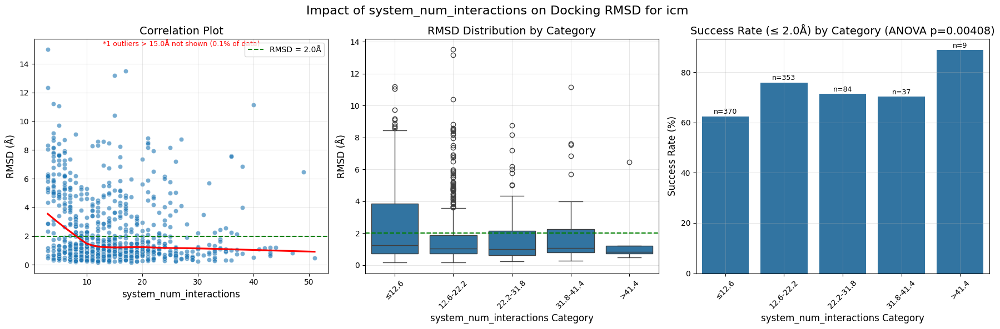


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                            ≤12.6          370     62.432432   2.438756
1                        12.6-22.2          353     75.920680   1.850752
2                        22.2-31.8           84     71.428571   1.805210
3                        31.8-41.4           37     70.270270   2.100250
4                            >41.4            9     88.888889   1.506632

ANOVA test: F=3.860, p=0.004080
Significant differences in RMSD across system_num_interactions categories
Welch ANOVA p=0.004080 (used unbalanced‑sizes variant)
Kruskal–Wallis H=9.771, p=0.044473

Impact of system_num_interactions on Docking RMSD for vina
Pearson correlation: -0.0757, p-value: 0.077180
Spearman correlation: -0.0940, p-value: 0.028014


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


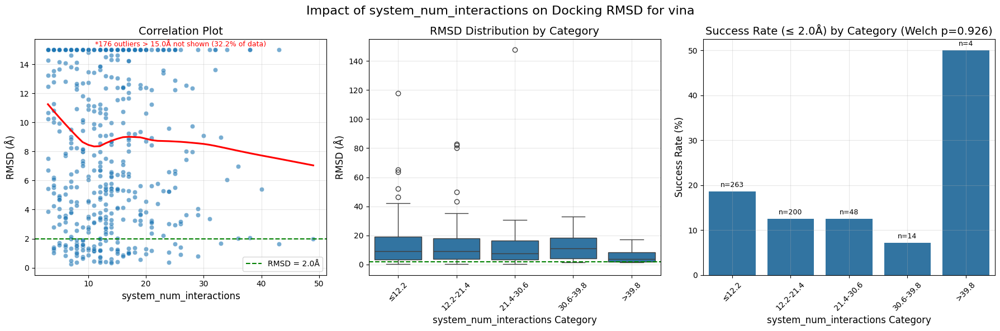


Success rates by category:
  system_num_interactions_category  total_count  success_rate  mean_rmsd
0                            ≤12.2          263     18.631179  12.646982
1                        12.2-21.4          200     12.500000  12.506843
2                        21.4-30.6           48     12.500000  13.230618
3                        30.6-39.8           14      7.142857  12.371968
4                            >39.8            4     50.000000   6.541875

ANOVA test: F=0.223, p=0.925777
Welch ANOVA p=0.925777 (used unbalanced‑sizes variant)
Kruskal–Wallis H=1.600, p=0.808878


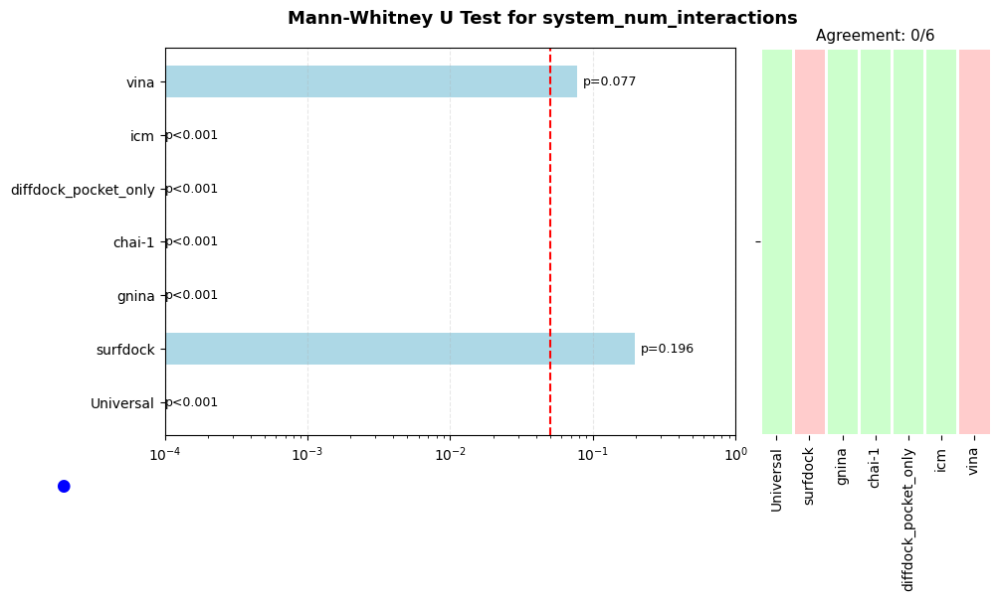

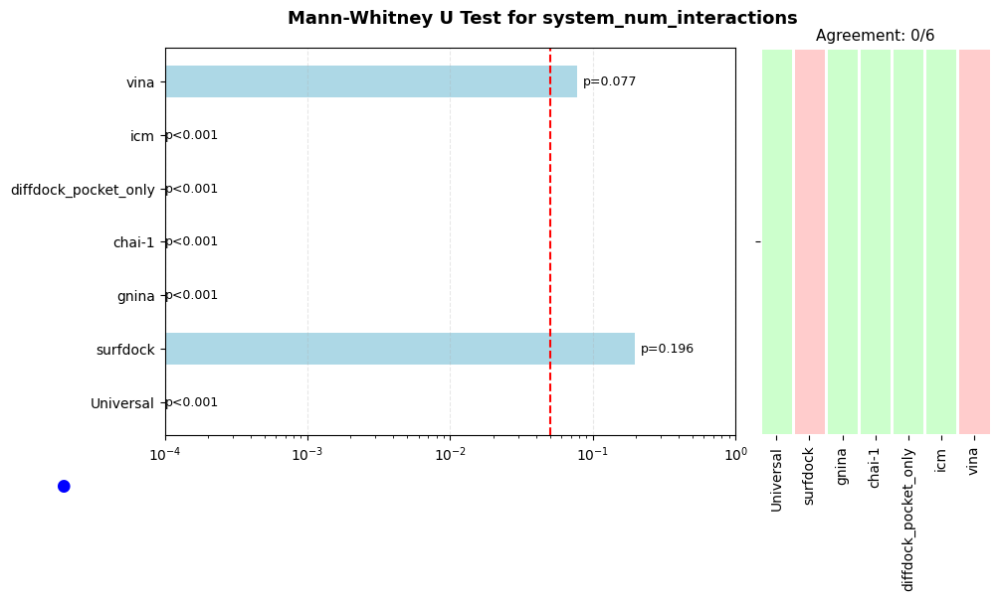

In [17]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="system_num_interactions",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="system_num_interactions",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="system_num_interactions",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_molecular_weight

Analyzing ligand_molecular_weight for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_molecular_weight':
Success cases: n=96, mean=390.268, std=114.892
Failure cases: n=330, mean=442.862, std=104.339
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 0.492
Chi-square test for distribution: p=0.000000

Impact of ligand_molecular_weight on Docking RMSD for surfdock
Pearson correlation: -0.0024, p-value: 0.953533
Spearman correlation: 0.4057, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


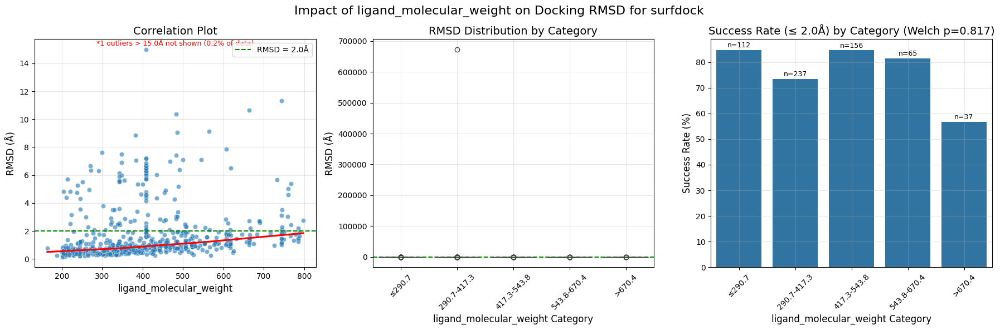


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate    mean_rmsd
0                           ≤290.7          112     84.821429     1.201146
1                      290.7-417.3          237     73.417722  2843.591703
2                      417.3-543.8          156     84.615385     1.550832
3                      543.8-670.4           65     81.538462     1.873401
4                           >670.4           37     56.756757     2.510394

ANOVA test: F=0.389, p=0.816729
Welch ANOVA p=0.816729 (used unbalanced‑sizes variant)
Kruskal–Wallis H=79.083, p=0.000000

Impact of ligand_molecular_weight on Docking RMSD for gnina
Pearson correlation: 0.1035, p-value: 0.001742
Spearman correlation: 0.1558, p-value: 0.000002


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


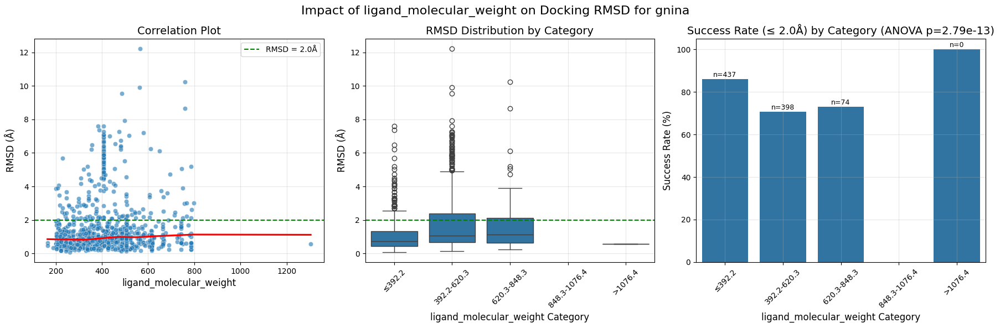


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤392.2          437     86.041190   1.112478
1                      392.2-620.3          398     70.603015   2.023224
2                      620.3-848.3           74     72.972973   1.780629
3                     848.3-1076.4            0           NaN        NaN
4                          >1076.4            1    100.000000   0.551618

ANOVA test: F=21.204, p=0.000000
Significant differences in RMSD across ligand_molecular_weight categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=52.045, p=0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of ligand_molecular_weight on Docking RMSD for chai-1
Pearson correlation: -0.0258, p-value: 0.462429
Spearman correlation: 0.0271, p-value: 0.440357


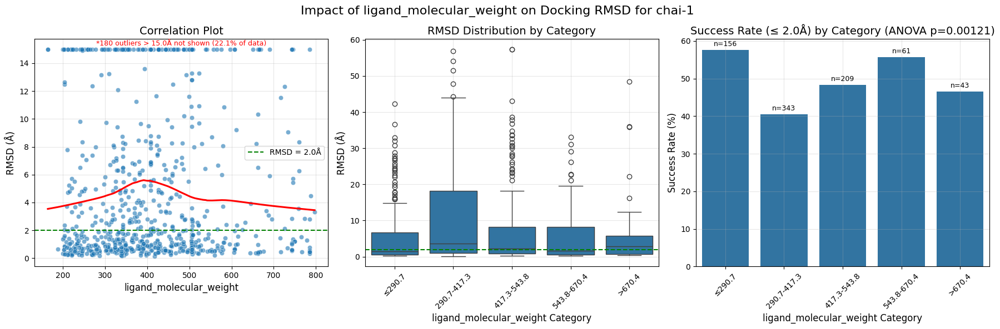


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤290.7          156     57.692308   6.188039
1                      290.7-417.3          343     40.524781   9.910791
2                      417.3-543.8          209     48.325359   7.250641
3                      543.8-670.4           61     55.737705   6.214696
4                           >670.4           43     46.511628   6.309929

ANOVA test: F=4.555, p=0.001212
Significant differences in RMSD across ligand_molecular_weight categories
Welch ANOVA p=0.001212 (used unbalanced‑sizes variant)
Kruskal–Wallis H=21.205, p=0.000288

Impact of ligand_molecular_weight on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.0026, p-value: 0.940711
Spearman correlation: 0.0685, p-value: 0.050185


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


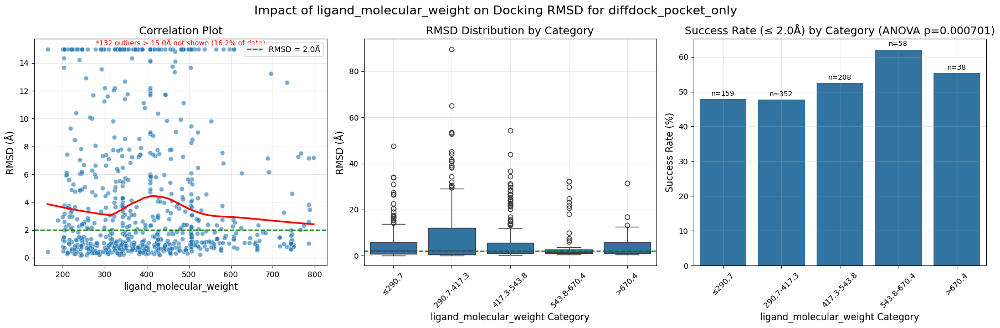


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤290.7          159     47.798742   5.172267
1                      290.7-417.3          352     47.727273   8.423738
2                      417.3-543.8          208     52.403846   5.686502
3                      543.8-670.4           58     62.068966   5.128825
4                           >670.4           38     55.263158   4.312859

ANOVA test: F=4.865, p=0.000701
Significant differences in RMSD across ligand_molecular_weight categories
Welch ANOVA p=0.000701 (used unbalanced‑sizes variant)
Kruskal–Wallis H=1.721, p=0.786819

Impact of ligand_molecular_weight on Docking RMSD for icm
Pearson correlation: 0.0801, p-value: 0.017879
Spearman correlation: 0.1440, p-value: 0.000019


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


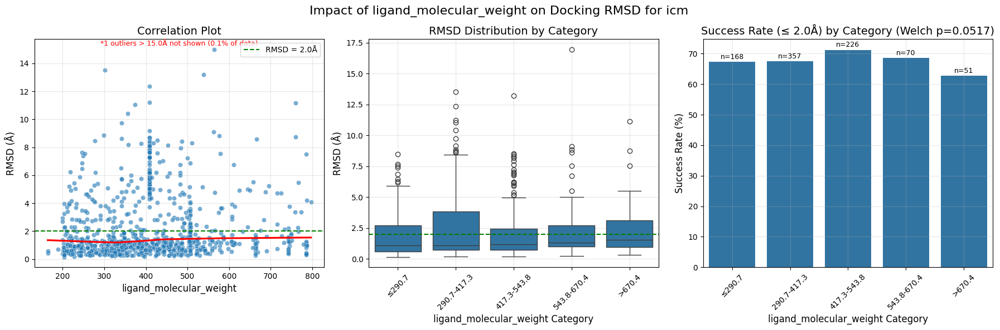


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤290.7          168     67.261905   1.875321
1                      290.7-417.3          357     67.507003   2.424146
2                      417.3-543.8          226     71.238938   1.970208
3                      543.8-670.4           70     68.571429   2.388968
4                           >670.4           51     62.745098   2.320576

ANOVA test: F=2.362, p=0.051712
Welch ANOVA p=0.051712 (used unbalanced‑sizes variant)
Kruskal–Wallis H=7.366, p=0.117744

Impact of ligand_molecular_weight on Docking RMSD for vina
Pearson correlation: 0.1222, p-value: 0.004230
Spearman correlation: 0.1163, p-value: 0.006514


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


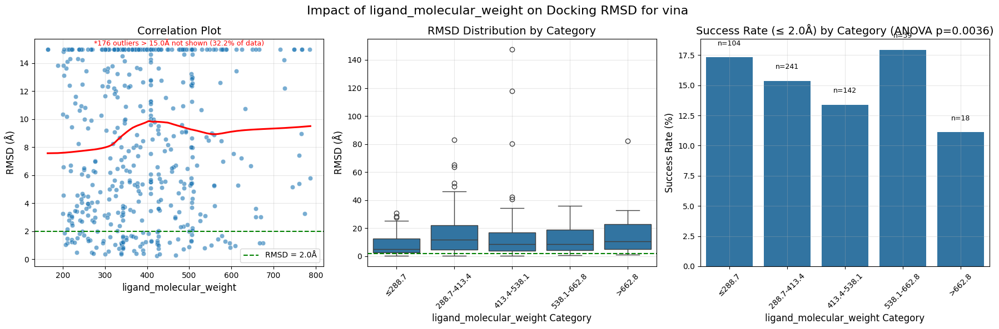


Success rates by category:
  ligand_molecular_weight_category  total_count  success_rate  mean_rmsd
0                           ≤288.7          104     17.307692   8.263789
1                      288.7-413.4          241     15.352697  14.229065
2                      413.4-538.1          142     13.380282  13.034722
3                      538.1-662.8           39     17.948718  12.351595
4                           >662.8           18     11.111111  16.499867

ANOVA test: F=3.950, p=0.003600
Significant differences in RMSD across ligand_molecular_weight categories
Welch ANOVA p=0.003600 (used unbalanced‑sizes variant)
Kruskal–Wallis H=19.130, p=0.000741


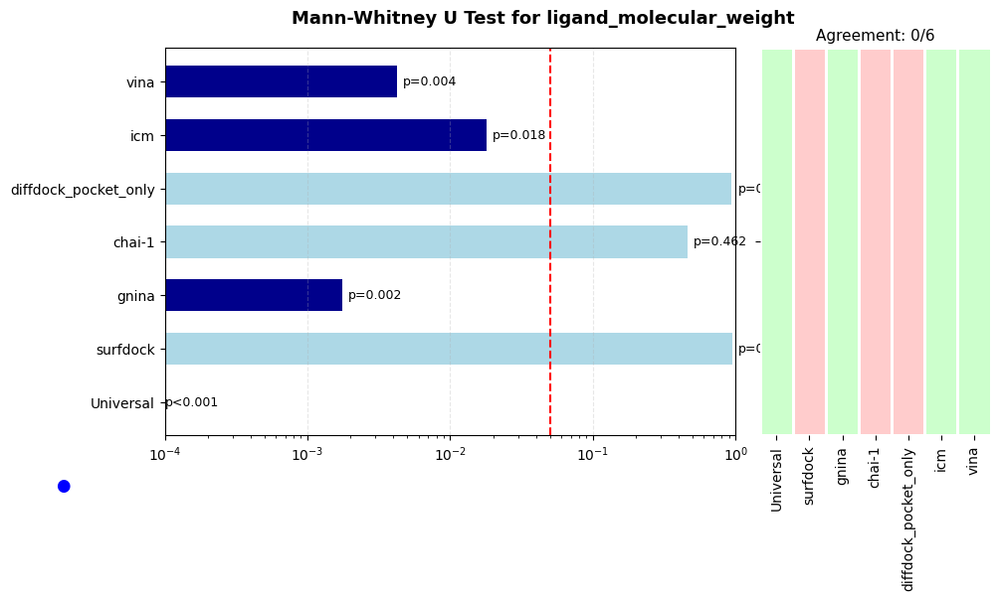

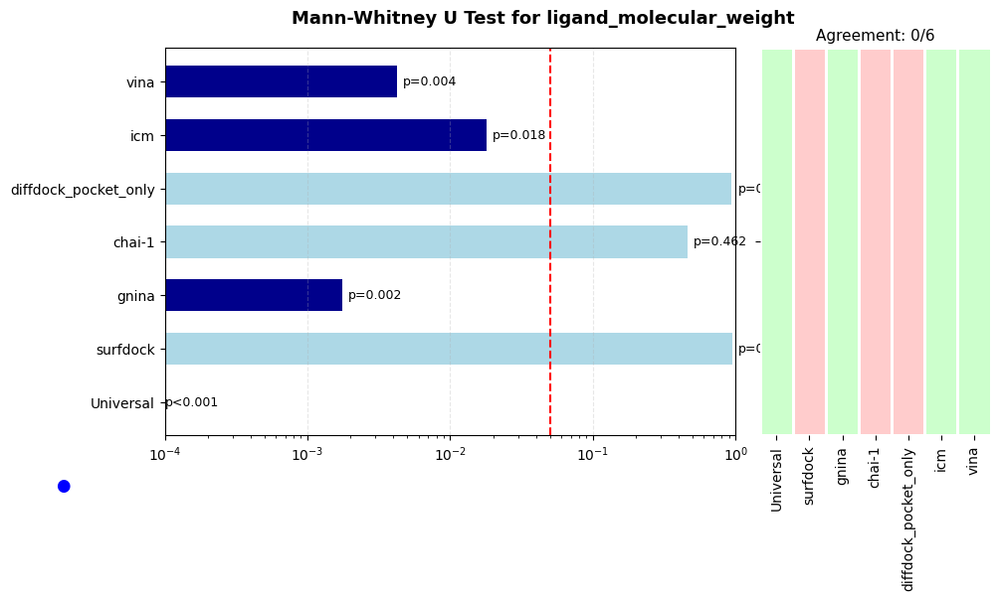

In [18]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_molecular_weight",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_molecular_weight",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_molecular_weight",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_crippen_clogp

Analyzing ligand_crippen_clogp for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_crippen_clogp':
Success cases: n=96, mean=2.218, std=3.014
Failure cases: n=330, mean=-3.615, std=2.408
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 2.282

Impact of ligand_crippen_clogp on Docking RMSD for surfdock
Pearson correlation: -0.0525, p-value: 0.196044
Spearman correlation: -0.2411, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


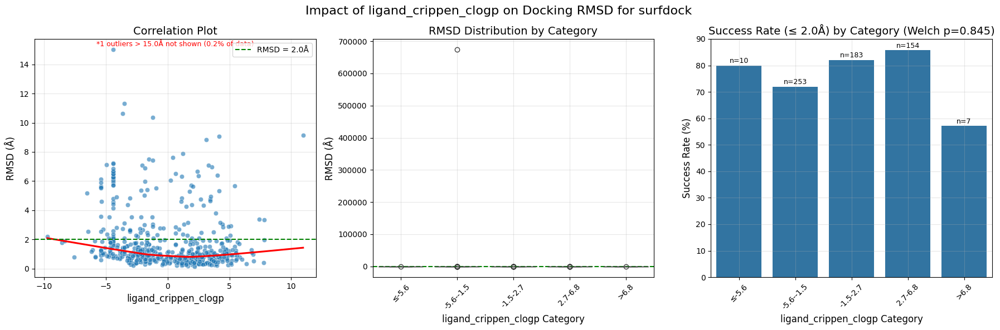


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate    mean_rmsd
0                         ≤-5.6           10     80.000000     1.815621
1                     -5.6--1.5          253     71.936759  2664.053595
2                      -1.5-2.7          183     81.967213     1.439506
3                       2.7-6.8          154     85.714286     1.389717
4                          >6.8            7     57.142857     2.825228

ANOVA test: F=0.348, p=0.845155
Welch ANOVA p=0.845155 (used unbalanced‑sizes variant)
Kruskal–Wallis H=35.623, p=0.000000

Impact of ligand_crippen_clogp on Docking RMSD for gnina
Pearson correlation: -0.2064, p-value: 0.000000
Spearman correlation: -0.1514, p-value: 0.000004


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


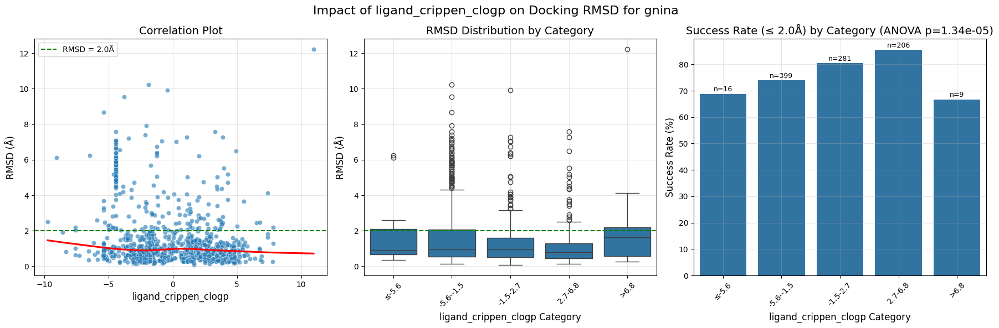


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-5.6           16     68.750000   1.787859
1                     -5.6--1.5          399     73.934837   1.841172
2                      -1.5-2.7          281     80.427046   1.394032
3                       2.7-6.8          206     85.436893   1.179380
4                          >6.8            9     66.666667   2.710453

ANOVA test: F=7.064, p=0.000013
Significant differences in RMSD across ligand_crippen_clogp categories
Welch ANOVA p=0.000013 (used unbalanced‑sizes variant)
Kruskal–Wallis H=9.980, p=0.040761

Impact of ligand_crippen_clogp on Docking RMSD for chai-1
Pearson correlation: -0.2120, p-value: 0.000000
Spearman correlation: -0.1035, p-value: 0.003112


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


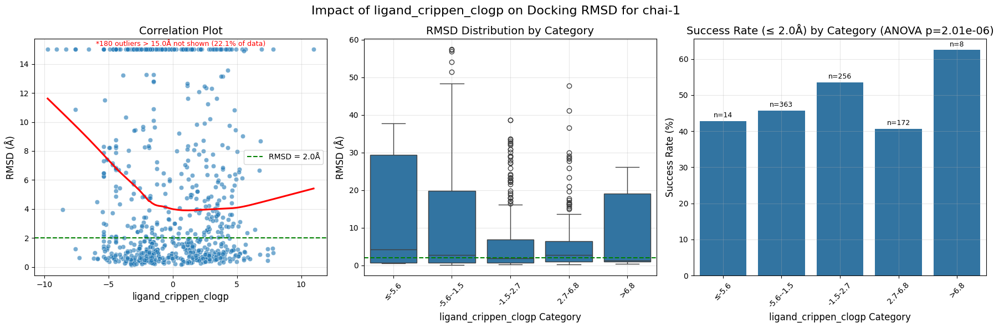


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-5.6           14     42.857143  13.304460
1                     -5.6--1.5          363     45.730028  10.235905
2                      -1.5-2.7          256     53.515625   6.177553
3                       2.7-6.8          172     40.697674   5.840905
4                          >6.8            8     62.500000   8.950131

ANOVA test: F=8.122, p=0.000002
Significant differences in RMSD across ligand_crippen_clogp categories
Welch ANOVA p=0.000002 (used unbalanced‑sizes variant)
Kruskal–Wallis H=5.789, p=0.215475


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of ligand_crippen_clogp on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.1241, p-value: 0.000378
Spearman correlation: -0.0699, p-value: 0.045807


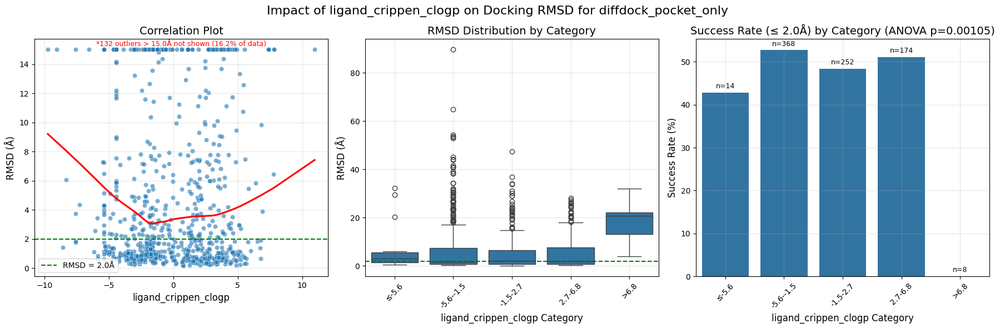


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-5.6           14     42.857143   7.842324
1                     -5.6--1.5          368     52.717391   7.579621
2                      -1.5-2.7          252     48.412698   5.491375
3                       2.7-6.8          174     51.149425   5.698149
4                          >6.8            8      0.000000  18.127074

ANOVA test: F=4.637, p=0.001048
Significant differences in RMSD across ligand_crippen_clogp categories
Welch ANOVA p=0.001048 (used unbalanced‑sizes variant)
Kruskal–Wallis H=13.475, p=0.009174

Impact of ligand_crippen_clogp on Docking RMSD for icm
Pearson correlation: -0.2173, p-value: 0.000000
Spearman correlation: -0.2180, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


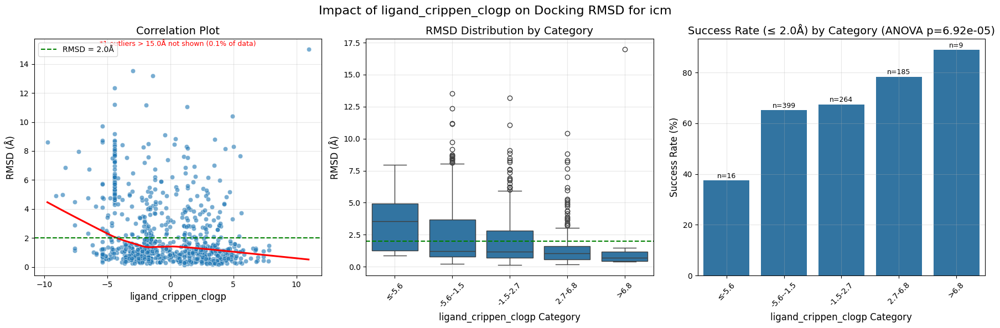


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-5.6           16     37.500000   3.553412
1                     -5.6--1.5          399     65.162907   2.457386
2                      -1.5-2.7          264     67.424242   2.076199
3                       2.7-6.8          185     78.378378   1.593579
4                          >6.8            9     88.888889   2.604359

ANOVA test: F=6.157, p=0.000069
Significant differences in RMSD across ligand_crippen_clogp categories
Welch ANOVA p=0.000069 (used unbalanced‑sizes variant)
Kruskal–Wallis H=28.779, p=0.000009

Impact of ligand_crippen_clogp on Docking RMSD for vina
Pearson correlation: -0.1582, p-value: 0.000207
Spearman correlation: -0.1822, p-value: 0.000018


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


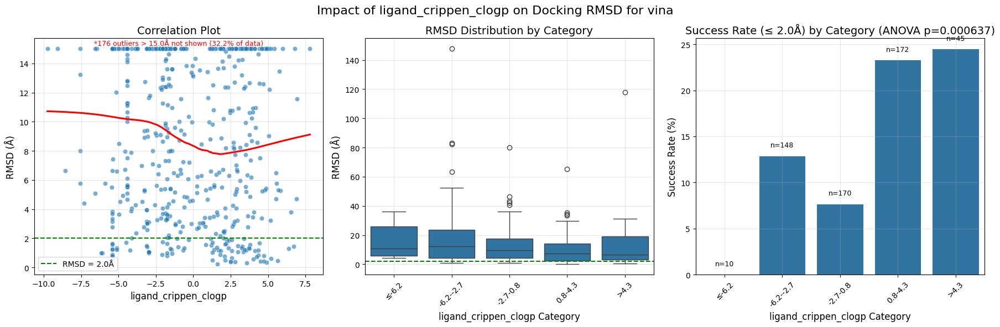


Success rates by category:
  ligand_crippen_clogp_category  total_count  success_rate  mean_rmsd
0                         ≤-6.2           10      0.000000  16.211595
1                     -6.2--2.7          148     12.837838  16.307974
2                      -2.7-0.8          170      7.647059  12.366819
3                       0.8-4.3          172     23.255814   9.733385
4                          >4.3           45     24.444444  12.868208

ANOVA test: F=4.945, p=0.000637
Significant differences in RMSD across ligand_crippen_clogp categories
Welch ANOVA p=0.000637 (used unbalanced‑sizes variant)
Kruskal–Wallis H=19.253, p=0.000701


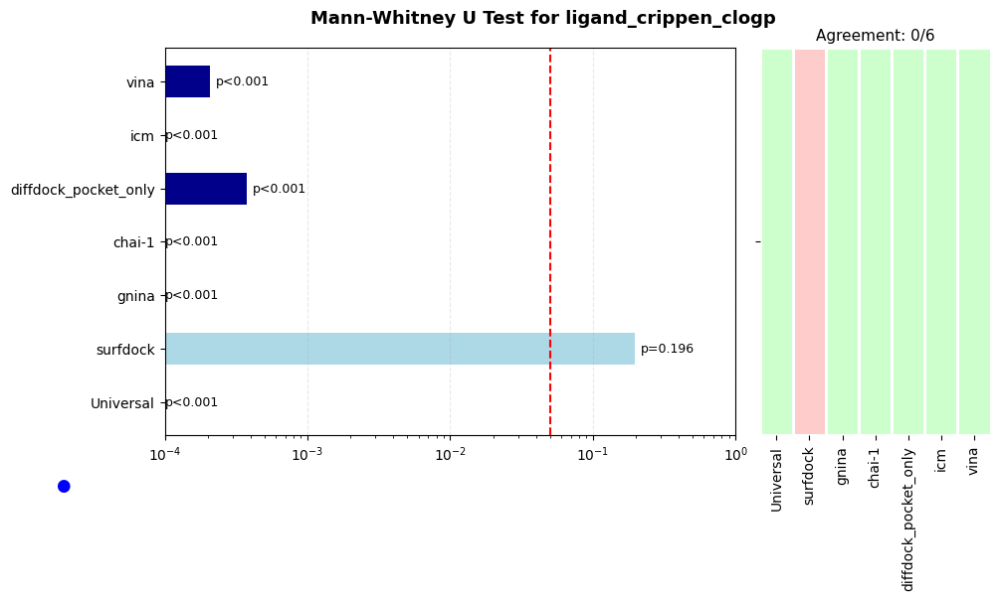

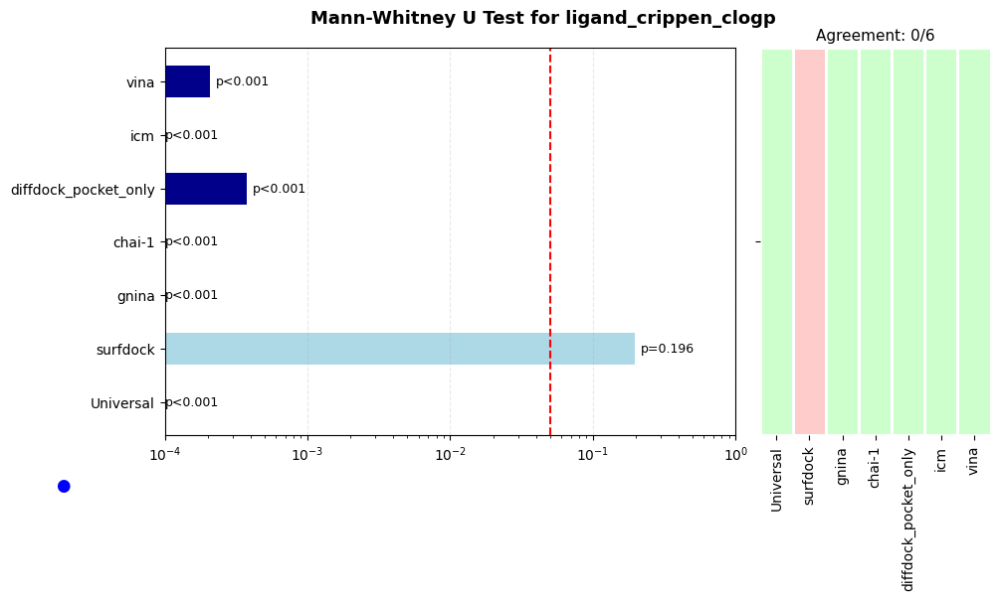

In [19]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_crippen_clogp",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_crippen_clogp",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_crippen_clogp",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_interacting_residues

Analyzing ligand_num_interacting_residues for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_interacting_residues':
Success cases: n=96, mean=8.929, std=2.832
Failure cases: n=330, mean=4.756, std=2.663
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.544
Chi-square test for distribution: p=0.000000

Impact of ligand_num_interacting_residues on Docking RMSD for surfdock
Pearson correlation: -0.0511, p-value: 0.207984
Spearman correlation: -0.1292, p-value: 0.001410


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


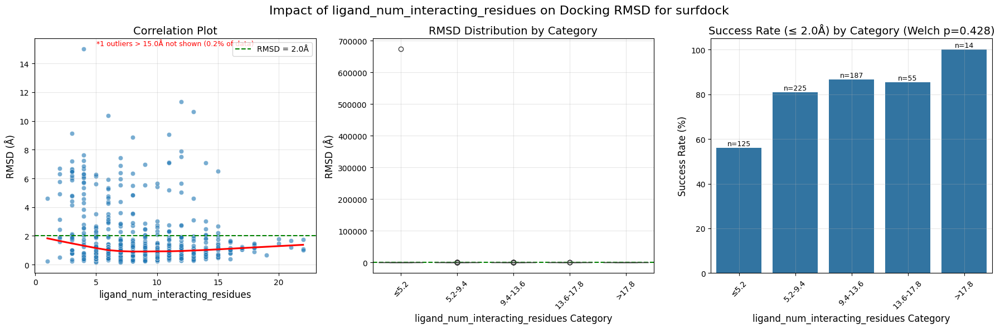


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤5.2          125     56.000000   
1                                  5.2-9.4          225     80.888889   
2                                 9.4-13.6          187     86.631016   
3                                13.6-17.8           55     85.454545   
4                                    >17.8           14    100.000000   

     mean_rmsd  
0  5390.575833  
1     1.500807  
2     1.405309  
3     1.412730  
4     1.293825  

ANOVA test: F=0.962, p=0.427699
Welch ANOVA p=0.427699 (used unbalanced‑sizes variant)
Kruskal–Wallis H=31.780, p=0.000002

Impact of ligand_num_interacting_residues on Docking RMSD for gnina
Pearson correlation: -0.3866, p-value: 0.000000
Spearman correlation: -0.4064, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


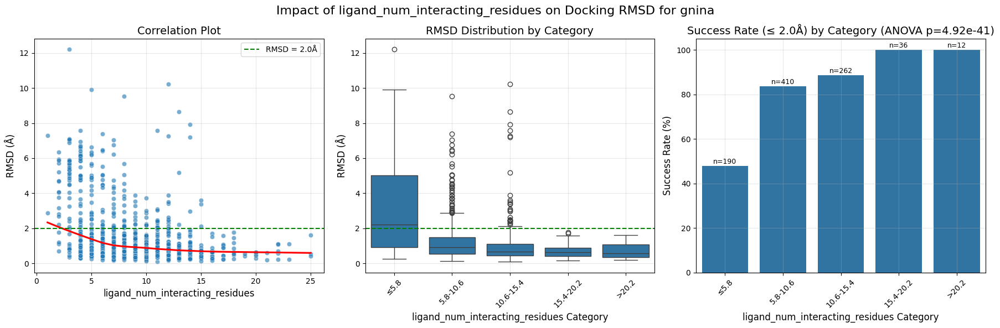


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤5.8          190     47.894737   
1                                 5.8-10.6          410     83.658537   
2                                10.6-15.4          262     88.549618   
3                                15.4-20.2           36    100.000000   
4                                    >20.2           12    100.000000   

   mean_rmsd  
0   2.994718  
1   1.295618  
2   1.069943  
3   0.716286  
4   0.695570  

ANOVA test: F=54.274, p=0.000000
Significant differences in RMSD across ligand_num_interacting_residues categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=139.851, p=0.000000

Impact of ligand_num_interacting_residues on Docking RMSD for chai-1
Pearson correlation: -0.1547, p-value: 0.000009
Spearman correlation: -0.2544, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


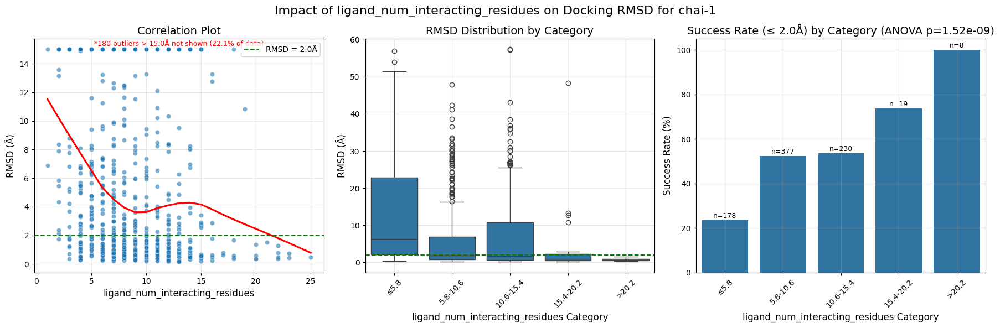


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤5.8          178     23.595506   
1                                 5.8-10.6          377     52.254642   
2                                10.6-15.4          230     53.478261   
3                                15.4-20.2           19     73.684211   
4                                    >20.2            8    100.000000   

   mean_rmsd  
0  12.654928  
1   6.180051  
2   8.178201  
3   5.178986  
4   0.765288  

ANOVA test: F=12.086, p=0.000000
Significant differences in RMSD across ligand_num_interacting_residues categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=69.571, p=0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of ligand_num_interacting_residues on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.3198, p-value: 0.000000
Spearman correlation: -0.4056, p-value: 0.000000


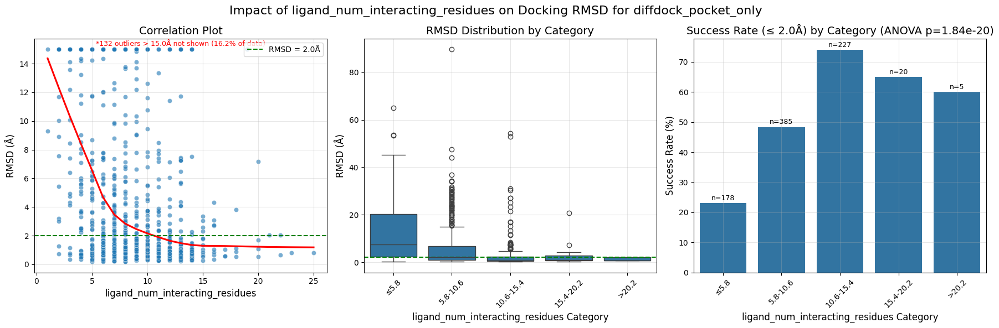


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤5.8          178     23.033708   
1                                 5.8-10.6          385     48.311688   
2                                10.6-15.4          227     74.008811   
3                                15.4-20.2           20     65.000000   
4                                    >20.2            5     60.000000   

   mean_rmsd  
0  12.655468  
1   6.185671  
2   3.168790  
3   2.773201  
4   1.276699  

ANOVA test: F=26.214, p=0.000000
Significant differences in RMSD across ligand_num_interacting_residues categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=123.339, p=0.000000

Impact of ligand_num_interacting_residues on Docking RMSD for icm
Pearson correlation: -0.3394, p-value: 0.000000
Spearman correlation: -0.3132, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


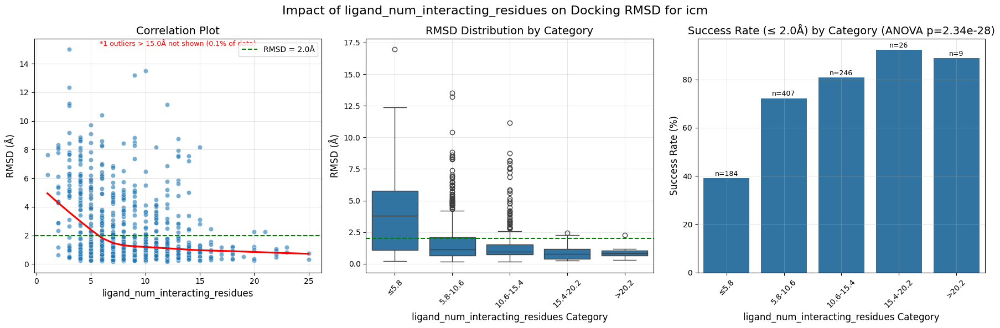


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤5.8          184     39.130435   
1                                 5.8-10.6          407     72.235872   
2                                10.6-15.4          246     80.894309   
3                                15.4-20.2           26     92.307692   
4                                    >20.2            9     88.888889   

   mean_rmsd  
0   3.828940  
1   1.892898  
2   1.593708  
3   0.885431  
4   0.937948  

ANOVA test: F=36.680, p=0.000000
Significant differences in RMSD across ligand_num_interacting_residues categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=90.609, p=0.000000

Impact of ligand_num_interacting_residues on Docking RMSD for vina
Pearson correlation: -0.0744, p-value: 0.082238
Spearman correlation: -0.1235, p-value: 0.003836


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


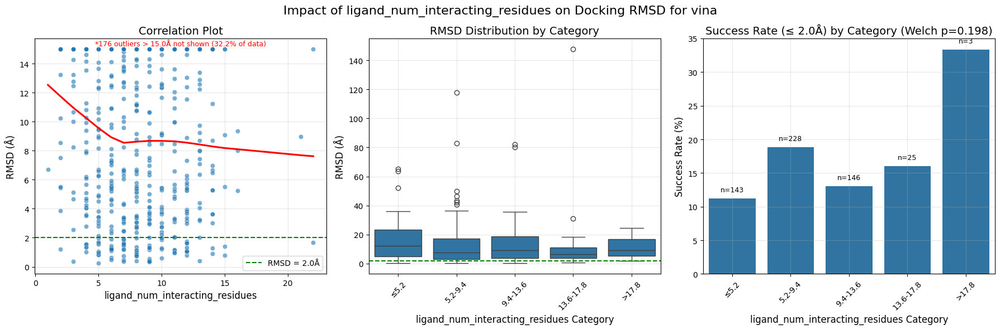


Success rates by category:
  ligand_num_interacting_residues_category  total_count  success_rate  \
0                                     ≤5.2          143     11.188811   
1                                  5.2-9.4          228     18.859649   
2                                 9.4-13.6          146     13.013699   
3                                13.6-17.8           25     16.000000   
4                                    >17.8            3     33.333333   

   mean_rmsd  
0  14.881644  
1  11.371197  
2  12.643365  
3  13.913970  
4  11.725481  

ANOVA test: F=1.508, p=0.198315
Welch ANOVA p=0.198315 (used unbalanced‑sizes variant)
Kruskal–Wallis H=13.174, p=0.010457


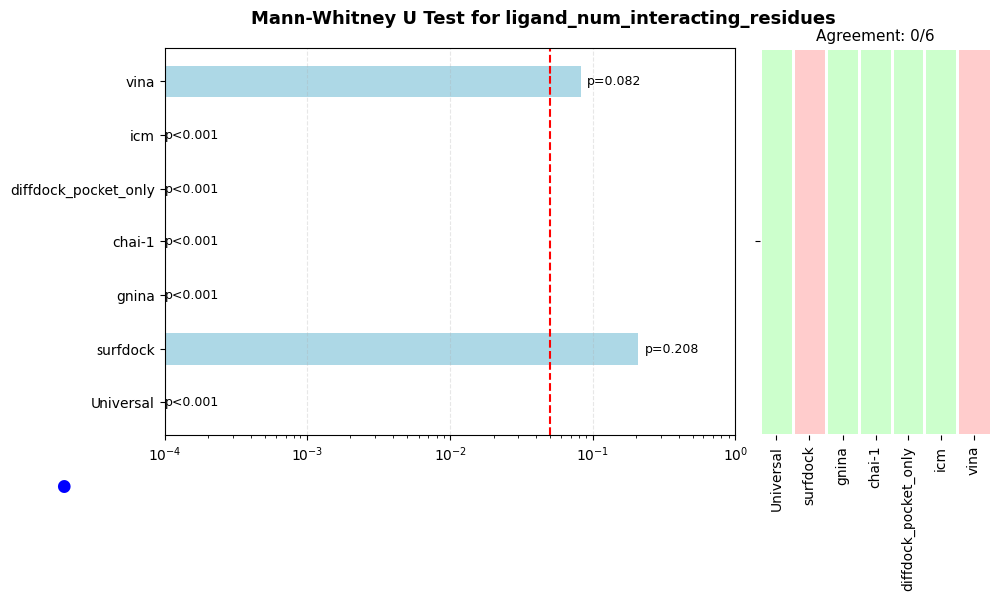

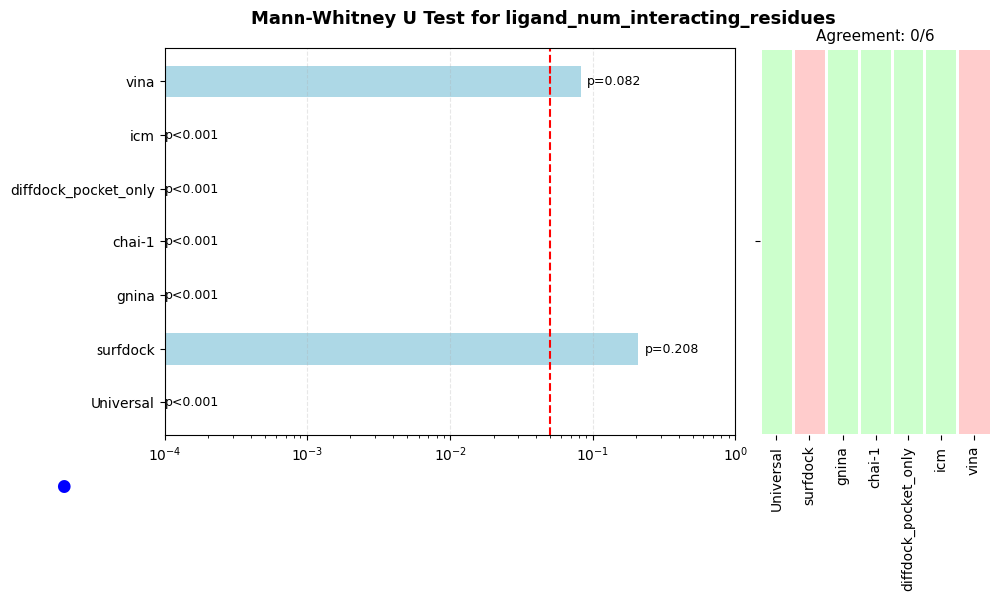

In [21]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_interacting_residues",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_interacting_residues",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_interacting_residues",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_interactions

Analyzing ligand_num_interactions for 16 cases where all methods succeed
and 55 cases where all methods fail

Universal analysis of continuous property 'ligand_num_interactions':
Success cases: n=96, mean=12.000, std=4.943
Failure cases: n=330, mean=6.634, std=4.347
Mann-Whitney U test: p=0.000000
Effect size (Cohen's d): 1.196
Chi-square test for distribution: p=0.000000

Impact of ligand_num_interactions on Docking RMSD for surfdock
Pearson correlation: -0.0561, p-value: 0.167130
Spearman correlation: -0.1032, p-value: 0.010854


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


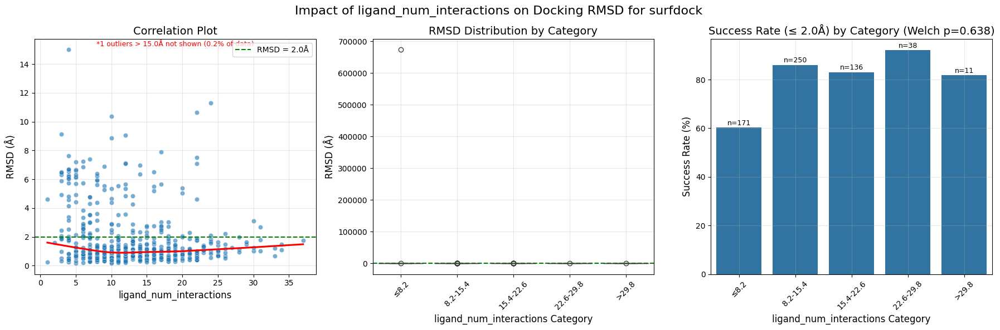


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate    mean_rmsd
0                             ≤8.2          171     60.233918  3940.958590
1                         8.2-15.4          250     86.000000     1.361343
2                        15.4-22.6          136     83.088235     1.476602
3                        22.6-29.8           38     92.105263     1.476302
4                            >29.8           11     81.818182     1.554131

ANOVA test: F=0.635, p=0.637875
Welch ANOVA p=0.637875 (used unbalanced‑sizes variant)
Kruskal–Wallis H=31.384, p=0.000003


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of ligand_num_interactions on Docking RMSD for gnina
Pearson correlation: -0.3648, p-value: 0.000000
Spearman correlation: -0.4045, p-value: 0.000000


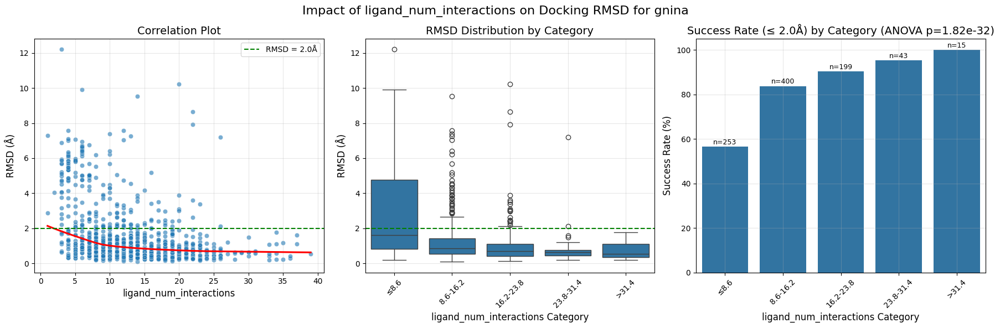


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤8.6          253     56.521739   2.630507
1                         8.6-16.2          400     83.750000   1.250744
2                        16.2-23.8          199     90.452261   1.014872
3                        23.8-31.4           43     95.348837   0.828487
4                            >31.4           15    100.000000   0.750511

ANOVA test: F=42.185, p=0.000000
Significant differences in RMSD across ligand_num_interactions categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=130.048, p=0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)



Impact of ligand_num_interactions on Docking RMSD for chai-1
Pearson correlation: -0.1360, p-value: 0.000099
Spearman correlation: -0.2439, p-value: 0.000000


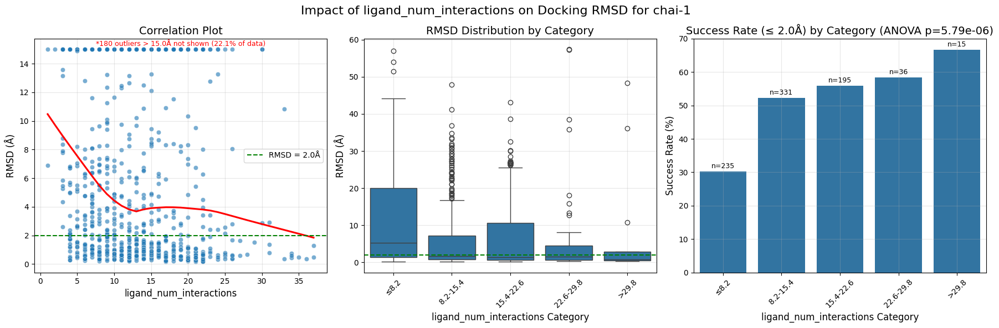


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤8.2          235     30.212766  11.228310
1                         8.2-15.4          331     52.265861   6.138855
2                        15.4-22.6          195     55.897436   7.689312
3                        22.6-29.8           36     58.333333   8.053759
4                            >29.8           15     66.666667   7.200044

ANOVA test: F=7.539, p=0.000006
Significant differences in RMSD across ligand_num_interactions categories
Welch ANOVA p=0.000006 (used unbalanced‑sizes variant)
Kruskal–Wallis H=43.680, p=0.000000

Impact of ligand_num_interactions on Docking RMSD for diffdock_pocket_only
Pearson correlation: -0.3044, p-value: 0.000000
Spearman correlation: -0.3811, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


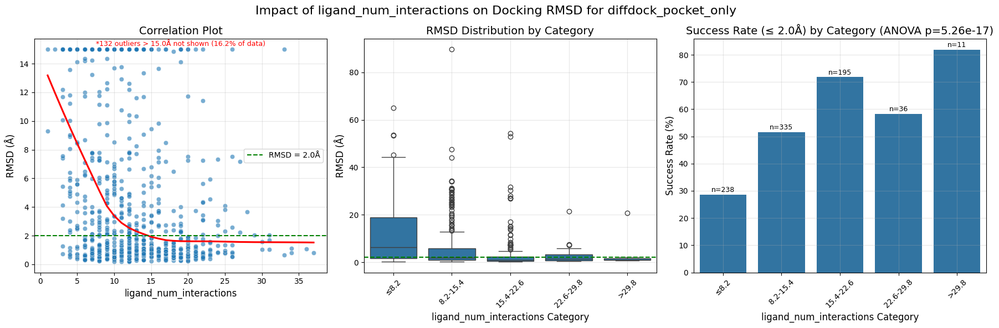


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤8.2          238     28.571429  11.318060
1                         8.2-15.4          335     51.641791   5.732929
2                        15.4-22.6          195     71.794872   3.423569
3                        22.6-29.8           36     58.333333   2.801756
4                            >29.8           11     81.818182   2.966457

ANOVA test: F=21.671, p=0.000000
Significant differences in RMSD across ligand_num_interactions categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=107.099, p=0.000000

Impact of ligand_num_interactions on Docking RMSD for icm
Pearson correlation: -0.2954, p-value: 0.000000
Spearman correlation: -0.2834, p-value: 0.000000


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


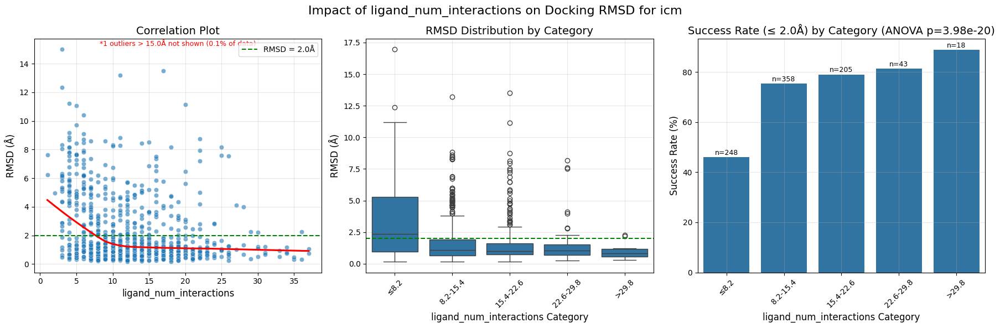


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤8.2          248     45.967742   3.358317
1                         8.2-15.4          358     75.418994   1.734527
2                        15.4-22.6          205     79.024390   1.737116
3                        22.6-29.8           43     81.395349   1.661795
4                            >29.8           18     88.888889   0.947789

ANOVA test: F=25.669, p=0.000000
Significant differences in RMSD across ligand_num_interactions categories
Welch ANOVA p=0.000000 (used unbalanced‑sizes variant)
Kruskal–Wallis H=71.898, p=0.000000

Impact of ligand_num_interactions on Docking RMSD for vina
Pearson correlation: -0.0737, p-value: 0.085205
Spearman correlation: -0.1234, p-value: 0.003887


/Users/aoxu/projects/DrugDiscovery/PoseBench/notebooks/plinder_analysis_utils.py:1718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[property_category] = pd.cut(df[property_name], bins=bins, labels=bin_labels)


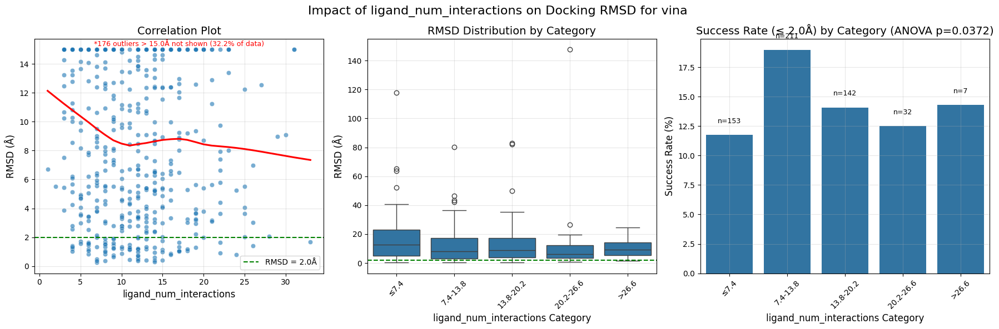


Success rates by category:
  ligand_num_interactions_category  total_count  success_rate  mean_rmsd
0                             ≤7.4          153     11.764706  15.542605
1                         7.4-13.8          211     18.957346  10.976204
2                        13.8-20.2          142     14.084507  12.562455
3                        20.2-26.6           32     12.500000  12.411694
4                            >26.6            7     14.285714  10.660649

ANOVA test: F=2.569, p=0.037196
Significant differences in RMSD across ligand_num_interactions categories
Welch ANOVA p=0.037196 (used unbalanced‑sizes variant)
Kruskal–Wallis H=15.045, p=0.004609


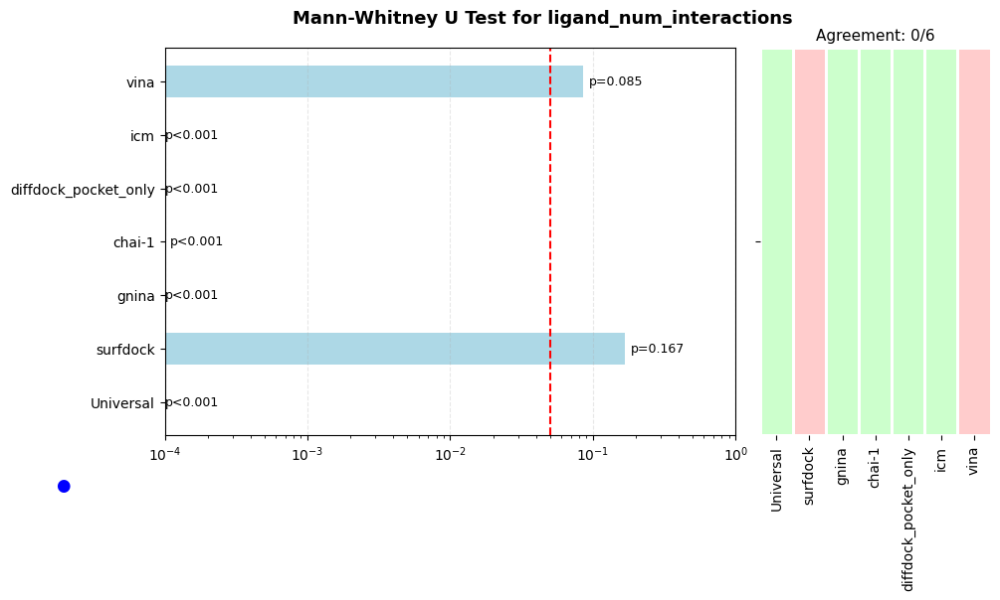

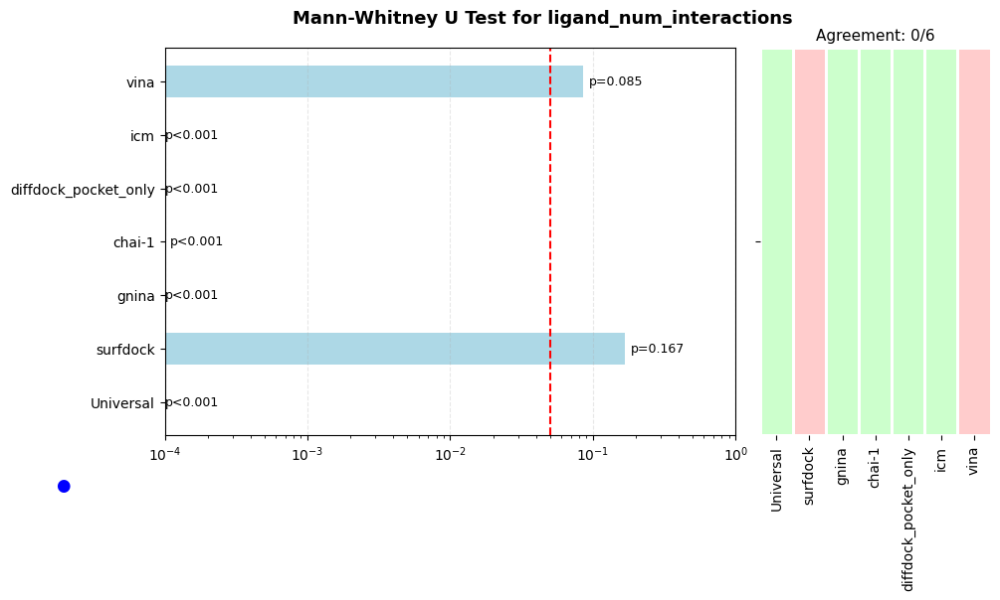

In [22]:
# First, analyze a property universally
universal_result = property_analysis.analyze_property_universal(
    methods=methods,
    property_name="ligand_num_interactions",
    property_type="continuous",
    plot=False  # Don't generate plots yet
)

# Then analyze the same property for each individual method
method_results = {}
for method in methods:
    method_results[method] = property_analysis.analyze_property_single_method(
        method=method,
        property_name="ligand_num_interactions",
        property_type="continuous",
        plot=True  # Don't generate plots yet
    )

# Now plot the p-value comparison
property_analysis.plot_property_pvalue_comparison(
    property_name="ligand_num_interactions",
    property_type="continuous",
    universal_result=universal_result,
    method_results=method_results,
    log_scale=True  # Use log scale for better visibility
)

#### ligand_num_neighboring_residues